#  Rainfall Weather Forecasting

# 1. Introduction

# Project Description
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:

# Data Attributes:

1. **Date:** The date of observation
2. **Location:** The common name of the location of the weather station
3. **MinTemp:** The minimum temperature in degrees Celsius
4. **MaxTemp:** The maximum temperature in degrees Celsius
5. **Rainfall:** The amount of rainfall recorded for the day in mm
6. **Evaporation:** The so-called Class A pan evaporation (mm) in the 24 hours to 9 am
7. **Sunshine:** The number of hours of bright sunshine in the day
8. **WindGustDir:** The direction of the strongest wind gust in the 24 hours to midnight
9. **WindGustSpeed:** The speed (km/h) of the strongest wind gust in the 24 hours to midnight
10. **WindDir9am:** Direction of the wind at 9 am
11. **WindDir3pm:** Direction of the wind at 3 pm
12. **WindSpeed9am:** Wind speed (km/hr) averaged over 10 minutes prior to 9 am
13. **WindSpeed3pm:** Wind speed (km/hr) averaged over 10 minutes prior to 3 pm
14. **Humidity9am:** Humidity (percent) at 9 am
15. **Humidity3pm:** Humidity (percent) at 3 pm
16. **Pressure9am:** Atmospheric pressure (hpa) reduced to mean sea level at 9 am
17. **Pressure3pm:** Atmospheric pressure (hpa) reduced to mean sea level at 3 pm
18. **Cloud9am:** Fraction of sky obscured by cloud at 9 am
19. **Cloud3pm:** Fraction of sky obscured by cloud
20. **Temp9am:** Temperature (degrees Celsius) at 9 am
21. **Temp3pm:** Temperature (degrees Celsius) at 3 pm
22. **RainToday:** Boolean: 1 if precipitation (mm) in the 24 hours to 9 am exceeds 1 mm, otherwise 0
23. **RainTomorrow:** The amount of next day rain in mm. Used to create response variable. A kind of measure of the "risk".


# Objectives:
1. **Binary Classification:** Develop a predictive model to forecast whether or not it will rain tomorrow.
2. **Regression:** Develop a predictive model to predict the amount of rainfall for the next day.

### Project Type: 
**Supervised Machine Learning**

**Subtypes:**
1. **Binary Classification**: Predicting whether it will rain tomorrow (Yes/No).
2. **Regression**: Predicting the amount of rainfall for the next day in millimeters.


# Input:
- The dataset containing 10 years of daily weather observations from various locations in Australia, with attributes such as temperature, humidity, wind speed, and more.


# Expected Output:
1. **Binary Classification Output:** A prediction of whether it will rain tomorrow (Yes/No).
2. **Regression Output:** A prediction of the amount of rainfall expected for the next day in millimeters.

# 2. Data Cleaning

# Import important library :

In [190]:
import warnings
warnings.simplefilter("ignore")
import joblib

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
from scipy.stats import zscore

from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV 



import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pickle
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesClassifier, ExtraTreesRegressor
from xgboost import XGBRegressor

# 1.Binary Classification:-Predicting whether it will rain tomorrow (Yes/No).

In [191]:
df= pd.read_csv(r"https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Rainfall%20Forecast/Rainfall.csv")

In [192]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [193]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [194]:
df[4000:4025]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
4000,2016-09-10,Williamtown,12.5,21.4,2.2,NaN,NaN,NW,69.0,NW,...,82.0,42.0,1015.4,1012.5,8.0,NaN,14.6,20.8,Yes,No
4001,2016-09-11,Williamtown,10.4,21.9,0.2,NaN,NaN,NaN,NaN,WNW,...,60.0,48.0,1019.1,1016.6,NaN,NaN,16.9,18.5,No,No
4002,2016-09-12,Williamtown,7.0,20.4,0.0,18.4,NaN,SSE,33.0,WNW,...,70.0,68.0,1021.2,1018.4,NaN,NaN,15.6,19.3,No,No
4003,2016-09-13,Williamtown,9.7,21.0,0.0,3.0,NaN,SE,22.0,NW,...,91.0,74.0,1021.3,1017.8,8.0,1.0,15.4,19.4,No,Yes
4004,2016-09-14,Williamtown,15.4,22.8,7.4,2.4,NaN,NaN,NaN,NNW,...,94.0,71.0,1015.5,1010.1,8.0,7.0,17.1,22.3,Yes,No
4005,2016-09-15,Williamtown,14.9,22.4,0.0,NaN,NaN,NaN,NaN,WNW,...,47.0,36.0,1011.7,1009.1,NaN,NaN,18.1,21.0,No,No
4006,2016-09-16,Williamtown,11.5,22.3,0.6,NaN,NaN,WNW,50.0,WNW,...,64.0,42.0,1017.0,1015.2,4.0,NaN,16.3,21.4,No,No
4007,2016-09-17,Williamtown,9.0,21.8,0.0,NaN,NaN,NaN,NaN,NW,...,62.0,48.0,1022.3,1018.4,NaN,2.0,17.2,19.4,No,No
4008,2016-09-18,Williamtown,13.5,17.7,0.0,NaN,NaN,WNW,74.0,WNW,...,75.0,83.0,1012.6,1004.8,7.0,8.0,15.3,15.8,No,Yes
4009,2016-09-19,Williamtown,13.0,21.8,14.4,24.8,NaN,WNW,80.0,WNW,...,61.0,46.0,1009.3,1008.2,NaN,NaN,17.5,21.1,Yes,No


In [195]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


# Exploratory Data Analysis (EDA)

In [196]:
df.shape

(8425, 23)

The dataset consists of 8425 rows and 23 columns, which include both features and labels.

In [197]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

Missing values were detected in the columns.

In [198]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [199]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

The dataset comprises integers, floats, and object data types. The date column is currently represented as an object, requiring conversion to datetime format.

In [200]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [201]:
df.duplicated().sum()

1663

Finding 1,663 duplicate rows in dataset indicates that there are repeated entries which might need to be addressed during the data cleaning phase. Handling duplicates is an essential step in ensuring the quality and accuracy of your predictive models.

In [202]:
df=df.drop_duplicates()

In [203]:
df.duplicated().sum()

0

In the dataset, Now there are no duplicate values present.

In [204]:
# checking the number of unique values in each column
df.nunique().to_frame("no.of unique values")

,no.of unique values
Date,3004
Location,12
MinTemp,285
MaxTemp,331
Rainfall,250
Evaporation,116
Sunshine,140
WindGustDir,16
WindGustSpeed,52
WindDir9am,16


In [205]:
df['RainTomorrow'].value_counts()

RainTomorrow
No     5052
Yes    1572
Name: count, dtype: int64

Here, we can observe that the dataset is not balanced and there is a class imbalance issue.

In [206]:
# checking the value counts of each column
for i in df.columns:
    print(df[i].value_counts())
    print('/n')

Date
2011-02-11    4
2011-02-18    4
2011-03-18    4
2011-03-19    4
2011-03-20    4
             ..
2016-11-03    1
2016-11-02    1
2016-11-01    1
2016-10-31    1
2013-06-08    1
Name: count, Length: 3004, dtype: int64
/n
Location
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: count, dtype: int64
/n
MinTemp
13.2    58
12.0    57
14.8    53
12.7    53
10.8    52
        ..
26.6     1
28.0     1
26.9     1
1.4      1
26.0     1
Name: count, Length: 285, dtype: int64
/n
MaxTemp
19.0    66
19.8    62
20.8    54
23.8    54
25.0    54
        ..
38.9     1
10.3     1
9.4      1
42.5     1
43.5     1
Name: count, Length: 331, dtype: int64
/n
Rainfall
0.0      4334
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
128.0    

From the above result, it's evident that there are no zero values or white spaces present in the dataset.

In [207]:
nul_val=df.isnull()

In [208]:
#returns counts of values where True if null
for column in nul_val.columns.values.tolist():
    print(column)
    print (nul_val[column].value_counts())
    print("")  

Date
Date
False    6762
Name: count, dtype: int64

Location
Location
False    6762
Name: count, dtype: int64

MinTemp
MinTemp
False    6692
True       70
Name: count, dtype: int64

MaxTemp
MaxTemp
False    6705
True       57
Name: count, dtype: int64

Rainfall
Rainfall
False    6624
True      138
Name: count, dtype: int64

Evaporation
Evaporation
False    3841
True     2921
Name: count, dtype: int64

Sunshine
Sunshine
False    3526
True     3236
Name: count, dtype: int64

WindGustDir
WindGustDir
False    5820
True      942
Name: count, dtype: int64

WindGustSpeed
WindGustSpeed
False    5820
True      942
Name: count, dtype: int64

WindDir9am
WindDir9am
False    5968
True      794
Name: count, dtype: int64

WindDir3pm
WindDir3pm
False    6468
True      294
Name: count, dtype: int64

WindSpeed9am
WindSpeed9am
False    6699
True       63
Name: count, dtype: int64

WindSpeed3pm
WindSpeed3pm
False    6662
True      100
Name: count, dtype: int64

Humidity9am
Humidity9am
False    6708
True   

In [209]:
#Checking null values-
df.isnull().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

In [210]:
df.isnull().sum().sum()

16513

<Axes: >

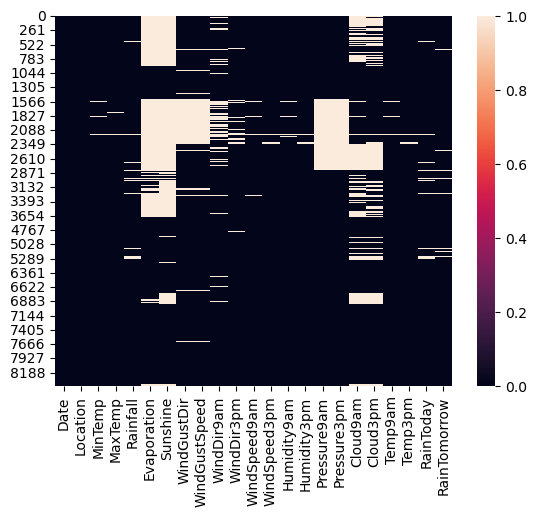

In [211]:
sns.heatmap(df.isnull())

In the dataset, there are no null values present.

In [212]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


# To handle null values in the dataset

In [213]:
# Mode Imputation for Categorical Columns:
cols = ['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow', 'Cloud9am', 'Cloud3pm']
for col in cols:
    df[col] = df[col].fillna(df[col].mode()[0])


In [214]:
mean_cols = ['MaxTemp', 'MinTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 
             'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 
             'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
for col in mean_cols:
    df[col] = df[col].fillna(df[col].mean())


In [215]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [216]:
df.isnull().sum().sum()

0

<Axes: >

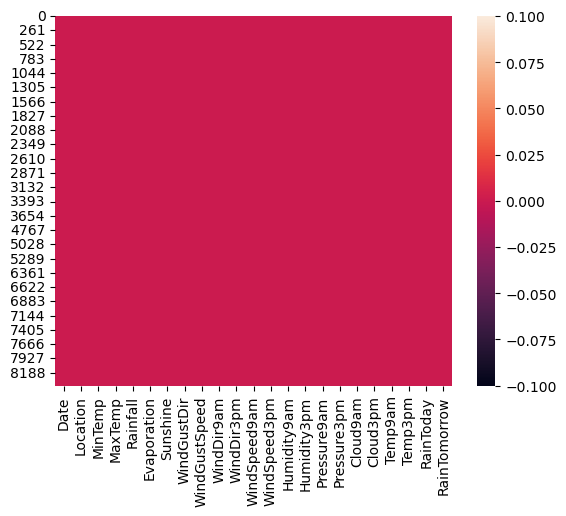

In [217]:
sns.heatmap(df.isnull())

In the dataset, there are no null values present.

In [218]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.109145,24.098345,2.780148,5.302395,7.890896,38.977663,12.782206,17.571150,67.506559,50.467147,1017.626311,1015.119923,5.071724,5.074534,17.895038,22.708561
std,5.540667,6.130123,10.482769,3.343713,2.733639,13.376457,9.787577,9.548634,17.182700,18.498341,6.027914,5.967638,2.746129,2.617013,5.722411,5.971845
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.600000,0.000000,4.000000,7.890896,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000
50%,13.109145,23.500000,0.000000,5.302395,7.890896,38.977663,11.000000,17.000000,68.000000,50.000000,1017.626311,1015.119923,7.000000,7.000000,17.900000,22.300000
75%,17.400000,28.400000,1.200000,5.302395,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,7.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


# Observations:

1. The count of all columns is identical, indicating there are no null values in the dataset.
2. Columns such as MaxTemp, Rainfall, WindSpeed9am, WindSpeed3pm, Humidity3pm, and Temp3pm have a mean greater than the median, suggesting right-skewed data.
3. Columns like Cloud9am and Humidity9am have a median greater than the mean, indicating left-skewed data.
4. There is a substantial difference between the 75th percentile and the maximum values in columns like MinTemp, MaxTemp, Rainfall, Evaporation, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity3pm, Pressure3pm, Temp9am, and Temp3pm.

In [219]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.900000,0.6,5.302395,7.890896,W,44.000000,W,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.100000,0.0,5.302395,7.890896,WNW,44.000000,NNW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.700000,0.0,5.302395,7.890896,WSW,46.000000,W,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.000000,0.0,5.302395,7.890896,NE,24.000000,SE,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.300000,1.0,5.302395,7.890896,W,41.000000,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.400000,0.0,5.302395,7.890896,E,31.000000,SE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.300000,0.0,5.302395,7.890896,NNW,22.000000,SE,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.900000,0.0,5.302395,7.890896,N,37.000000,SE,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.000000,0.0,5.302395,7.890896,SE,28.000000,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [220]:
df=df.set_index('Date')
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.6,5.302395,7.890896,W,44.000000,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,0.0,5.302395,7.890896,WNW,44.000000,NNW,WSW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,0.0,5.302395,7.890896,WSW,46.000000,W,WSW,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,0.0,5.302395,7.890896,NE,24.000000,SE,E,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,1.0,5.302395,7.890896,W,41.000000,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,0.0,5.302395,7.890896,E,31.000000,SE,ENE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,0.0,5.302395,7.890896,NNW,22.000000,SE,N,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,0.0,5.302395,7.890896,N,37.000000,SE,WNW,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No


# 3. Data Visualization

# 1.Univariate Analysis-

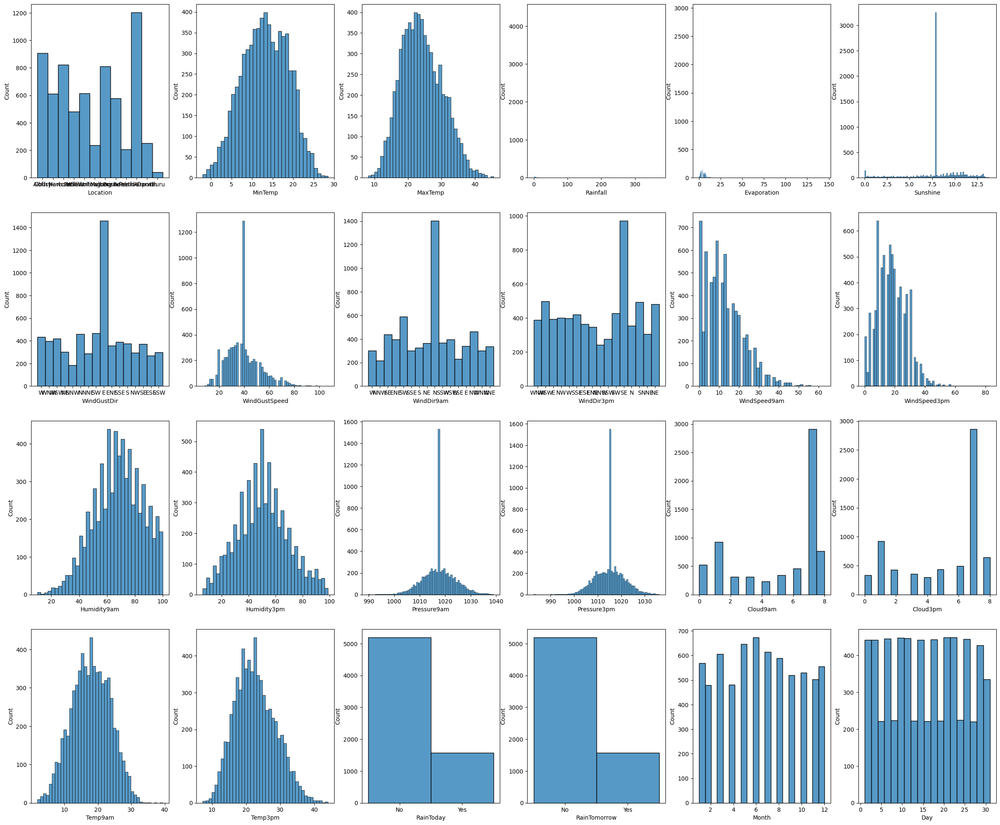

In [42]:
plt.figure(figsize=(30,25))
plotnumber=1

for i in df.columns:
    if plotnumber<=24:
        ax=plt.subplot(4,6,plotnumber)
        sns.histplot(df[i])
        plt.xlabel(i)
    plotnumber+=1
plt.show() 

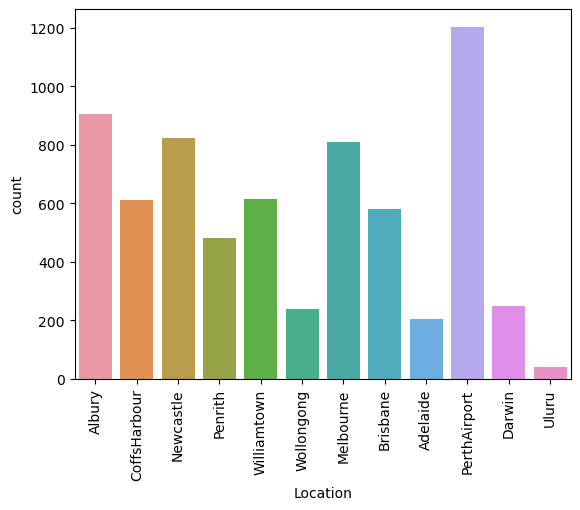

In [44]:
sns.countplot(x=df['Location'])
plt.xticks(rotation=90)
plt.show()

The count for Perth Airport is the highest among all locations.

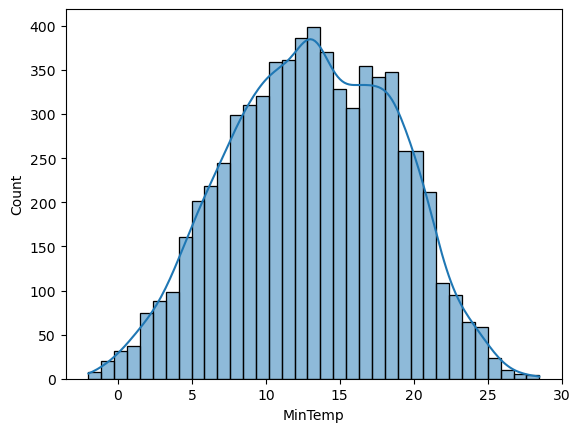

In [46]:
sns.histplot(df['MinTemp'],kde=True)
plt.show()

The minimum temperature ranges from 0 to 30 degrees Celsius.

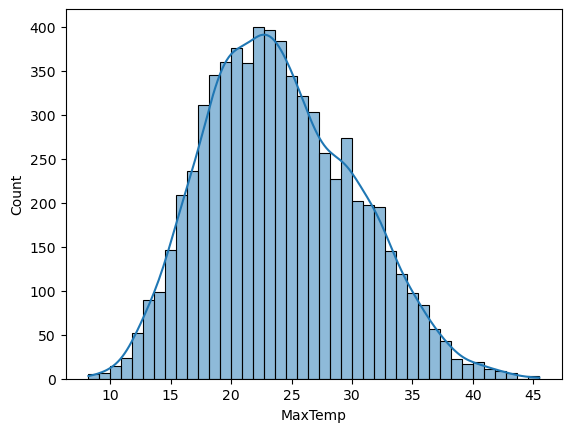

In [47]:
sns.histplot(df['MaxTemp'],kde=True)
plt.show()

The maximum temperature ranges from 9 to 45 degrees Celsius.

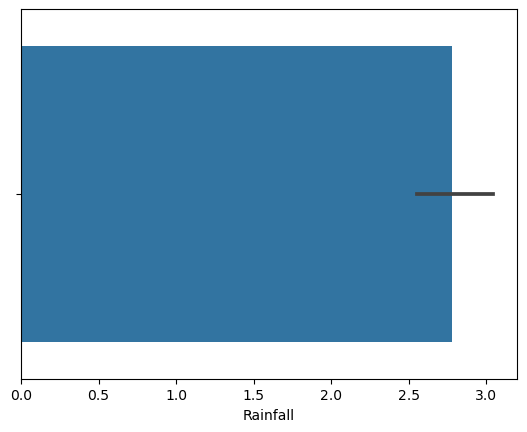

In [50]:
sns.barplot(x=df['Rainfall'])
plt.show()

Rainfall ranges from 0 to ~2.8 mm.

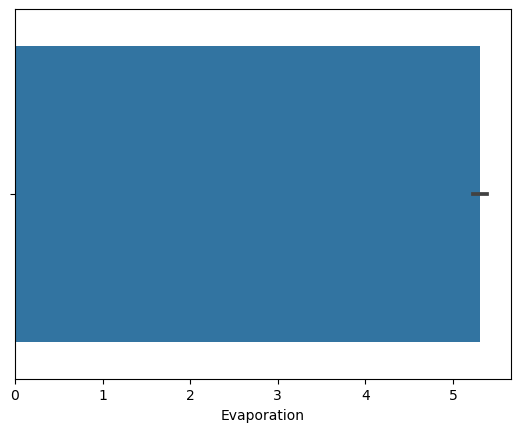

In [51]:
sns.barplot(x=df['Evaporation'])
plt.show()

Evaporation ranges from 0 to 5.3 mm.

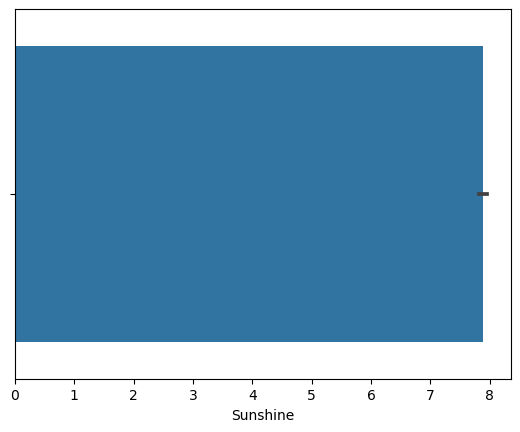

In [53]:
sns.barplot(x=df['Sunshine'])
plt.show()

Sunshine ranges from 0 to 7.9 hours.

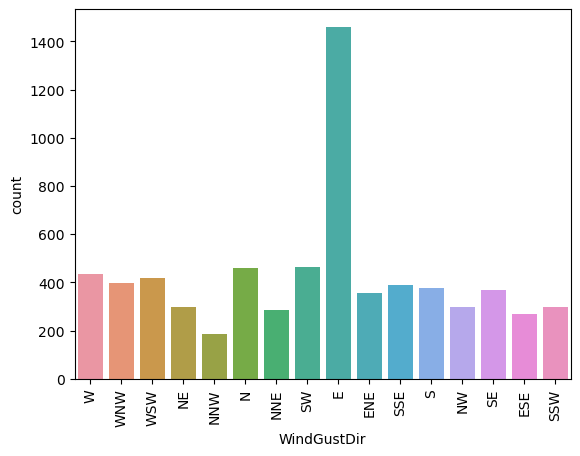

In [54]:
sns.countplot(x=df['WindGustDir'])
plt.xticks(rotation=90)
plt.show()

The strongest wind gust in the 24 hours leading up to midnight is predominantly from the East.

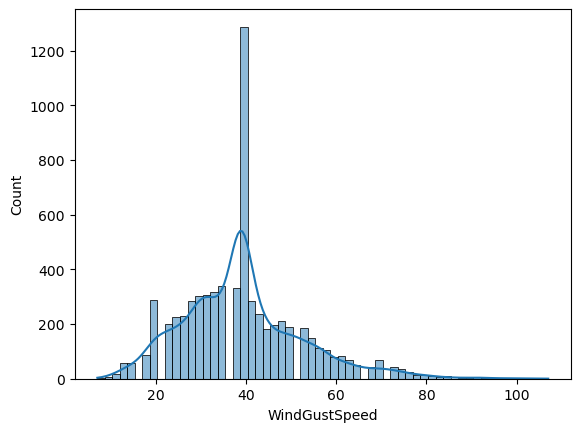

In [58]:
sns.histplot(x=df['WindGustSpeed'],kde=True)
plt.show()

The WindGustSpeed ranges from 15 to 105 km/hr.

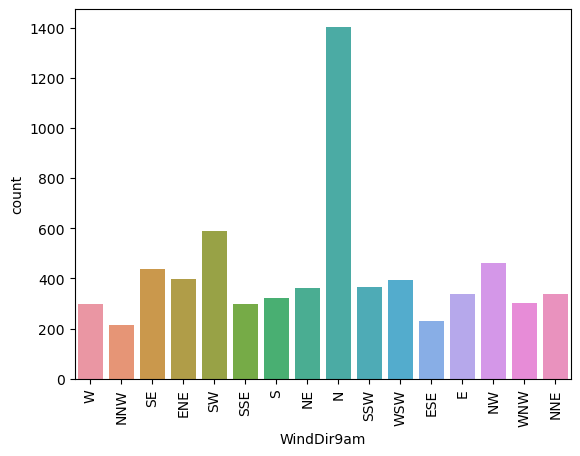

In [60]:
sns.countplot(x=df['WindDir9am'])
plt.xticks(rotation=90)
plt.show()

The wind direction at 9 am is predominantly in the north direction.

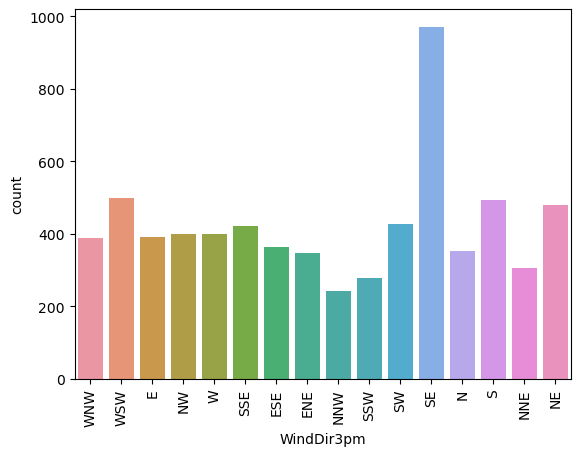

In [61]:
sns.countplot(x=df['WindDir3pm'])
plt.xticks(rotation=90)
plt.show()

The wind direction at 3 pm is predominantly in the southeast direction.

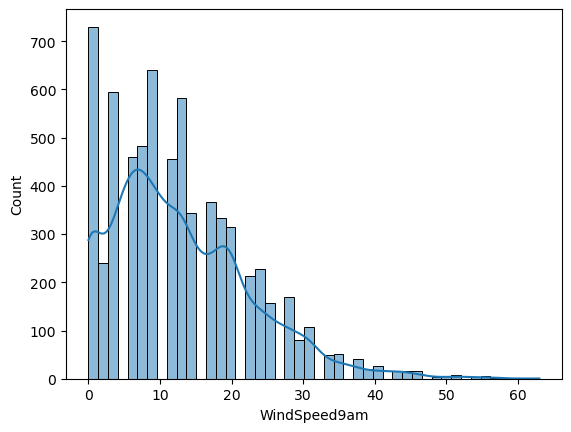

In [62]:
sns.histplot(x=df['WindSpeed9am'],kde=True)
plt.show()

The wind speed at 9 am ranges from 0 to 62 km/hr.

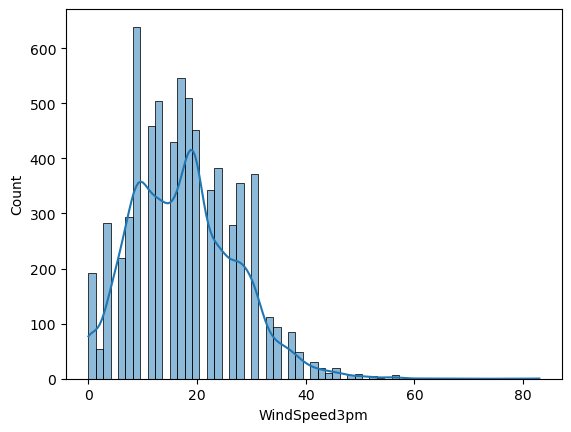

In [64]:
sns.histplot(x=df['WindSpeed3pm'], kde=True)
plt.show()

The wind speed at 3 pm ranges from 0 to 82 km/hr.

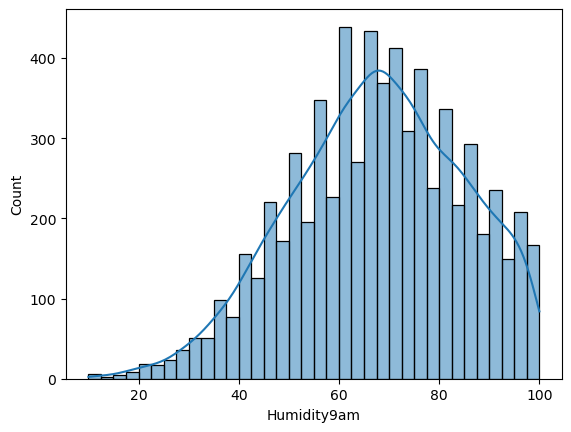

In [65]:
sns.histplot(x=df['Humidity9am'],kde=True)
plt.show()

The humidity at 9 am ranges from 10 to 100%.

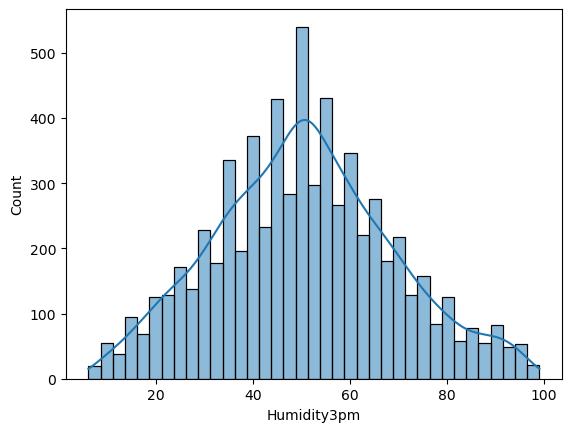

In [66]:
sns.histplot(x=df['Humidity3pm'],kde=True)
plt.show()

The humidity at 3 pm ranges from 10 to 100%.

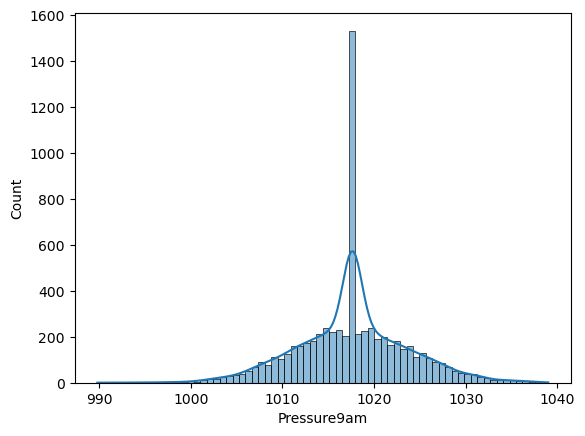

In [67]:
sns.histplot(x=df['Pressure9am'],kde=True)
plt.show()

The atmospheric pressure at 9 am ranges from 990 to 1039 hPa.

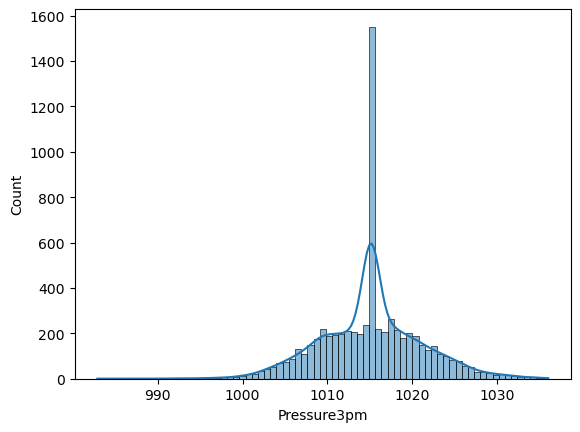

In [68]:
sns.histplot(x=df['Pressure3pm'],kde=True)
plt.show()

The atmospheric pressure at 3 pm ranges from 980 to 1035 hPa.

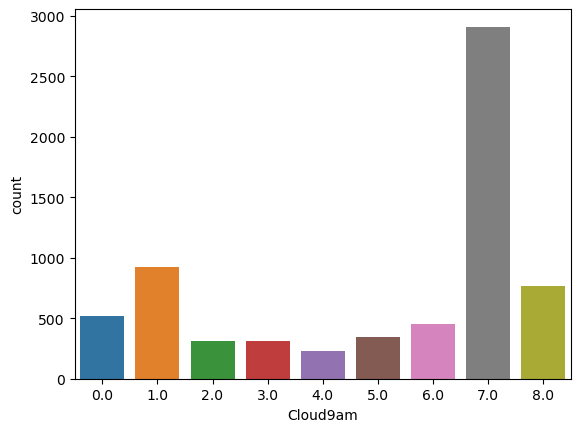

In [74]:
sns.countplot(x=df['Cloud9am'])
plt.show()

The fraction of sky obscured by clouds at 9 am ranges from 0 to 8, with the count of 7 being the highest.

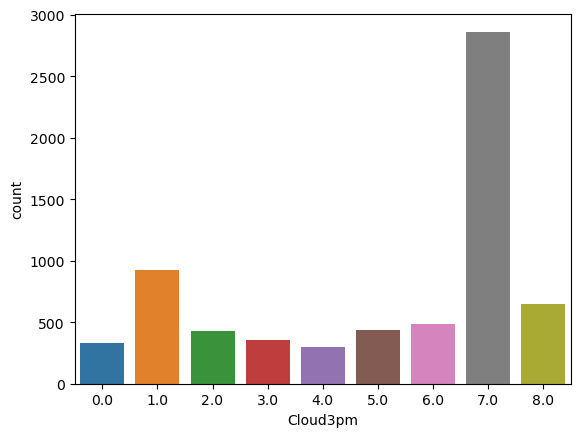

In [72]:
sns.countplot(x=df['Cloud3pm'])
plt.show()

The fraction of sky obscured by clouds at 3 pm ranges from 0 to 8, with the count of 7 being the highest.

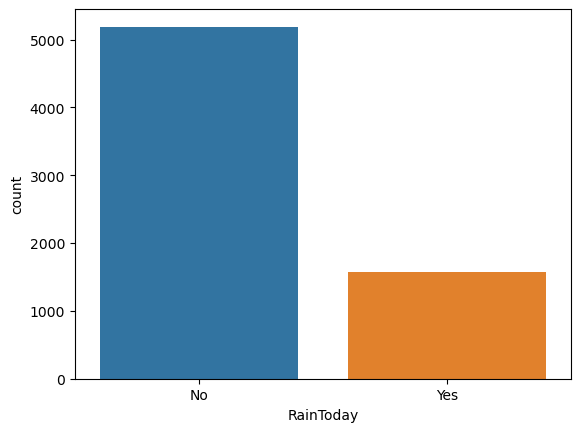

In [77]:
sns.countplot(x=df['RainToday'])
plt.show()

Most areas today have a low chance of rain, with the majority indicating "No" chances.

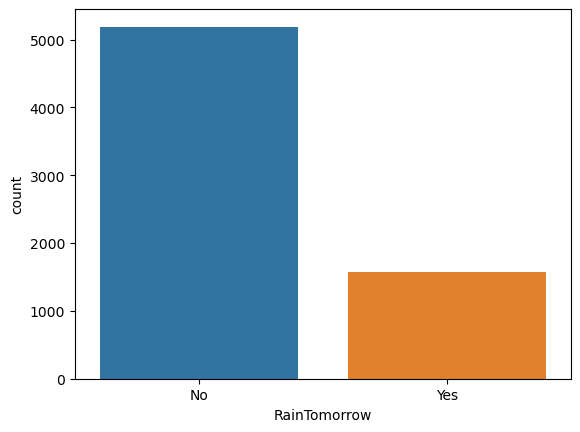

In [78]:
sns.countplot(x=df['RainTomorrow'])
plt.show()

In most areas tomorrow, the chances of rain are low, with the majority indicating "No" chances.

# 2.Bivariate analysis-

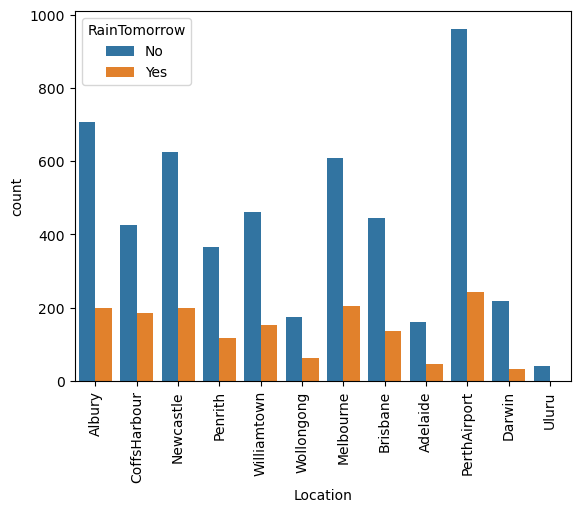

In [80]:
sns.countplot(x='Location',hue='RainTomorrow',data=df)
plt.xticks(rotation=90)
plt.show()

Based on the graph provided, it's evident that tomorrow's chances of rain are generally low across all areas except for Uluru, where there's a higher likelihood of rainfall.

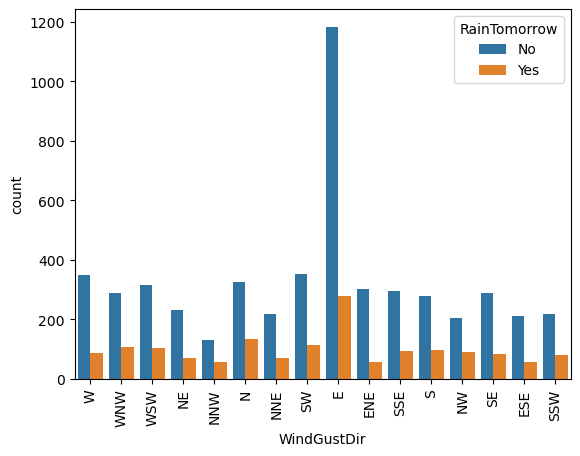

In [81]:
sns.countplot(x='WindGustDir',hue='RainTomorrow',data=df)
plt.xticks(rotation=90)
plt.show()

It appears that regardless of the direction of the strongest wind, the chances of rain tomorrow are generally lower.

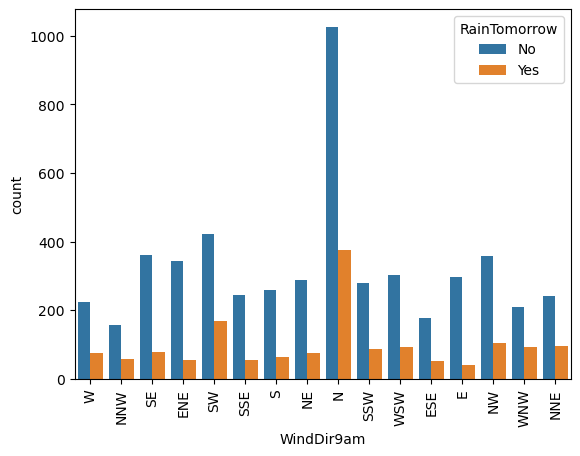

In [82]:
sns.countplot(x='WindDir9am',hue='RainTomorrow',data=df)
plt.xticks(rotation=90)
plt.show()

It seems that regardless of the direction of the wind at 9 am, the chances of rain tomorrow are generally lower.

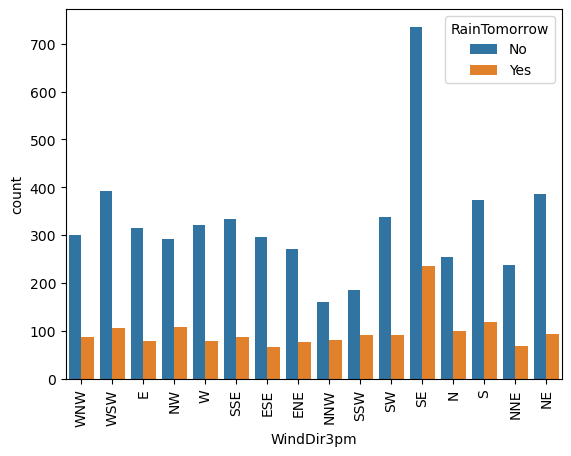

In [83]:
sns.countplot(x='WindDir3pm',hue='RainTomorrow',data=df)
plt.xticks(rotation=90)
plt.show()

It appears that for all directions of the wind at 3 pm, the chances of rain tomorrow are generally lower.

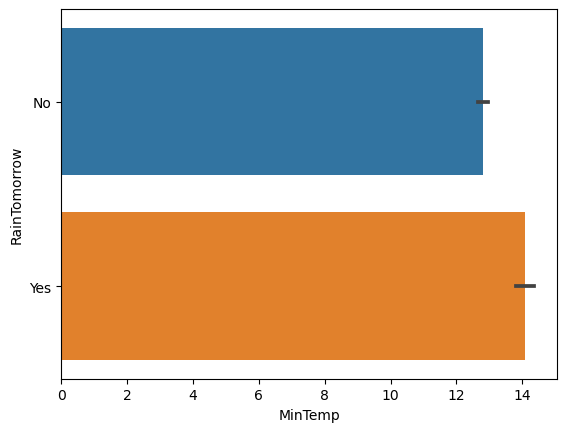

In [85]:
sns.barplot(x='MinTemp',y='RainTomorrow',data=df)
plt.show()

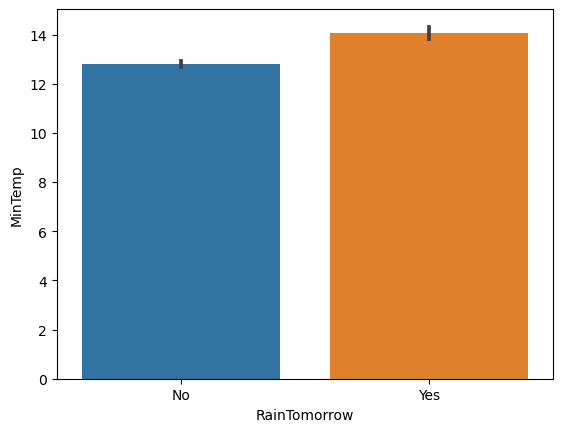

In [87]:
sns.barplot(x='RainTomorrow',y='MinTemp',data=df)
plt.show()

When the minimum temperature is higher, there are increased chances of rain tomorrow.

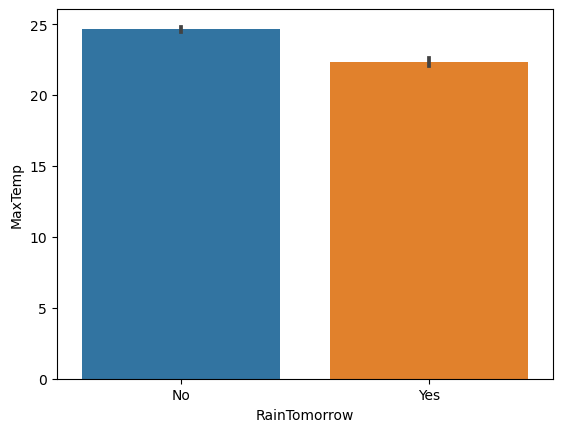

In [88]:
sns.barplot(x='RainTomorrow',y='MaxTemp',data=df)
plt.show()

When the maximum temperature is higher, there are fewer chances of rain tomorrow.

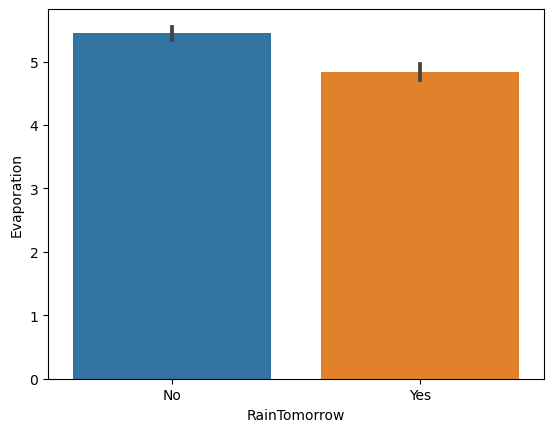

In [90]:
sns.barplot(x='RainTomorrow',y='Evaporation',data=df)
plt.show()

When evaporation is higher, there are fewer chances of rain tomorrow.

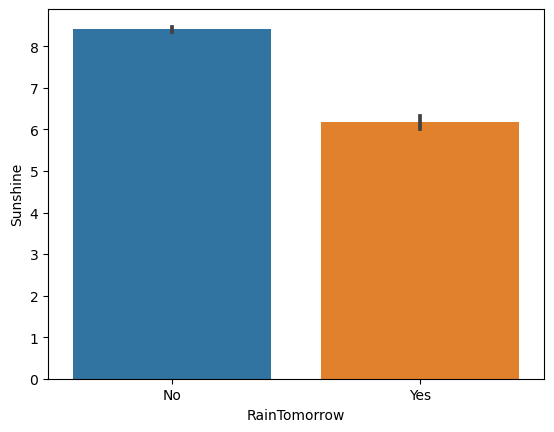

In [91]:
sns.barplot(x='RainTomorrow',y='Sunshine',data=df)
plt.show()

When sunshine is higher, there are fewer chances of rain tomorrow.

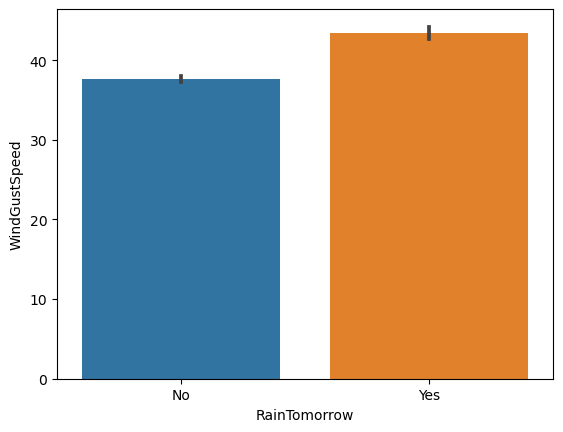

In [92]:
sns.barplot(x='RainTomorrow',y='WindGustSpeed',data=df)
plt.show()

When the speed of the strongest wind is higher, there are increased chances of rain tomorrow.

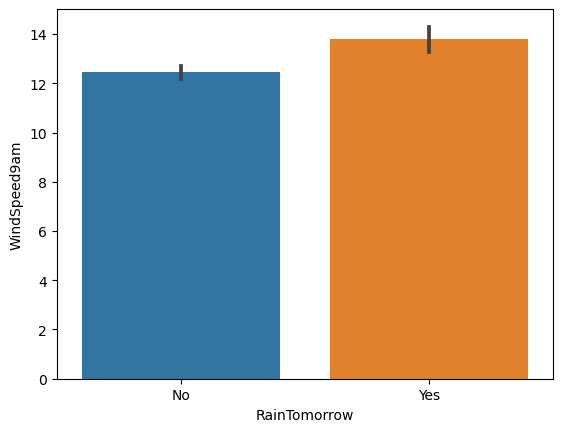

In [93]:
sns.barplot(x='RainTomorrow',y='WindSpeed9am',data=df)
plt.show()

When the wind speed at 9 am is higher, there are increased chances of rain tomorrow.

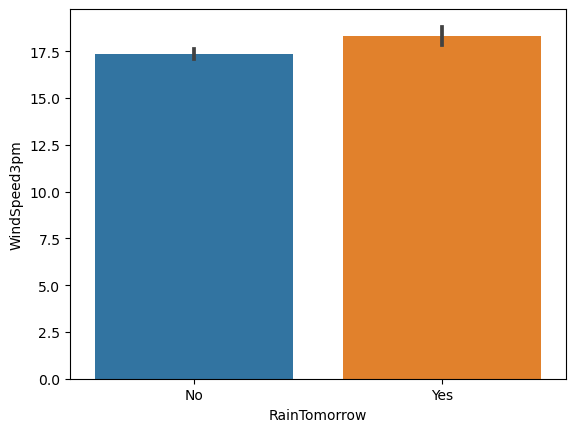

In [94]:
sns.barplot(x='RainTomorrow',y='WindSpeed3pm',data=df)
plt.show()

When the wind speed at 3 pm is higher, there are increased chances of rain tomorrow.

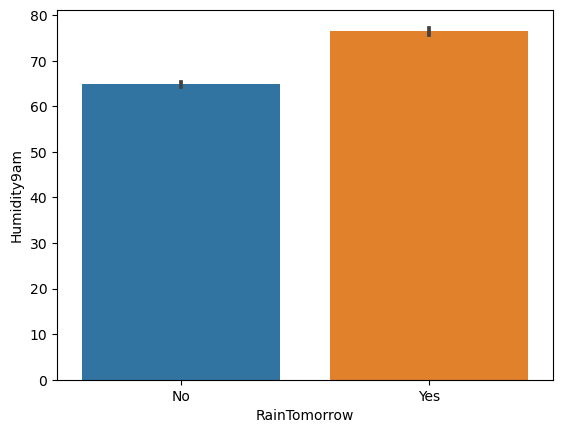

In [95]:
sns.barplot(x='RainTomorrow',y='Humidity9am',data=df)
plt.show()

When the humidity at 9 am is higher, there are increased chances of rain tomorrow.

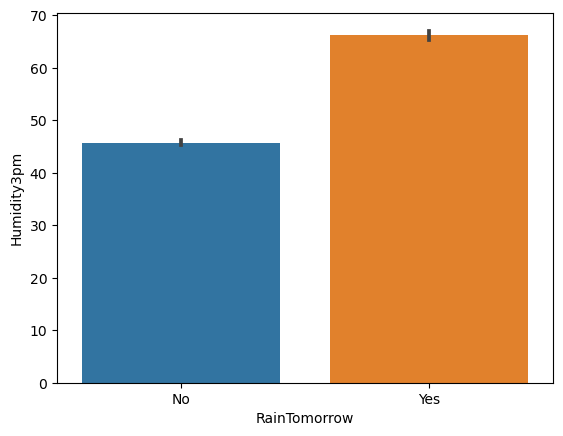

In [96]:
sns.barplot(x='RainTomorrow',y='Humidity3pm',data=df)
plt.show()

When the humidity at 3 pm is higher, there are increased chances of rain tomorrow.

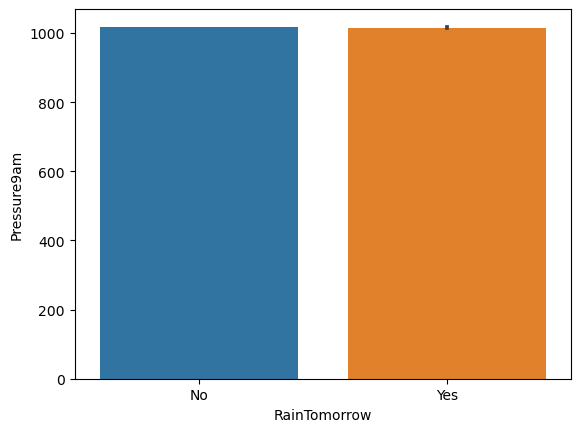

In [97]:
sns.barplot(x='RainTomorrow',y='Pressure9am',data=df)
plt.show()

There is no discernible pattern between the pressure at 9 am and the likelihood of rain tomorrow.

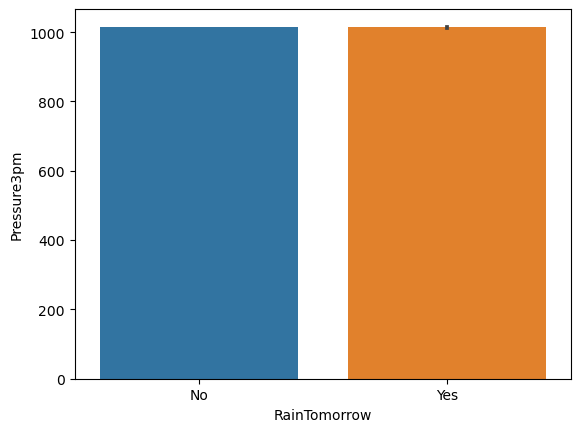

In [98]:
sns.barplot(x='RainTomorrow',y='Pressure3pm',data=df)
plt.show()

There is no discernible pattern between the pressure at 3 pm and the likelihood of rain tomorrow.

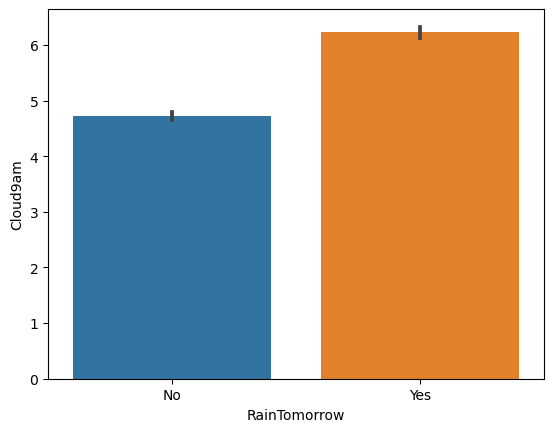

In [99]:
sns.barplot(x='RainTomorrow',y='Cloud9am',data=df)
plt.show()

When the fraction of sky obscured by clouds at 9 am is higher, there are increased chances of rain tomorrow.

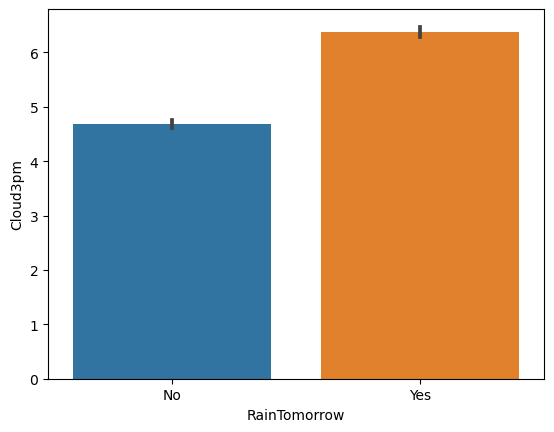

In [100]:
sns.barplot(x='RainTomorrow',y='Cloud3pm',data=df)
plt.show()

When the fraction of sky obscured by clouds at 3 pm is higher, there are increased chances of rain tomorrow.

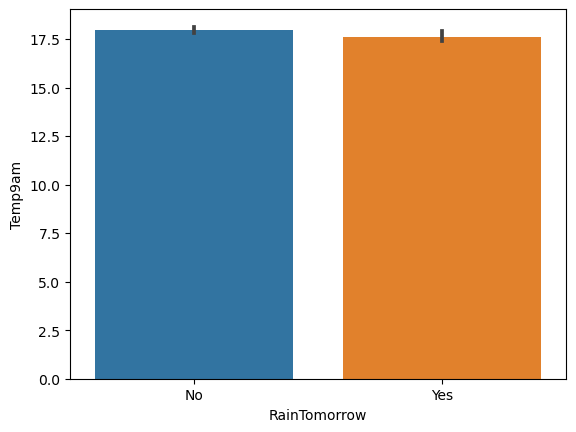

In [102]:
sns.barplot(x='RainTomorrow',y='Temp9am',data=df)
plt.show()

When the temperature is lower at 9 am, there are increased chances of rain tomorrow.

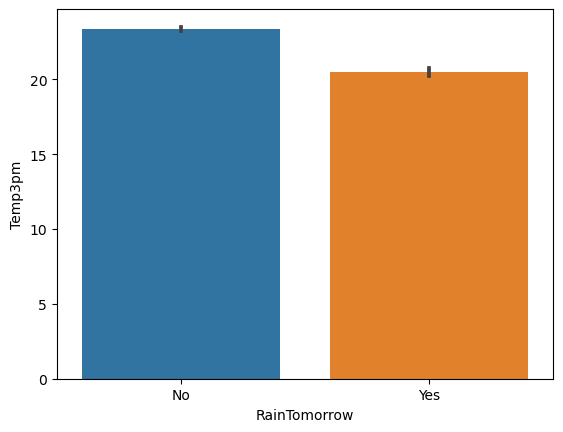

In [104]:
sns.barplot(x='RainTomorrow',y='Temp3pm',data=df)
plt.show()

When the temperature is lower at 3 pm, there are increased chances of rain tomorrow.

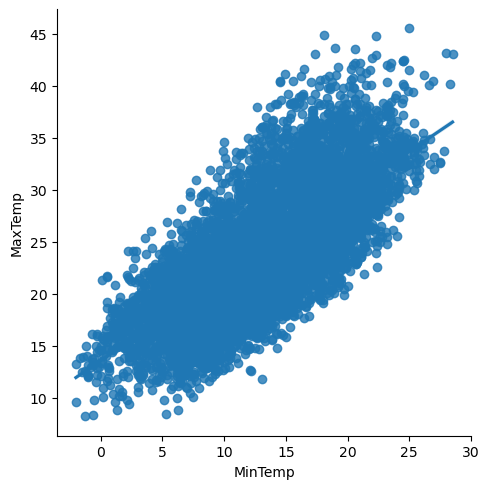

In [105]:
sns.lmplot(x='MinTemp',y='MaxTemp',data=df)
plt.show()

Here, we can observe a strong positive correlation between the minimum temperature and maximum temperature.

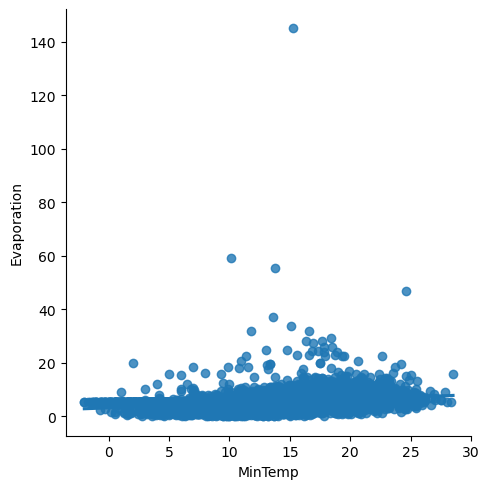

In [106]:
sns.lmplot(x='MinTemp',y='Evaporation',data=df)
plt.show()

The relationship between minimum temperature and evaporation is not as strong.

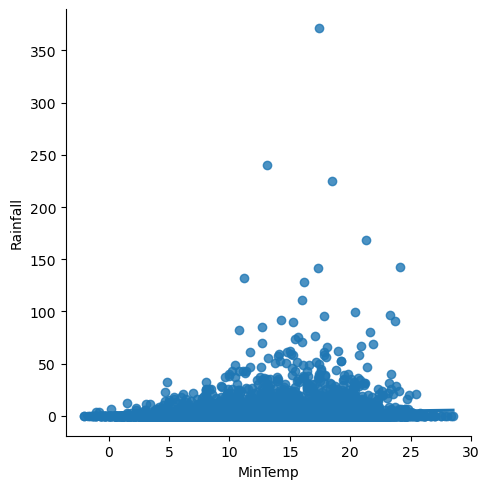

In [108]:
sns.lmplot(x='MinTemp',y='Rainfall',data=df)
plt.show()

The relationship between minimum temperature and rainfall is not very strong.

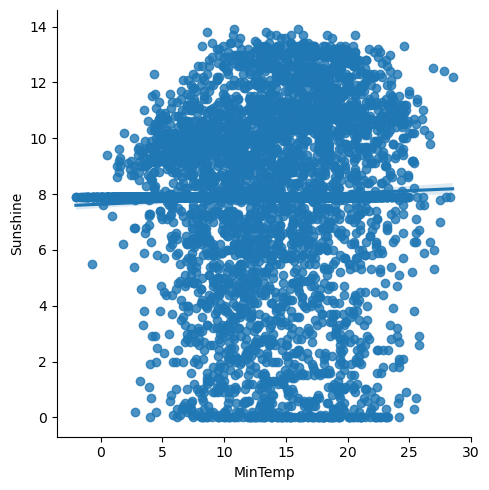

In [109]:
sns.lmplot(x='MinTemp',y='Sunshine',data=df)
plt.show()

There is a slight positive correlation between sunshine and minimum temperature.

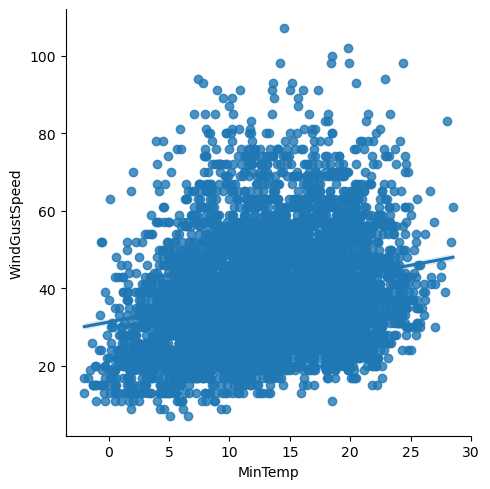

In [110]:
sns.lmplot(x='MinTemp',y='WindGustSpeed',data=df)
plt.show()

We can observe a positive correlation between minimum temperature and wind gust speed.

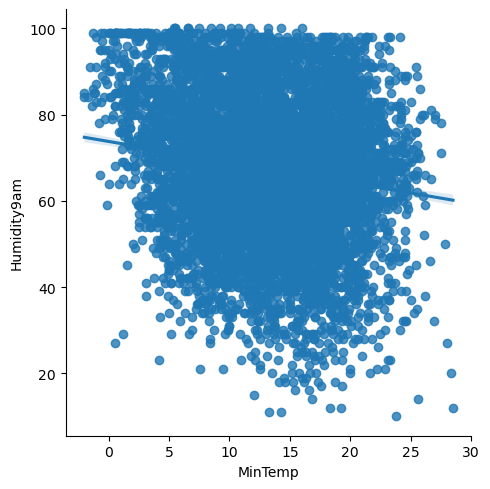

In [111]:
sns.lmplot(x='MinTemp',y='Humidity9am',data=df)
plt.show()

A negative correlation can be observed between minimum temperature and humidity at 9 am.

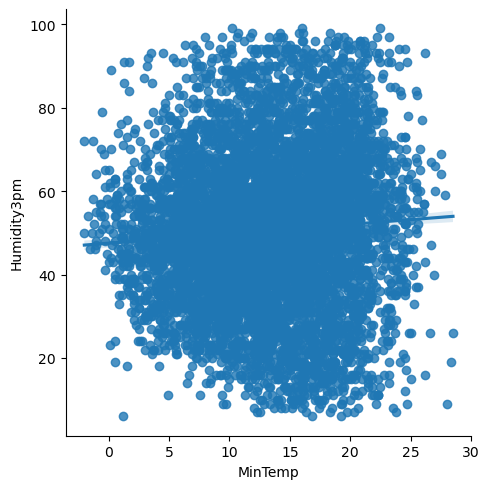

In [112]:
sns.lmplot(x='MinTemp',y='Humidity3pm',data=df)
plt.show()

A positive correlation can be observed between minimum temperature and humidity at 3 pm.

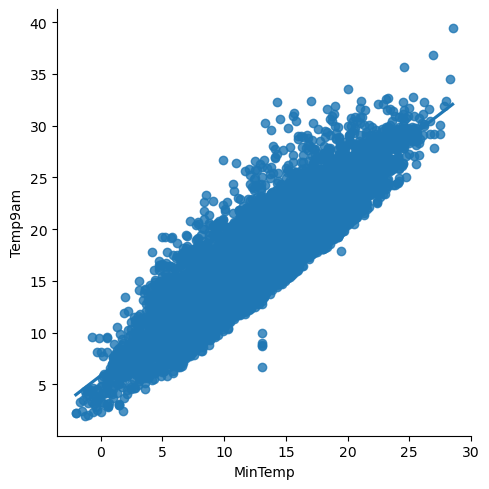

In [113]:
sns.lmplot(x='MinTemp',y='Temp9am',data=df)
plt.show()

A strong positive relationship is evident between the temperature at 9 am and the minimum temperature.

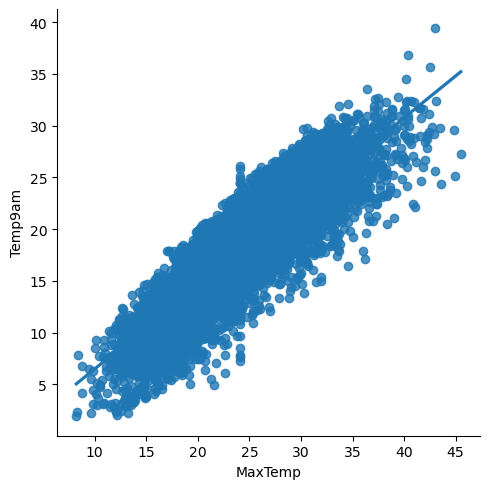

In [114]:
sns.lmplot(x='MaxTemp',y='Temp9am',data=df)
plt.show()

A strong positive relationship is evident between the temperature at 9 am and the maximum temperature.

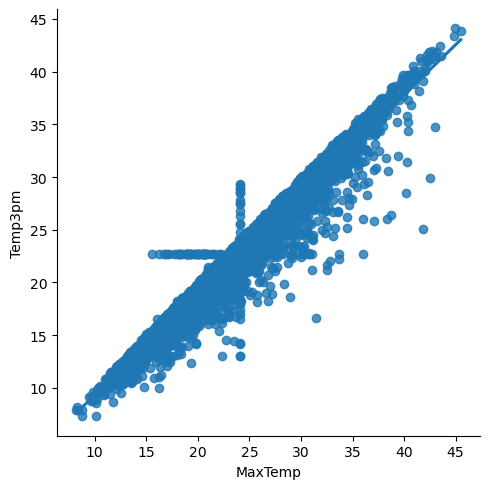

In [115]:
sns.lmplot(x='MaxTemp',y='Temp3pm',data=df)
plt.show()

A strong positive relationship is apparent between the temperature at 3 pm and the maximum temperature.

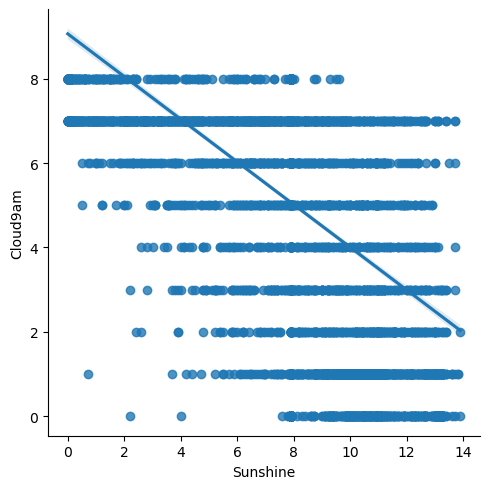

In [116]:
sns.lmplot(x='Sunshine',y='Cloud9am',data=df)
plt.show()

There's a strong negative correlation between Cloud9am and Sunshine.

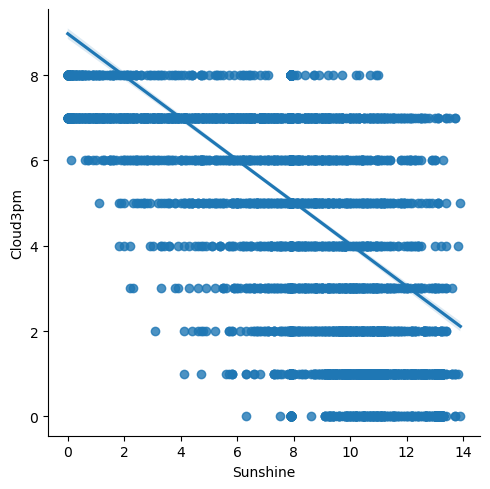

In [117]:
sns.lmplot(x='Sunshine',y='Cloud3pm',data=df)
plt.show()

There's a strong negative correlation between Cloud3pm and Sunshine.

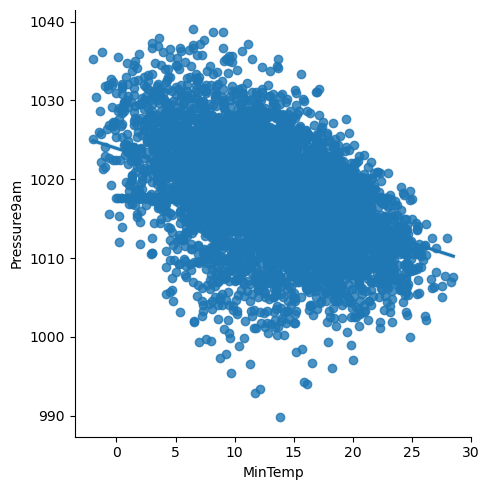

In [118]:
sns.lmplot(x='MinTemp',y='Pressure9am',data=df)
plt.show()

There's a negative correlation between MinTemp and Pressure9am.

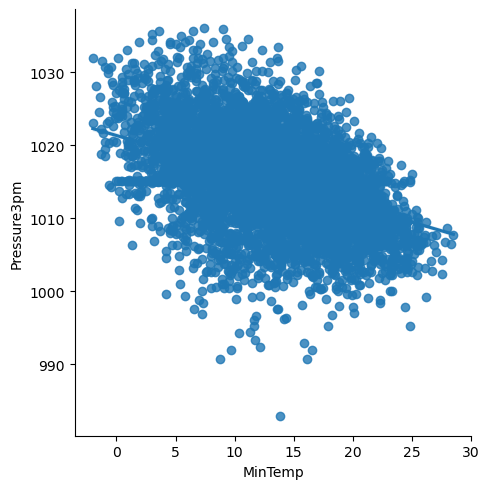

In [119]:
sns.lmplot(x='MinTemp',y='Pressure3pm',data=df)
plt.show()

There's a negative correlation between MinTemp and Pressure3pm.

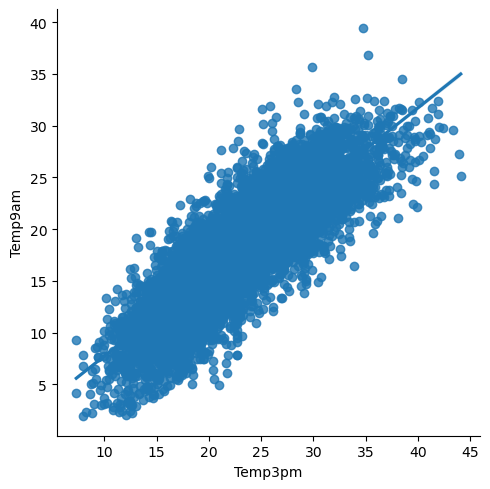

In [122]:
sns.lmplot(x='Temp3pm',y='Temp9am',data=df)
plt.show()

There's a positive correlation between Temp3pm and Temp9am.

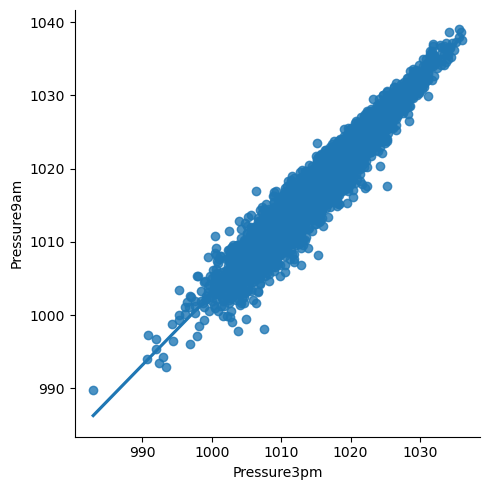

In [123]:
sns.lmplot(x='Pressure3pm',y='Pressure9am',data=df)
plt.show()

A very strong positive correlation is evident between pressure at 3 pm and pressure at 9 am.

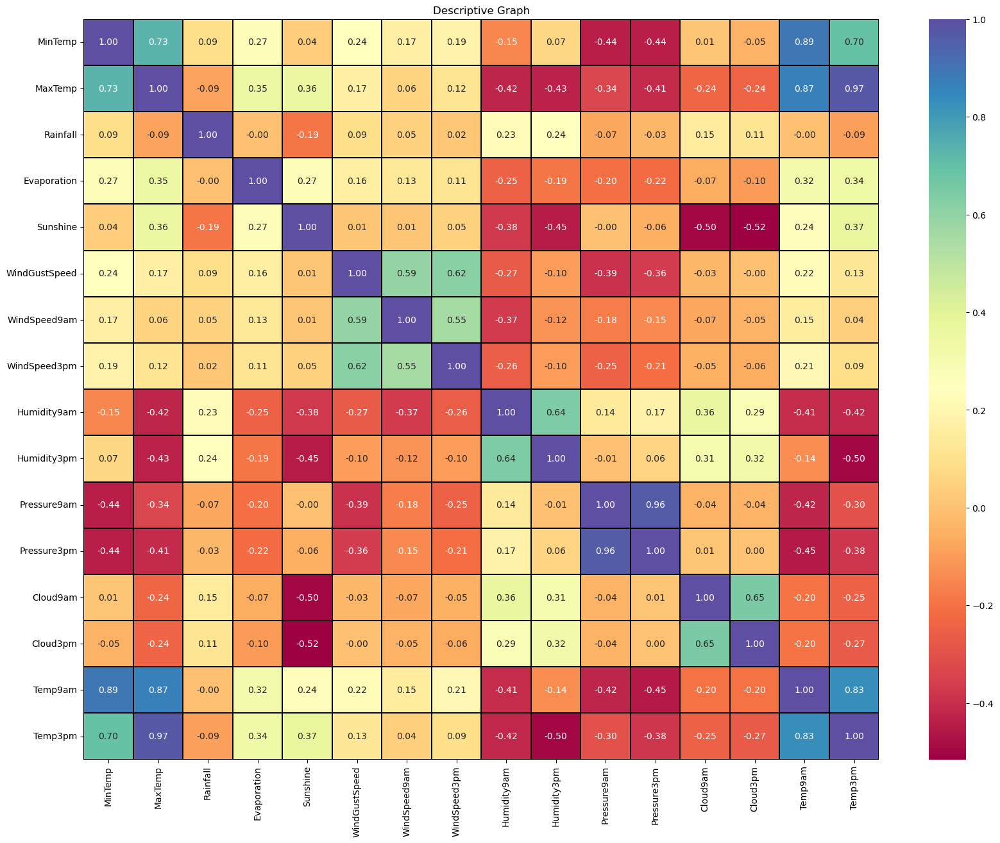

In [32]:
# Exclude non-numeric columns from the DataFrame
numeric_df = df.select_dtypes(include=['float64', 'int64'])

# Plot the heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(numeric_df.corr(), annot=True, fmt='0.2f', linewidth=0.2, linecolor='Black', cmap='Spectral')
plt.title('Descriptive Graph')
plt.show()

# Observations:
- There is a 73% positive correlation between minimum temperature and maximum temperature.
- There is an 89% positive correlation between minimum temperature and temperature at 9 am.
- There is an 87% positive correlation between maximum temperature and temperature at 9 am.
- There is a 97% positive correlation between maximum temperature and temperature at 3 pm.
- There is a negative correlation between sunshine and cloud cover at 9 am and 3 pm.
- There is a negative correlation between minimum temperature and atmospheric pressure at 9 am and 3 pm.
- There is an 83% positive correlation between temperature at 3 pm and temperature at 9 am.
- There is a 96% positive correlation between atmospheric pressure at 3 pm and atmospheric pressure at 9 am.

# 3.Multivariate analysis-

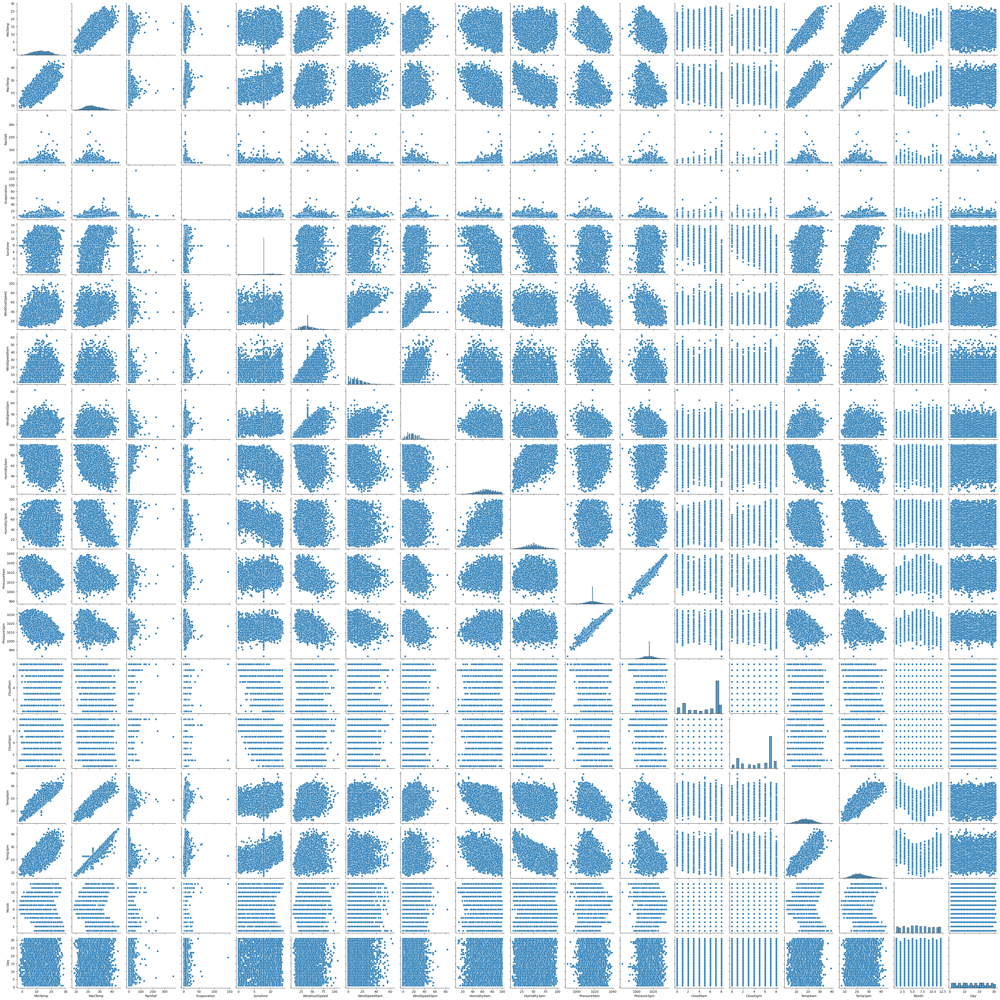

In [126]:
sns.pairplot(df)

In [221]:
num_col= df.select_dtypes(include=['float64'])
num_col.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

In [222]:
cat_col= df.select_dtypes(include=['object'])
cat_col.columns

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')

In [223]:
num_col.shape

(6762, 16)

In [226]:
df2=df

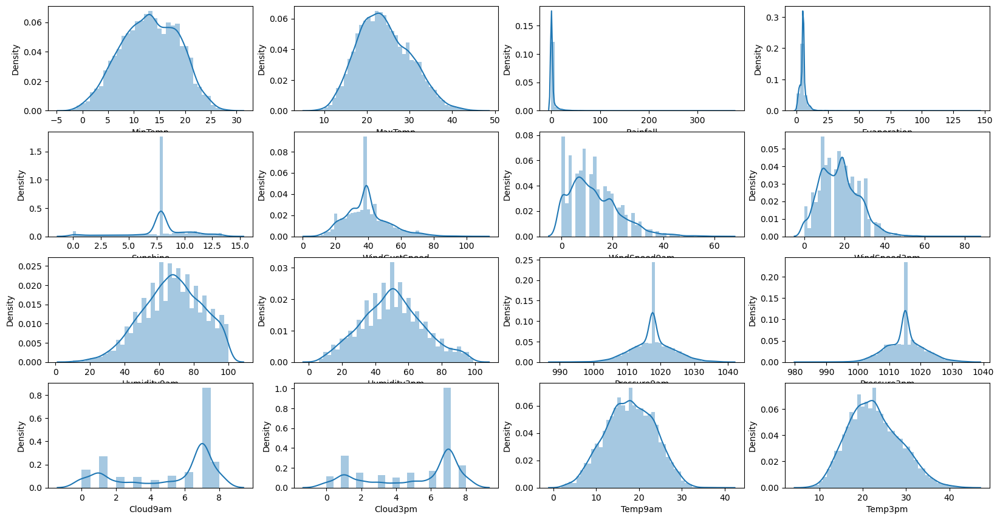

In [224]:
plt.figure(figsize=(20,13))
plotnumber=1

for col in num_col:
    if plotnumber<=20:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col)
        plt.yticks(rotation=0)
    plotnumber+=1
plt.show() 

In [225]:
num_col.skew()

MinTemp          -0.083706
MaxTemp           0.327598
Rainfall         13.650294
Evaporation      13.553368
Sunshine         -0.882147
WindGustSpeed     0.780437
WindSpeed9am      0.957036
WindSpeed3pm      0.549797
Humidity9am      -0.256177
Humidity3pm       0.150860
Pressure9am       0.022085
Pressure3pm       0.042990
Cloud9am         -0.727856
Cloud3pm         -0.699539
Temp9am          -0.047213
Temp3pm           0.348100
dtype: float64

Here, we observe that the skewness in columns like Rainfall, Evaporation, Sunshine, WindGustSpeed, and WindSpeed9am exceeds the acceptable range, which is between -0.5 to 0.5. As Cloud9am and Cloud3pm are categorical columns, skewness in these columns is not a concern.

# Using the Power Transformer method, we aim to eliminate skewness from the dataset.

In [36]:
from sklearn.preprocessing import PowerTransformer

In [37]:
features=['Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am']

In [38]:
x=PowerTransformer(method='yeo-johnson') 
df[features]=x.fit_transform(df[features].values)

In [39]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.592756,0.17104,-0.099351,W,0.470420,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,-0.681888,0.17104,-0.099351,WNW,0.470420,NNW,WSW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,-0.681888,0.17104,-0.099351,WSW,0.607493,W,WSW,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,-0.681888,0.17104,-0.099351,NE,-1.189815,SE,E,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,0.950465,0.17104,-0.099351,W,0.257219,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,-0.681888,0.17104,-0.099351,E,-0.534275,SE,ENE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,-0.681888,0.17104,-0.099351,NNW,-1.398629,SE,N,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,-0.681888,0.17104,-0.099351,N,-0.042965,SE,WNW,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No


In [40]:
num_col.skew()

MinTemp          -0.083706
MaxTemp           0.327598
Rainfall         13.650294
Evaporation      13.553368
Sunshine         -0.882147
WindGustSpeed     0.780437
WindSpeed9am      0.957036
WindSpeed3pm      0.549797
Humidity9am      -0.256177
Humidity3pm       0.150860
Pressure9am       0.022085
Pressure3pm       0.042990
Cloud9am         -0.727856
Cloud3pm         -0.699539
Temp9am          -0.047213
Temp3pm           0.348100
dtype: float64

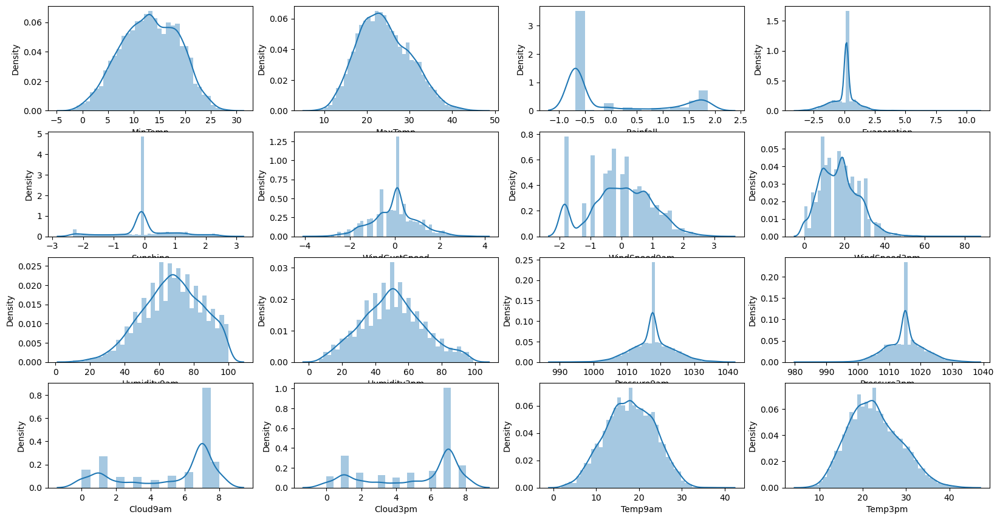

In [41]:
plt.figure(figsize=(20,13))
plotnumber=1

for col in num_col:
    if plotnumber<=20:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col)
        plt.yticks(rotation=0)
    plotnumber+=1
plt.show() 

We can conclude that the skewness is now within the acceptable range.

# Outliers 

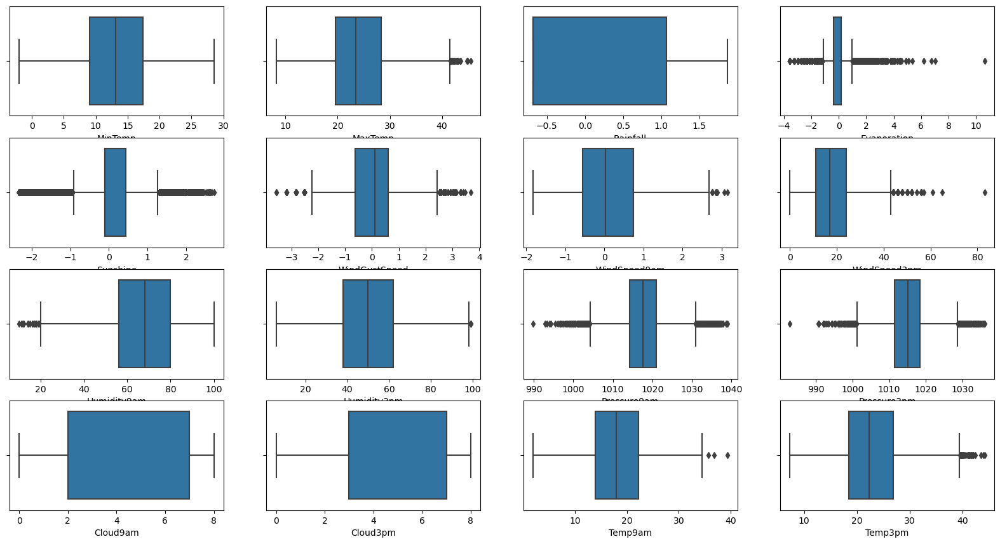

In [42]:
plt.figure(figsize=(20,13))
plotnumber=1

for col in num_col:
    if plotnumber<=20:
        ax=plt.subplot(5,4,plotnumber)
        sns.boxplot(x=df[col])
        plt.xlabel(col)
        plt.yticks(rotation=0)
    plotnumber+=1
plt.show() 

We can observe the presence of outliers in columns such as MaxTemp, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Temp9am, and Temp3pm.

# Removing outliers using the Zscore method:

In [54]:
from scipy.stats import zscore
import numpy as np

In [55]:
x=num_col

In [56]:
z=np.abs(zscore(x))
z.shape

(6762, 16)

In [57]:
threshold=3
print(np.where(z>3))

(array([  12,   12,   44,   44,   52,   52,   60,   60,   61,   61,   62,
         62,   67,   68,   68,  123,  271,  296,  381,  381,  405,  406,
        407,  466,  466,  563,  567,  568,  568,  569,  602,  602,  603,
        683,  683,  748,  748, 1008, 1189, 1387, 1413, 1467, 1480, 1587,
       1644, 1665, 1898, 2028, 2043, 2219, 2230, 2346, 2373, 2389, 2505,
       2527, 2527, 2710, 2738, 2743, 2744, 2768, 2827, 2835, 2849, 2855,
       2859, 2863, 2869, 2877, 2883, 2891, 2897, 2905, 2911, 2919, 2925,
       2933, 2939, 2947, 2953, 2961, 2967, 2975, 2989, 3051, 3058, 3059,
       3059, 3060, 3066, 3067, 3067, 3082, 3082, 3098, 3099, 3099, 3101,
       3139, 3141, 3150, 3153, 3157, 3164, 3167, 3172, 3172, 3178, 3185,
       3206, 3212, 3212, 3212, 3213, 3221, 3227, 3248, 3260, 3278, 3278,
       3280, 3291, 3302, 3302, 3303, 3449, 3449, 3449, 3450, 3450, 3458,
       3471, 3603, 3617, 3675, 3676, 3676, 3714, 3716, 3766, 3766, 3767,
       3786, 3820, 3825, 3826, 3826, 3911, 3919, 3

In [58]:
df1=df[(z<3).all(axis=1)]
df1

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.592756,0.17104,-0.099351,W,0.470420,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,-0.681888,0.17104,-0.099351,WNW,0.470420,NNW,WSW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,-0.681888,0.17104,-0.099351,WSW,0.607493,W,WSW,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,-0.681888,0.17104,-0.099351,NE,-1.189815,SE,E,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,0.950465,0.17104,-0.099351,W,0.257219,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,-0.681888,0.17104,-0.099351,E,-0.534275,SE,ENE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,-0.681888,0.17104,-0.099351,NNW,-1.398629,SE,N,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,-0.681888,0.17104,-0.099351,N,-0.042965,SE,WNW,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No


# Data Loss

In [60]:
(6762-6556)/6762*100

3.046435965690624

Thus, we can see that the data loss is only 3%, which is within the acceptable range.

In [61]:
df=df1
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.592756,0.17104,-0.099351,W,0.470420,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,-0.681888,0.17104,-0.099351,WNW,0.470420,NNW,WSW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,-0.681888,0.17104,-0.099351,WSW,0.607493,W,WSW,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,-0.681888,0.17104,-0.099351,NE,-1.189815,SE,E,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,0.950465,0.17104,-0.099351,W,0.257219,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,-0.681888,0.17104,-0.099351,E,-0.534275,SE,ENE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,-0.681888,0.17104,-0.099351,NNW,-1.398629,SE,N,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,-0.681888,0.17104,-0.099351,N,-0.042965,SE,WNW,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No


In [64]:
cat_col

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
Date,,,,,,
2008-12-01,Albury,W,W,WNW,No,No
2008-12-02,Albury,WNW,NNW,WSW,No,No
2008-12-03,Albury,WSW,W,WSW,No,No
2008-12-04,Albury,NE,SE,E,No,No
2008-12-05,Albury,W,ENE,NW,No,No
...,...,...,...,...,...,...
2017-06-21,Uluru,E,SE,ENE,No,No
2017-06-22,Uluru,NNW,SE,N,No,No
2017-06-23,Uluru,N,SE,WNW,No,No


# Encoding of the object data-

In [68]:
cat_col.columns

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')

In [67]:
cat_col.nunique()

Location        12
WindGustDir     16
WindDir9am      16
WindDir3pm      16
RainToday        2
RainTomorrow     2
dtype: int64

# Applying binary encoding to columns with more than 8 categories.

In [70]:
from category_encoders import BinaryEncoder
be=BinaryEncoder()

In [71]:
df[['Location_0','Location_1','Location_2','Location_3','WindGustDir_0','WindGustDir_1','WindGustDir_2','WindGustDir_3','WindGustDir_4','WindDir9am_0','WindDir9am_1','WindDir9am_2','WindDir9am_3','WindDir9am_4','WindDir3pm_0','WindDir3pm_1','WindDir3pm_2','WindDir3pm_3','WindDir3pm_4']]=be.fit_transform(df[['Location','WindGustDir','WindDir9am','WindDir3pm']],inplace=True)


In [72]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.592756,0.17104,-0.099351,W,0.470420,W,WNW,...,0,0,0,0,1,0,0,0,0,1
2008-12-02,Albury,7.4,25.100000,-0.681888,0.17104,-0.099351,WNW,0.470420,NNW,WSW,...,0,0,0,1,0,0,0,0,1,0
2008-12-03,Albury,12.9,25.700000,-0.681888,0.17104,-0.099351,WSW,0.607493,W,WSW,...,0,0,0,0,1,0,0,0,1,0
2008-12-04,Albury,9.2,28.000000,-0.681888,0.17104,-0.099351,NE,-1.189815,SE,E,...,0,0,0,1,1,0,0,0,1,1
2008-12-05,Albury,17.5,32.300000,0.950465,0.17104,-0.099351,W,0.257219,ENE,NW,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,-0.681888,0.17104,-0.099351,E,-0.534275,SE,ENE,...,0,0,0,1,1,0,1,0,0,0
2017-06-22,Uluru,3.6,25.300000,-0.681888,0.17104,-0.099351,NNW,-1.398629,SE,N,...,0,0,0,1,1,0,1,1,0,1
2017-06-23,Uluru,5.4,26.900000,-0.681888,0.17104,-0.099351,N,-0.042965,SE,WNW,...,0,0,0,1,1,0,0,0,0,1


In [73]:
df=df.drop(columns=['Location','WindGustDir','WindDir9am','WindDir3pm'],axis=1)
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,13.4,22.900000,0.592756,0.17104,-0.099351,0.470420,0.826343,24.0,71.0,22.0,...,0,0,0,0,1,0,0,0,0,1
2008-12-02,7.4,25.100000,-0.681888,0.17104,-0.099351,0.470420,-0.868318,22.0,44.0,25.0,...,0,0,0,1,0,0,0,0,1,0
2008-12-03,12.9,25.700000,-0.681888,0.17104,-0.099351,0.607493,0.748912,26.0,38.0,30.0,...,0,0,0,0,1,0,0,0,1,0
2008-12-04,9.2,28.000000,-0.681888,0.17104,-0.099351,-1.189815,0.032879,9.0,45.0,16.0,...,0,0,0,1,1,0,0,0,1,1
2008-12-05,17.5,32.300000,0.950465,0.17104,-0.099351,0.257219,-0.428868,20.0,82.0,33.0,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,2.8,23.400000,-0.681888,0.17104,-0.099351,-0.534275,0.231834,11.0,51.0,24.0,...,0,0,0,1,1,0,1,0,0,0
2017-06-22,3.6,25.300000,-0.681888,0.17104,-0.099351,-1.398629,0.231834,9.0,56.0,21.0,...,0,0,0,1,1,0,1,1,0,1
2017-06-23,5.4,26.900000,-0.681888,0.17104,-0.099351,-0.042965,-0.185237,9.0,53.0,24.0,...,0,0,0,1,1,0,0,0,0,1


In [75]:
df.dtypes

MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
Location_0         int64
Location_1         int64
Location_2         int64
Location_3         int64
WindGustDir_0      int64
WindGustDir_1      int64
WindGustDir_2      int64
WindGustDir_3      int64
WindGustDir_4      int64
WindDir9am_0       int64
WindDir9am_1       int64
WindDir9am_2       int64
WindDir9am_3       int64
WindDir9am_4       int64
WindDir3pm_0       int64
WindDir3pm_1       int64
WindDir3pm_2       int64
WindDir3pm_3       int64
WindDir3pm_4       int64
dtype: object

# Applying label encoding to columns with only 2 categories.

In [77]:
from sklearn.preprocessing import LabelEncoder
x= LabelEncoder()

In [78]:
df1=x.fit_transform(df['RainToday'])
pd.Series(df1)

0       0
1       0
2       0
3       0
4       0
       ..
6551    0
6552    0
6553    0
6554    0
6555    0
Length: 6556, dtype: int32

In [79]:
df2=x.fit_transform(df['RainTomorrow'])
pd.Series(df2)

0       0
1       0
2       0
3       0
4       0
       ..
6551    0
6552    0
6553    0
6554    0
6555    0
Length: 6556, dtype: int32

In [80]:
df['RainToday']=df1

In [81]:
df['RainTomorrow']=df2

In [82]:
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,13.4,22.900000,0.592756,0.17104,-0.099351,0.470420,0.826343,24.0,71.0,22.0,...,0,0,0,0,1,0,0,0,0,1
2008-12-02,7.4,25.100000,-0.681888,0.17104,-0.099351,0.470420,-0.868318,22.0,44.0,25.0,...,0,0,0,1,0,0,0,0,1,0
2008-12-03,12.9,25.700000,-0.681888,0.17104,-0.099351,0.607493,0.748912,26.0,38.0,30.0,...,0,0,0,0,1,0,0,0,1,0
2008-12-04,9.2,28.000000,-0.681888,0.17104,-0.099351,-1.189815,0.032879,9.0,45.0,16.0,...,0,0,0,1,1,0,0,0,1,1
2008-12-05,17.5,32.300000,0.950465,0.17104,-0.099351,0.257219,-0.428868,20.0,82.0,33.0,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,2.8,23.400000,-0.681888,0.17104,-0.099351,-0.534275,0.231834,11.0,51.0,24.0,...,0,0,0,1,1,0,1,0,0,0
2017-06-22,3.6,25.300000,-0.681888,0.17104,-0.099351,-1.398629,0.231834,9.0,56.0,21.0,...,0,0,0,1,1,0,1,1,0,1
2017-06-23,5.4,26.900000,-0.681888,0.17104,-0.099351,-0.042965,-0.185237,9.0,53.0,24.0,...,0,0,0,1,1,0,0,0,0,1


In [83]:
df.dtypes

MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday          int32
RainTomorrow       int32
Location_0         int64
Location_1         int64
Location_2         int64
Location_3         int64
WindGustDir_0      int64
WindGustDir_1      int64
WindGustDir_2      int64
WindGustDir_3      int64
WindGustDir_4      int64
WindDir9am_0       int64
WindDir9am_1       int64
WindDir9am_2       int64
WindDir9am_3       int64
WindDir9am_4       int64
WindDir3pm_0       int64
WindDir3pm_1       int64
WindDir3pm_2       int64
WindDir3pm_3       int64
WindDir3pm_4       int64
dtype: object

Now we can see that all our categorical data is encoded.

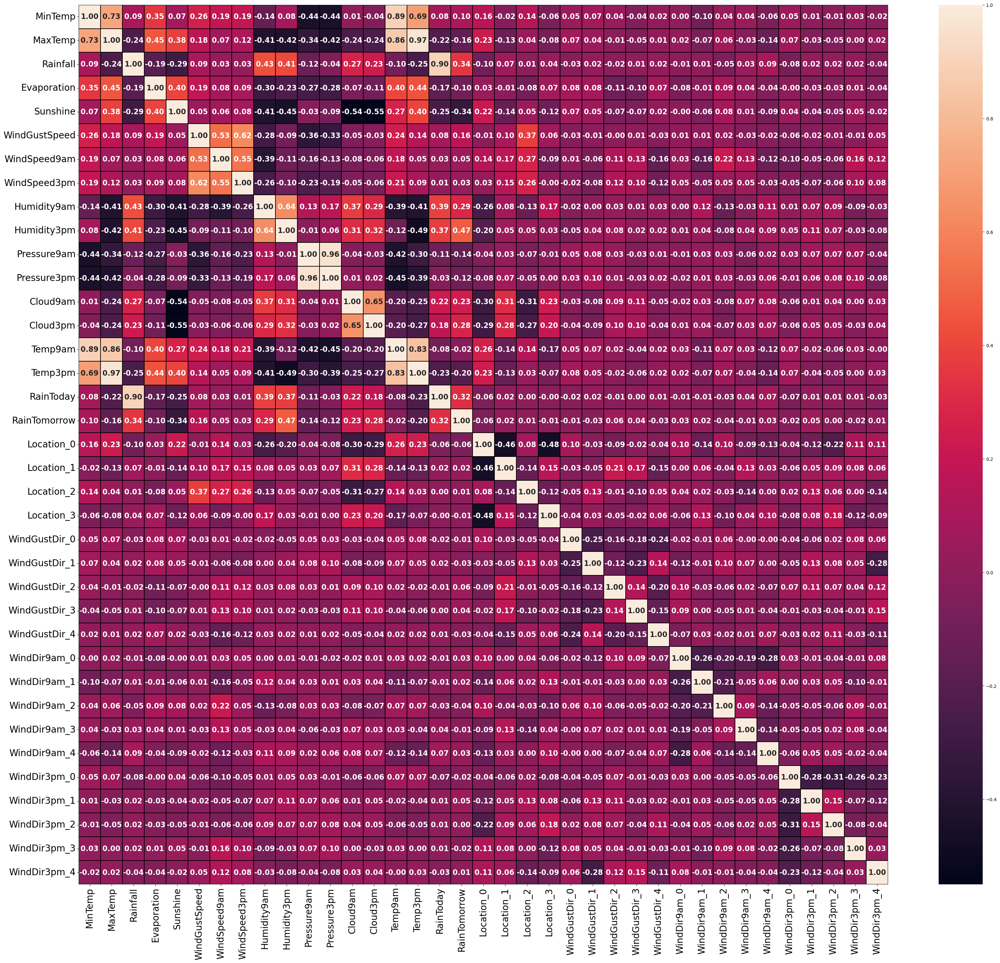

In [85]:
plt.figure(figsize=(40,35))
sns.heatmap(df.corr(),annot=True,fmt='.2f',linecolor='black',linewidth=0.2,annot_kws={'fontsize': 16,'fontweight': 'bold'})
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show() 

# Observations:

- Minimum temperature (Mintemp) and temperature at 9 am (Temp9am) have an 89% positive correlation.
- Maximum temperature (Maxtemp) and temperature at 3 pm (Temp3pm) have a 97% positive correlation.
- Rainfall and rain today (Raintoday) have a 90% positive correlation.
- Temperature at 9 am (Temp9am) and temperature at 3 pm (Temp3pm) have an 83% positive correlation.
- Sunshine, Temp3pm, Maxtemp, Pressure9am, Pressure3pm, Evaporation, Location_0, Winddir9am_2, WindGustdir_4, WindGustdir_1, Temp9am, WindDir3pm_0, WindDir3pm_3, WindGustdir_0, WindDir9am_3, and Location_3 have a negative correlation with the target variable.

# Correlation between features and the target variable:

In [88]:
df.corr()['RainTomorrow'].sort_values(ascending=False).to_frame()

,RainTomorrow
RainTomorrow,1.000000
Humidity3pm,0.470046
Rainfall,0.344339
RainToday,0.319531
Humidity9am,0.290687
Cloud3pm,0.275602
Cloud9am,0.232821
WindGustSpeed,0.164540
MinTemp,0.099428
WindGustDir_2,0.063536


# Graphical depiction of the relationship between features and the target variable:

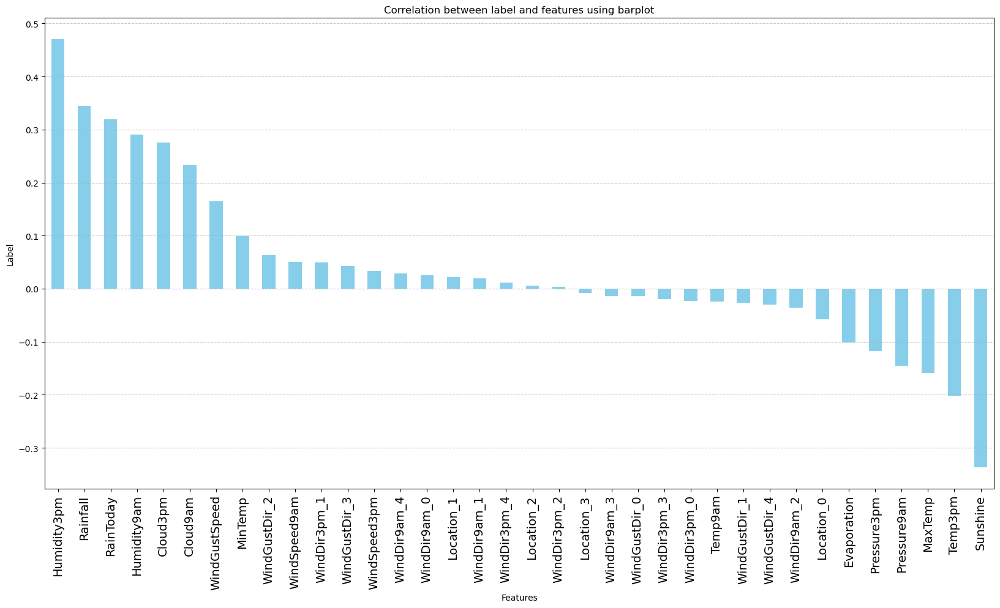

In [89]:
plt.figure(figsize=(20,10))
df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar', color='skyblue')
plt.xlabel('Features')
plt.ylabel('Label')
plt.xticks(fontsize=14)
plt.title('Correlation between label and features using barplot')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Observations:

- Humidity at 3 pm (Humidity3pm), Sunshine, and Rainfall have the strongest relationship with the target variable.
- Sunshine has a negative correlation with the target variable.
- Columns such as Location_1, WindDir9am_1, WindDir3pm_4, Location_2, WindDir3pm_2, Location_3, WindDir9am_3, WindGustDir_0, and WindDir3pm_3 have the least correlation with the target variable.

In [90]:
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,13.4,22.900000,0.592756,0.17104,-0.099351,0.470420,0.826343,24.0,71.0,22.0,...,0,0,0,0,1,0,0,0,0,1
2008-12-02,7.4,25.100000,-0.681888,0.17104,-0.099351,0.470420,-0.868318,22.0,44.0,25.0,...,0,0,0,1,0,0,0,0,1,0
2008-12-03,12.9,25.700000,-0.681888,0.17104,-0.099351,0.607493,0.748912,26.0,38.0,30.0,...,0,0,0,0,1,0,0,0,1,0
2008-12-04,9.2,28.000000,-0.681888,0.17104,-0.099351,-1.189815,0.032879,9.0,45.0,16.0,...,0,0,0,1,1,0,0,0,1,1
2008-12-05,17.5,32.300000,0.950465,0.17104,-0.099351,0.257219,-0.428868,20.0,82.0,33.0,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,2.8,23.400000,-0.681888,0.17104,-0.099351,-0.534275,0.231834,11.0,51.0,24.0,...,0,0,0,1,1,0,1,0,0,0
2017-06-22,3.6,25.300000,-0.681888,0.17104,-0.099351,-1.398629,0.231834,9.0,56.0,21.0,...,0,0,0,1,1,0,1,1,0,1
2017-06-23,5.4,26.900000,-0.681888,0.17104,-0.099351,-0.042965,-0.185237,9.0,53.0,24.0,...,0,0,0,1,1,0,0,0,0,1


# Preparing Data for Machine Learning

# Splitting

Choose the dependent(label)and independent variables

In [91]:
X = df.drop('RainTomorrow', axis=1)
Y = df['RainTomorrow']

In [92]:
X

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,13.4,22.900000,0.592756,0.17104,-0.099351,0.470420,0.826343,24.0,71.0,22.0,...,0,0,0,0,1,0,0,0,0,1
2008-12-02,7.4,25.100000,-0.681888,0.17104,-0.099351,0.470420,-0.868318,22.0,44.0,25.0,...,0,0,0,1,0,0,0,0,1,0
2008-12-03,12.9,25.700000,-0.681888,0.17104,-0.099351,0.607493,0.748912,26.0,38.0,30.0,...,0,0,0,0,1,0,0,0,1,0
2008-12-04,9.2,28.000000,-0.681888,0.17104,-0.099351,-1.189815,0.032879,9.0,45.0,16.0,...,0,0,0,1,1,0,0,0,1,1
2008-12-05,17.5,32.300000,0.950465,0.17104,-0.099351,0.257219,-0.428868,20.0,82.0,33.0,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,2.8,23.400000,-0.681888,0.17104,-0.099351,-0.534275,0.231834,11.0,51.0,24.0,...,0,0,0,1,1,0,1,0,0,0
2017-06-22,3.6,25.300000,-0.681888,0.17104,-0.099351,-1.398629,0.231834,9.0,56.0,21.0,...,0,0,0,1,1,0,1,1,0,1
2017-06-23,5.4,26.900000,-0.681888,0.17104,-0.099351,-0.042965,-0.185237,9.0,53.0,24.0,...,0,0,0,1,1,0,0,0,0,1


In [93]:
X.shape

(6556, 36)

In [94]:
Y

Date
2008-12-01    0
2008-12-02    0
2008-12-03    0
2008-12-04    0
2008-12-05    0
             ..
2017-06-21    0
2017-06-22    0
2017-06-23    0
2017-06-24    0
2017-06-25    0
Name: RainTomorrow, Length: 6556, dtype: int32

In [95]:
Y.shape

(6556,)

# Feature Scaling

In [96]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X 

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
0,0.054934,-0.194662,0.596439,0.20409,-0.105671,0.503083,0.847046,0.722205,0.201187,-1.553135,...,-0.227642,-1.147792,-0.881849,-0.843388,0.811472,-0.279486,-1.017853,-1.101530,-0.932418,1.229976
1,-1.031220,0.171175,-0.679659,0.20409,-0.105671,0.503083,-0.859278,0.505111,-1.386412,-1.389957,...,-0.227642,-1.147792,-0.881849,1.185695,-1.232328,-0.279486,-1.017853,-1.101530,1.072480,-0.813024
2,-0.035579,0.270948,-0.679659,0.20409,-0.105671,0.644228,0.769082,0.939300,-1.739211,-1.117994,...,-0.227642,-1.147792,-0.881849,-0.843388,0.811472,-0.279486,-1.017853,-1.101530,1.072480,-0.813024
3,-0.705374,0.653415,-0.679659,0.20409,-0.105671,-1.206480,0.048121,-0.906006,-1.327612,-1.879492,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,-1.017853,-1.101530,1.072480,1.229976
4,0.797139,1.368460,0.954556,0.20409,-0.105671,0.283547,-0.416804,0.288016,0.847986,-0.954816,...,-0.227642,-1.147792,1.133981,-0.843388,-1.232328,-0.279486,-1.017853,0.907828,-0.932418,-0.813024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6551,-1.863939,-0.111518,-0.679659,0.20409,-0.105671,-0.531463,0.248445,-0.688911,-0.974812,-1.444350,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,0.982460,-1.101530,-0.932418,-0.813024
6552,-1.719118,0.204433,-0.679659,0.20409,-0.105671,-1.421498,0.248445,-0.906006,-0.680812,-1.607528,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,0.982460,0.907828,-0.932418,1.229976
6553,-1.393272,0.470496,-0.679659,0.20409,-0.105671,-0.025556,-0.171495,-0.906006,-0.857212,-1.444350,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,-1.017853,-1.101530,-0.932418,1.229976
6554,-0.958810,0.487125,-0.679659,0.20409,-0.105671,-0.807717,0.248445,-1.123100,-0.974812,-1.444350,...,-0.227642,-1.147792,1.133981,1.185695,-1.232328,-0.279486,0.982460,0.907828,-0.932418,1.229976


To address potential bias stemming from variations in decimal places across feature columns, I've opted to standardize all the features using the Standard Scaler method. This technique ensures that all feature columns have comparable scales, which can enhance the performance and stability of my model.

# Assessing multicollinearity among features.

In [101]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [103]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values,i) for i in range(len(X.columns))]
vif['Features']=X.columns
vif

,VIF Values,Features
0,9.361528,MinTemp
1,26.222677,MaxTemp
2,5.856429,Rainfall
3,1.670204,Evaporation
4,2.169713,Sunshine
5,2.365622,WindGustSpeed
6,2.303750,WindSpeed9am
7,2.023320,WindSpeed3pm
8,4.134357,Humidity9am
9,5.624295,Humidity3pm


Here, we can see that a few columns, such as MaxTemp, Pressure9am, Pressure3pm, Temp9am, and Temp3pm, exhibit multicollinearity issues.

# Dropping multicollinear columns-

In [104]:
X=X.drop(columns=['MaxTemp','Pressure9am','Temp3pm','Temp9am'])

In [111]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values,i) for i in range(len(X.columns))]
vif['Features']=X.columns
vif

,VIF Values,Features
0,1.616105,MinTemp
1,5.797509,Rainfall
2,1.648670,Evaporation
3,2.108131,Sunshine
4,2.331045,WindGustSpeed
5,2.208031,WindSpeed9am
6,1.937419,WindSpeed3pm
7,2.625374,Humidity9am
8,2.167321,Humidity3pm
9,1.482738,Pressure3pm


Now we observe that multicollinearity is within an acceptable range, indicating that the issue has been resolved.

In [112]:
Y.value_counts()

RainTomorrow
0    5044
1    1512
Name: count, dtype: int64

The data appears to be imbalanced. Since this is a classification problem, we'll address the imbalance by employing oversampling techniques.

In [113]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()
X,Y=sm.fit_resample(X,Y)

In [114]:
Y.value_counts()

RainTomorrow
0    5044
1    5044
Name: count, dtype: int64

Now that the data is balanced, we can proceed to build machine learning classification models.

# Model Building-1

In [115]:
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.30,random_state=i) 
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)   
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('Best accuracy is', maxacc,'at random state',maxrs) 

Best accuracy is 0.42754784824329195 at random state 103


In [117]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=maxrs)

20% of the dataset will be used for testing, and the remaining 80% for training our machine learning models.

In [124]:
# Classification Model Function
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,accuracy_score
def classify(model, X, Y):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=maxrs)
    
    # Training the model
    model.fit(X_train, Y_train)
    
    # Predicting Y_test
    pred = model.predict(X_test)
    
    # Accuracy Score
    acc_score = (accuracy_score(Y_test, pred))*100
    print("Accuracy Score:", acc_score)
    
    # Classification Report
    class_report = classification_report(Y_test, pred)
    print("\nClassification Report:\n", class_report)
    
    #Confusion Matrix
    confusion_matx=confusion_matrix(Y_test, pred)
    print("\nConfusion Matrix:\n",confusion_matx)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, X, Y, cv=5).mean())*100
    print("\nCross Validation Score:", cv_score)
    
    # Result of accuracy minus cv scores
    result = acc_score - cv_score
    print("\nAccuracy Score - Cross Validation Score is", result)

In [125]:
# Logistic Regression

model=LogisticRegression()
classify(model, X, Y)

Accuracy Score: 80.82259663032706

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.82      0.81       976
           1       0.82      0.80      0.81      1042

    accuracy                           0.81      2018
   macro avg       0.81      0.81      0.81      2018
weighted avg       0.81      0.81      0.81      2018


Confusion Matrix:
 [[799 177]
 [210 832]]

Cross Validation Score: 67.86444065876128

Accuracy Score - Cross Validation Score is 12.958155971565773


In [126]:
# Random Forest Classifier

model=RandomForestClassifier(max_depth=15, random_state=111)
classify(model, X, Y)

Accuracy Score: 90.33696729435084

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.90      0.90       976
           1       0.90      0.91      0.91      1042

    accuracy                           0.90      2018
   macro avg       0.90      0.90      0.90      2018
weighted avg       0.90      0.90      0.90      2018


Confusion Matrix:
 [[875 101]
 [ 94 948]]

Cross Validation Score: 76.25116146058797

Accuracy Score - Cross Validation Score is 14.085805833762876


In [127]:
# Extra Trees Classifier

model=ExtraTreesClassifier()
classify(model, X, Y)

Accuracy Score: 93.21110009910802

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.92      0.93       976
           1       0.93      0.94      0.93      1042

    accuracy                           0.93      2018
   macro avg       0.93      0.93      0.93      2018
weighted avg       0.93      0.93      0.93      2018


Confusion Matrix:
 [[899  77]
 [ 60 982]]

Cross Validation Score: 72.79151985133304

Accuracy Score - Cross Validation Score is 20.419580247774988


In [128]:
# K Neighbors Classifier

model=KNeighborsClassifier(n_neighbors=15)
classify(model, X, Y)

Accuracy Score: 82.1605550049554

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.72      0.80       976
           1       0.78      0.92      0.84      1042

    accuracy                           0.82      2018
   macro avg       0.83      0.82      0.82      2018
weighted avg       0.83      0.82      0.82      2018


Confusion Matrix:
 [[700 276]
 [ 84 958]]

Cross Validation Score: 63.850074171327655

Accuracy Score - Cross Validation Score is 18.310480833627743


In [133]:
# Support Vector Classifier

model=SVC(C=1.0, kernel='rbf', gamma='auto', random_state=42)
classify(model, X, Y)

Accuracy Score: 87.9583746283449

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.86      0.87       976
           1       0.87      0.90      0.88      1042

    accuracy                           0.88      2018
   macro avg       0.88      0.88      0.88      2018
weighted avg       0.88      0.88      0.88      2018


Confusion Matrix:
 [[840 136]
 [107 935]]

Cross Validation Score: 69.75798379777835

Accuracy Score - Cross Validation Score is 18.200390830566548


In [130]:
# Decision Tree Classifier

model=DecisionTreeClassifier(random_state=21, max_depth=15)
classify(model, X, Y)

Accuracy Score: 81.16947472745292

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.80      0.80       976
           1       0.81      0.82      0.82      1042

    accuracy                           0.81      2018
   macro avg       0.81      0.81      0.81      2018
weighted avg       0.81      0.81      0.81      2018


Confusion Matrix:
 [[781 195]
 [185 857]]

Cross Validation Score: 70.32309610137419

Accuracy Score - Cross Validation Score is 10.846378626078732


In [131]:
# XGB Classifier

model=xgb.XGBClassifier(verbosity=0)
classify(model, X, Y)

Accuracy Score: 89.99008919722498

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.91      0.90       976
           1       0.92      0.89      0.90      1042

    accuracy                           0.90      2018
   macro avg       0.90      0.90      0.90      2018
weighted avg       0.90      0.90      0.90      2018


Confusion Matrix:
 [[890  86]
 [116 926]]

Cross Validation Score: 70.89842385314519

Accuracy Score - Cross Validation Score is 19.091665344079786


# ETRA TREES CLASSIFIER IS OUR BEST MODEL BECAUSE IT HAS Diffrence between Accuracy score and cross validation score is LEAST

# Hyper parameter tuning on the best ML Model

In [135]:
# ExtraTrees Classifier
from sklearn.model_selection import GridSearchCV

param_grid ={'criterion':['gini','entropy'],
           'random_state':[10,50,500],
           'max_depth':[0,10,20],
           'n_jobs':[-2,-1,1],
           'n_estimators':[50,100,200,300]}

In [136]:
ETC=ExtraTreesClassifier()

In [137]:
grid_search= GridSearchCV(estimator=ETC, param_grid=param_grid, cv=5)

In [138]:
grid_search.fit(X_train, Y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1], 'random_state': [10, 50, 500]})

In [139]:
grid_search.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 200,
 'n_jobs': -2,
 'random_state': 500}

In [140]:
final_model_2=ExtraTreesClassifier(criterion='gini',max_depth=20,n_estimators=200,n_jobs=-2,random_state=500)

In [141]:
final_model_2.fit(X_train,Y_train)
pred=final_model_2.predict(X_test)
acc=accuracy_score(Y_test,pred)
print(acc*100)

92.56689791873141


# Saving the model

In [142]:
import joblib

filename = "FinalModel_2_3.pkl"
joblib.dump(final_model_2, filename)

['FinalModel_2_3.pkl']

In [143]:
model=joblib.load("FinalModel_2_3.pkl")

prediction=model.predict(X_test)
prediction

array([0, 1, 1, ..., 0, 1, 0])

In [144]:
a=np.array(Y_test)
df=pd.DataFrame()
df['Predicted']=prediction
df['Original']=a
df.head()

,Predicted,Original
0,0,0
1,1,1
2,1,1
3,1,1
4,1,1


In [145]:
df.tail()

,Predicted,Original
2013,0,0
2014,1,1
2015,0,0
2016,1,1
2017,0,0


# Model-II:-selection of features through Select-K best method

In [146]:
X

,MinTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
0,0.054934,0.596439,0.204090,-0.105671,0.503083,0.847046,0.722205,0.201187,-1.553135,-1.418297,...,-0.227642,-1.147792,-0.881849,-0.843388,0.811472,-0.279486,-1.017853,-1.101530,-0.932418,1.229976
1,-1.031220,-0.679659,0.204090,-0.105671,0.503083,-0.859278,0.505111,-1.386412,-1.389957,-1.295397,...,-0.227642,-1.147792,-0.881849,1.185695,-1.232328,-0.279486,-1.017853,-1.101530,1.072480,-0.813024
2,-0.035579,-0.679659,0.204090,-0.105671,0.644228,0.769082,0.939300,-1.739211,-1.117994,-1.137382,...,-0.227642,-1.147792,-0.881849,-0.843388,0.811472,-0.279486,-1.017853,-1.101530,1.072480,-0.813024
3,-0.705374,-0.679659,0.204090,-0.105671,-1.206480,0.048121,-0.906006,-1.327612,-1.879492,-0.417537,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,-1.017853,-1.101530,1.072480,1.229976
4,0.797139,0.954556,0.204090,-0.105671,0.283547,-0.416804,0.288016,0.847986,-0.954816,-1.611426,...,-0.227642,-1.147792,1.133981,-0.843388,-1.232328,-0.279486,-1.017853,0.907828,-0.932418,-0.813024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10083,-0.115689,1.784679,-0.995375,-1.017487,2.202490,1.614460,0.659829,0.623262,1.116473,-1.642906,...,-0.227642,0.871238,1.133981,1.185695,0.811472,-0.279486,-1.017853,-0.743526,-0.932418,1.229976
10084,0.610864,1.642374,0.455585,-1.239523,0.090294,-0.110088,-1.081672,1.095121,0.491704,-1.731272,...,-0.227642,0.217744,-0.881849,1.185695,0.811472,-0.279486,-1.017853,-1.101530,-0.932418,1.229976
10085,0.255069,1.859095,-0.418369,-2.102801,2.124154,1.940301,1.647683,0.853476,1.648318,0.070409,...,-0.227642,0.487005,1.133981,-0.843388,-0.843381,-0.279486,-0.637182,-1.101530,1.072480,0.841181
10086,-0.330972,1.833846,0.204090,-0.105671,-0.028222,0.300308,-0.361748,1.293656,1.695429,2.215880,...,-0.227642,0.871238,-0.881849,1.185695,0.515409,-0.279486,0.982460,-1.101530,-0.932418,1.229976


In [152]:
X2=X

In [148]:
Y

0        0
1        0
2        0
3        0
4        0
        ..
10083    1
10084    1
10085    1
10086    1
10087    1
Name: RainTomorrow, Length: 10088, dtype: int32

In [149]:
Y.shape

(10088,)

In [150]:
from sklearn.feature_selection import SelectKBest,f_classif

In [151]:
best_features=SelectKBest(score_func=f_classif,k=32) 

fit=best_features.fit(X,Y)
df_scores=pd.DataFrame(fit.scores_)   
df_columns=pd.DataFrame(X.columns) 



feature_score= pd.concat([df_scores,df_columns],axis=1)
feature_score.columns=['score','feature_name']  

print(feature_score.nlargest(25,'score'))

          score   feature_name
8   4257.092434    Humidity3pm
3   1981.525579       Sunshine
1   1701.597555       Rainfall
7   1590.889550    Humidity9am
11  1533.590305       Cloud3pm
12  1368.772881      RainToday
10  1047.638788       Cloud9am
4    369.846747  WindGustSpeed
9    177.806145    Pressure3pm
2    176.478280    Evaporation
0    148.097237        MinTemp
19    68.020668  WindGustDir_2
13    64.070014     Location_0
28    47.773162   WindDir3pm_1
20    39.132772  WindGustDir_3
5     35.058708   WindSpeed9am
24    27.515243   WindDir9am_2
26    19.170556   WindDir9am_4
27    18.222540   WindDir3pm_0
6     14.638954   WindSpeed3pm
22    14.337215   WindDir9am_0
21     9.785326  WindGustDir_4
18     7.958220  WindGustDir_1
23     7.063660   WindDir9am_1
29     6.673411   WindDir3pm_2


In [ ]:
feature_names = [
    'Humidity3pm', 'Sunshine', 'Rainfall', 'Humidity9am', 'Cloud3pm', 
    'RainToday', 'Cloud9am', 'WindGustSpeed', 'Pressure3pm', 'Evaporation', 
    'MinTemp', 'WindGustDir_2', 'Location_0', 'WindDir3pm_1', 'WindGustDir_3', 
    'WindSpeed9am', 'WindDir9am_2', 'WindDir9am_4', 'WindDir3pm_0', 'WindSpeed3pm', 
    'WindDir9am_0', 'WindGustDir_4', 'WindGustDir_1', 'WindDir9am_1', 'WindDir3pm_2'
]


In [153]:
X=X[[
    'Humidity3pm', 'Sunshine', 'Rainfall', 'Humidity9am', 'Cloud3pm', 
    'RainToday', 'Cloud9am', 'WindGustSpeed', 'Pressure3pm', 'Evaporation', 
    'MinTemp', 'WindGustDir_2', 'Location_0', 'WindDir3pm_1', 'WindGustDir_3', 
    'WindSpeed9am', 'WindDir9am_2', 'WindDir9am_4', 'WindDir3pm_0', 'WindSpeed3pm', 
    'WindDir9am_0', 'WindGustDir_4', 'WindGustDir_1', 'WindDir9am_1', 'WindDir3pm_2']]
X

,Humidity3pm,Sunshine,Rainfall,Humidity9am,Cloud3pm,RainToday,Cloud9am,WindGustSpeed,Pressure3pm,Evaporation,...,WindSpeed9am,WindDir9am_2,WindDir9am_4,WindDir3pm_0,WindSpeed3pm,WindDir9am_0,WindGustDir_4,WindGustDir_1,WindDir9am_1,WindDir3pm_2
0,-1.553135,-0.105671,0.596439,0.201187,0.740627,-0.548682,1.068075,0.503083,-1.418297,0.204090,...,0.847046,-0.881849,0.811472,-0.279486,0.722205,-0.227642,0.866912,-1.214068,-1.147792,-1.101530
1,-1.389957,-0.105671,-0.679659,-1.386412,0.740627,-0.548682,0.704451,0.503083,-1.295397,0.204090,...,-0.859278,-0.881849,-1.232328,-0.279486,0.505111,-0.227642,-1.153520,-1.214068,-1.147792,-1.101530
2,-1.117994,-0.105671,-0.679659,-1.739211,-1.169503,-0.548682,0.704451,0.644228,-1.137382,0.204090,...,0.769082,-0.881849,0.811472,-0.279486,0.939300,-0.227642,0.866912,-1.214068,-1.147792,-1.101530
3,-1.879492,-0.105671,-0.679659,-1.327612,0.740627,-0.548682,0.704451,-1.206480,-0.417537,0.204090,...,0.048121,-0.881849,0.811472,-0.279486,-0.906006,-0.227642,-1.153520,-1.214068,-1.147792,-1.101530
4,-0.954816,-0.105671,0.954556,0.847986,1.122653,-0.548682,0.704451,0.283547,-1.611426,0.204090,...,-0.416804,1.133981,-1.232328,-0.279486,0.288016,-0.227642,0.866912,-1.214068,-1.147792,0.907828
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10083,1.116473,-1.017487,1.784679,0.623262,0.112705,1.822550,0.106777,2.202490,-1.642906,-0.995375,...,1.614460,1.133981,0.811472,-0.279486,0.659829,-0.227642,0.866912,-1.214068,0.871238,-0.743526
10084,0.491704,-1.239523,1.642374,1.095121,0.740627,1.822550,0.361917,0.090294,-1.731272,0.455585,...,-0.110088,-0.881849,0.811472,-0.279486,-1.081672,-0.227642,0.866912,-1.214068,0.217744,-1.101530
10085,1.648318,-2.102801,1.859095,0.853476,1.049952,1.822550,0.929676,2.124154,0.070409,-0.418369,...,1.940301,1.133981,-0.843381,-0.279486,1.647683,-0.227642,-1.153520,-1.214068,0.487005,-1.101530
10086,1.695429,-0.105671,1.833846,1.293656,0.795967,1.822550,-0.486672,-0.028222,2.215880,0.204090,...,0.300308,-0.881849,0.515409,-0.279486,-0.361748,-0.227642,-1.153520,0.823677,0.871238,-1.101530


In [155]:
Y.shape

(10088,)

In [156]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values,i) for i in range(len(X.columns))]
vif['Features']=X.columns
vif

,VIF Values,Features
0,2.348451,Humidity3pm
1,2.138475,Sunshine
2,7.216090,Rainfall
3,2.822553,Humidity9am
4,2.078538,Cloud3pm
5,6.525144,RainToday
6,2.149671,Cloud9am
7,2.139913,WindGustSpeed
8,1.383524,Pressure3pm
9,1.602138,Evaporation


# Model Building-2

In [157]:
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.30,random_state=i) 
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)   
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('Best accuracy is', maxacc,'at random state',maxrs) 

Best accuracy is 0.4237793633222724 at random state 103


In [158]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=maxrs)

20% of the dataset will be used for testing, and the remaining 80% for training our machine learning models.

In [161]:
# Classification Model Function
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,accuracy_score
def classify(model, X, Y):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=maxrs)
    
    # Training the model
    model.fit(X_train, Y_train)
    
    # Predicting Y_test
    pred = model.predict(X_test)
    
    # Accuracy Score
    acc_score = (accuracy_score(Y_test, pred))*100
    print("Accuracy Score:", acc_score)
    
    # Classification Report
    class_report = classification_report(Y_test, pred)
    print("\nClassification Report:\n", class_report)
    
    #Confusion Matrix
    confusion_matx=confusion_matrix(Y_test, pred)
    print("\nConfusion Matrix:\n",confusion_matx)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, X, Y, cv=5).mean())*100
    print("\nCross Validation Score:", cv_score)
    
    # Result of accuracy minus cv scores
    result = acc_score - cv_score
    print("\nAccuracy Score - Cross Validation Score is", result)

In [162]:
# Logistic Regression

model=LogisticRegression()
classify(model, X, Y)

Accuracy Score: 80.62438057482656

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.82      0.80       976
           1       0.82      0.79      0.81      1042

    accuracy                           0.81      2018
   macro avg       0.81      0.81      0.81      2018
weighted avg       0.81      0.81      0.81      2018


Confusion Matrix:
 [[800 176]
 [215 827]]

Cross Validation Score: 72.18563911411083

Accuracy Score - Cross Validation Score is 8.438741460715733


In [163]:
# Random Forest Classifier

model=RandomForestClassifier(max_depth=15, random_state=111)
classify(model, X, Y)

Accuracy Score: 89.79187314172448

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.89      0.89       976
           1       0.90      0.91      0.90      1042

    accuracy                           0.90      2018
   macro avg       0.90      0.90      0.90      2018
weighted avg       0.90      0.90      0.90      2018


Confusion Matrix:
 [[865 111]
 [ 95 947]]

Cross Validation Score: 79.3040424970506

Accuracy Score - Cross Validation Score is 10.487830644673878


In [164]:
# Extra Trees Classifier

model=ExtraTreesClassifier()
classify(model, X, Y)

Accuracy Score: 92.61645193260654

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92       976
           1       0.92      0.94      0.93      1042

    accuracy                           0.93      2018
   macro avg       0.93      0.93      0.93      2018
weighted avg       0.93      0.93      0.93      2018


Confusion Matrix:
 [[891  85]
 [ 64 978]]

Cross Validation Score: 83.03078933131808

Accuracy Score - Cross Validation Score is 9.585662601288462


In [165]:
# K Neighbors Classifier

model=KNeighborsClassifier(n_neighbors=15)
classify(model, X, Y)

Accuracy Score: 83.201189296333

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.74      0.81       976
           1       0.79      0.92      0.85      1042

    accuracy                           0.83      2018
   macro avg       0.84      0.83      0.83      2018
weighted avg       0.84      0.83      0.83      2018


Confusion Matrix:
 [[723 253]
 [ 86 956]]

Cross Validation Score: 71.37351835463967

Accuracy Score - Cross Validation Score is 11.827670941693327


In [166]:
# Support Vector Classifier

model=SVC(C=1.0, kernel='rbf', gamma='auto', random_state=42)
classify(model, X, Y)

Accuracy Score: 87.31417244796829

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.85      0.87       976
           1       0.86      0.90      0.88      1042

    accuracy                           0.87      2018
   macro avg       0.87      0.87      0.87      2018
weighted avg       0.87      0.87      0.87      2018


Confusion Matrix:
 [[825 151]
 [105 937]]

Cross Validation Score: 76.62712336615478

Accuracy Score - Cross Validation Score is 10.687049081813512


In [167]:
# Decision Tree Classifier

model=DecisionTreeClassifier(random_state=21, max_depth=15)
classify(model, X, Y)

Accuracy Score: 81.9623389494549

Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.81      0.81       976
           1       0.82      0.83      0.83      1042

    accuracy                           0.82      2018
   macro avg       0.82      0.82      0.82      2018
weighted avg       0.82      0.82      0.82      2018


Confusion Matrix:
 [[788 188]
 [176 866]]

Cross Validation Score: 72.5828426658831

Accuracy Score - Cross Validation Score is 9.379496283571797


In [168]:
# XGB Classifier

model=xgb.XGBClassifier(verbosity=0)
classify(model, X, Y)

Accuracy Score: 90.33696729435084

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.92      0.90       976
           1       0.93      0.88      0.90      1042

    accuracy                           0.90      2018
   macro avg       0.90      0.90      0.90      2018
weighted avg       0.90      0.90      0.90      2018


Confusion Matrix:
 [[902  74]
 [121 921]]

Cross Validation Score: 74.47727517292313

Accuracy Score - Cross Validation Score is 15.859692121427713


# ETRA TREES CLASSIFIER IS OUR BEST MODEL BECAUSE IT HAS Diffrence between Accuracy score and cross validation score is LEAST

# Hyper parameter tuning on the best ML Model

In [170]:
# ExtraTrees Classifier
from sklearn.model_selection import GridSearchCV

param_grid ={'criterion':['gini','entropy'],
           'random_state':[10,50,500],
           'max_depth':[0,10,20],
           'n_jobs':[-2,-1,1],
           'n_estimators':[50,100,200,300]}

In [171]:
ETC=ExtraTreesClassifier()

In [172]:
grid_search= GridSearchCV(estimator=ETC, param_grid=param_grid, cv=5)

In [173]:
grid_search.fit(X_train, Y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1], 'random_state': [10, 50, 500]})

In [174]:
grid_search.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 200,
 'n_jobs': -2,
 'random_state': 50}

In [175]:
final_model_2=ExtraTreesClassifier(criterion='gini',max_depth=20,n_estimators=200,n_jobs=-2,random_state=50)

In [180]:
final_model_2.fit(X_train,Y_train)
pred=final_model_2.predict(X_test)
acc=accuracy_score(Y_test,pred)
print(acc*100)

92.36868186323092


# Saving the model

In [181]:
filename = "FinalModel_2_4.pkl"
joblib.dump(final_model_2, filename)

['FinalModel_2_4.pkl']

In [182]:
model=joblib.load("FinalModel_2_4.pkl")

prediction=model.predict(X_test)
prediction

array([0, 1, 1, ..., 0, 1, 0])

In [183]:
a=np.array(Y_test)
df=pd.DataFrame()
df['Predicted']=prediction
df['Original']=a
df.head()

,Predicted,Original
0,0,0
1,1,1
2,1,1
3,1,1
4,1,1


In [184]:
df.tail()

,Predicted,Original
2013,0,0
2014,1,1
2015,0,0
2016,1,1
2017,0,0


---

# 2. **Regression:** Develop a predictive model to predict the amount of rainfall for the next day.

----

In [227]:
df2

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.6,5.302395,7.890896,W,44.000000,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,0.0,5.302395,7.890896,WNW,44.000000,NNW,WSW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,0.0,5.302395,7.890896,WSW,46.000000,W,WSW,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,0.0,5.302395,7.890896,NE,24.000000,SE,E,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,1.0,5.302395,7.890896,W,41.000000,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,0.0,5.302395,7.890896,E,31.000000,SE,ENE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,0.0,5.302395,7.890896,NNW,22.000000,SE,N,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,0.0,5.302395,7.890896,N,37.000000,SE,WNW,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No


In [ ]:
df2=df

In [228]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.6,5.302395,7.890896,W,44.000000,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,0.0,5.302395,7.890896,WNW,44.000000,NNW,WSW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,0.0,5.302395,7.890896,WSW,46.000000,W,WSW,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,0.0,5.302395,7.890896,NE,24.000000,SE,E,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,1.0,5.302395,7.890896,W,41.000000,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,0.0,5.302395,7.890896,E,31.000000,SE,ENE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,0.0,5.302395,7.890896,NNW,22.000000,SE,N,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,0.0,5.302395,7.890896,N,37.000000,SE,WNW,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No


# Bivariate analysis-

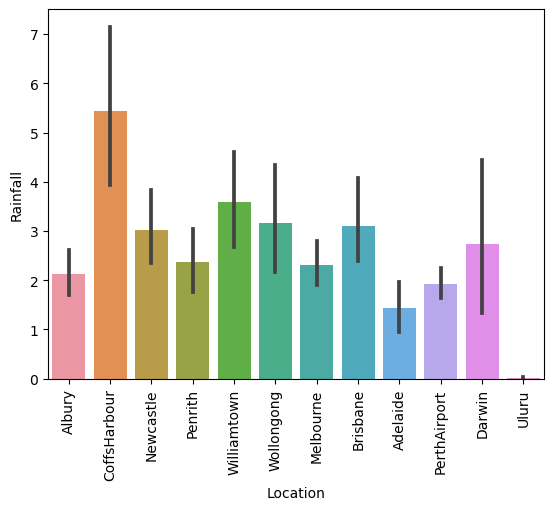

In [229]:
sns.barplot(x='Location',y='Rainfall',data=df)
plt.xticks(rotation=90)
plt.show()

Rainfall is highest in Coffs Harbour and lowest in Uluru locations.

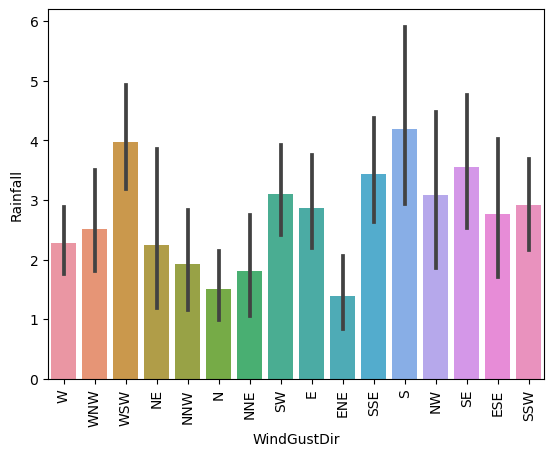

In [230]:
sns.barplot(x='WindGustDir',y='Rainfall',data=df)
plt.xticks(rotation=90)
plt.show()

When the direction of the strongest wind is south, the maximum rainfall occurs.

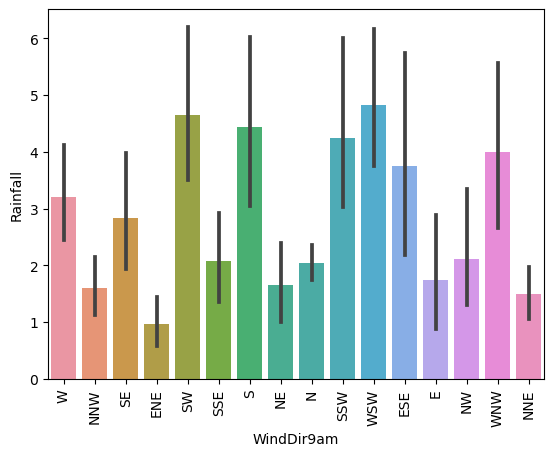

In [232]:
sns.barplot(x='WindDir9am',y='Rainfall',data=df)
plt.xticks(rotation=90)
plt.show()

Maximum rainfall occurs when the wind direction at 9 am is WSW (West-Southwest).

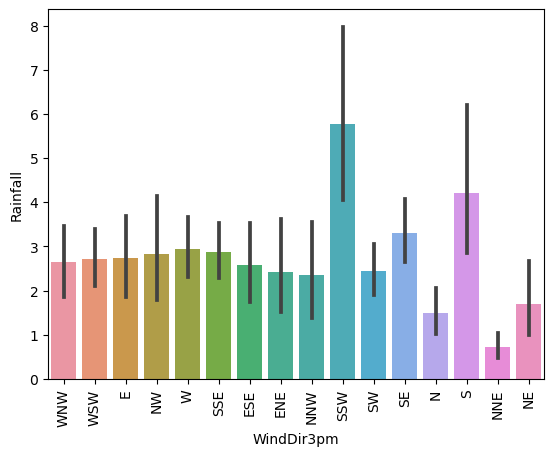

In [233]:
sns.barplot(x='WindDir3pm',y='Rainfall',data=df)
plt.xticks(rotation=90)
plt.show()

Maximum rainfall occurs when the wind direction at 3 pm is SSW (South-Southwest).

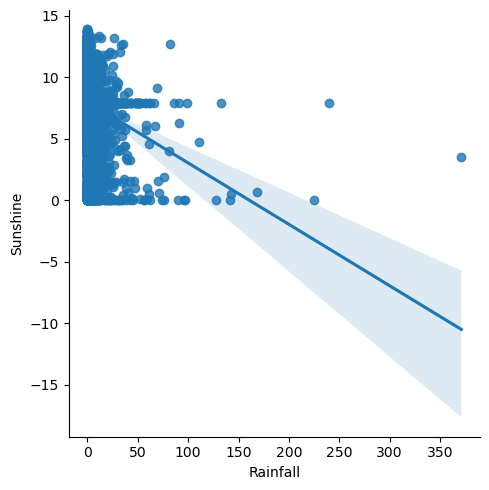

In [234]:
sns.lmplot(x='Rainfall',y='Sunshine',data=df)
plt.show()

There is a negative correlation between Rainfall and Sunshine: as the amount of sunshine increases, the amount of rainfall decreases.

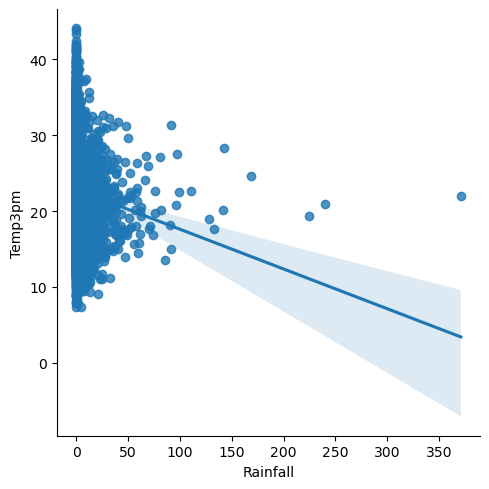

In [235]:
sns.lmplot(x='Rainfall',y='Temp3pm',data=df)
plt.show()

There is a negative correlation between Rainfall and Temp3pm: as the temperature at 3 pm increases, the amount of rainfall decreases.

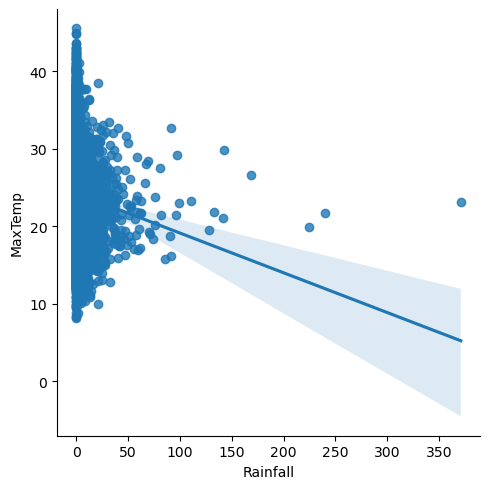

In [236]:
sns.lmplot(x='Rainfall',y='MaxTemp',data=df)
plt.show()

There is a negative correlation between Rainfall and MaxTemp: as the maximum temperature increases, the amount of rainfall decreases.

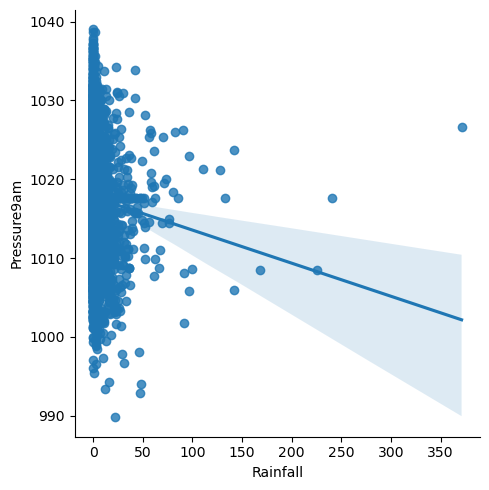

In [237]:
sns.lmplot(x='Rainfall',y='Pressure9am',data=df)
plt.show()

There is a negative correlation between Rainfall and Pressure9am, meaning as atmospheric pressure at 9 am increases, rainfall decreases.

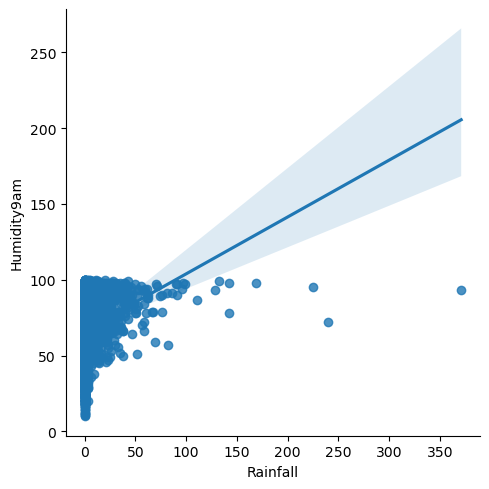

In [238]:
sns.lmplot(x='Rainfall',y='Humidity9am',data=df)
plt.show()

A positive relationship can be seen between Humidity9am and Rainfall, meaning as humidity at 9 am increases, the amount of rainfall also increases.

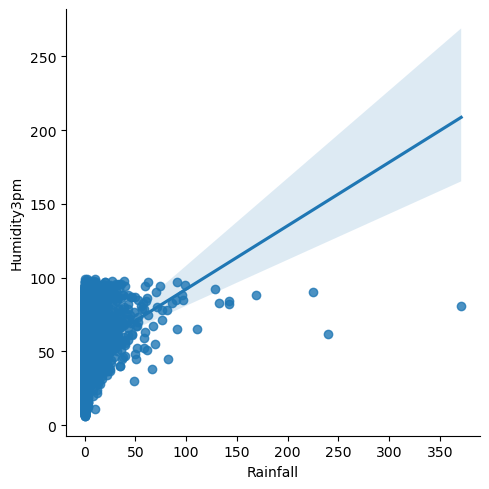

In [239]:
sns.lmplot(x='Rainfall',y='Humidity3pm',data=df)
plt.show()

A positive relationship can be seen between Humidity3pm and Rainfall, indicating that as humidity at 3 pm increases, the amount of rainfall also increases.

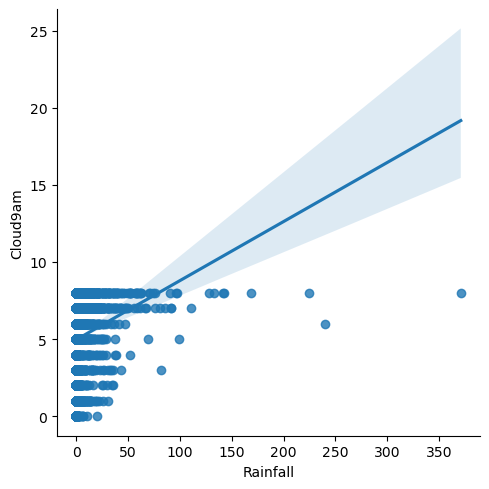

In [240]:
sns.lmplot(x='Rainfall',y='Cloud9am',data=df)
plt.show()

We observe a positive correlation between Cloud9am and rainfall, indicating that an increase in cloud fraction corresponds to a higher amount of rainfall

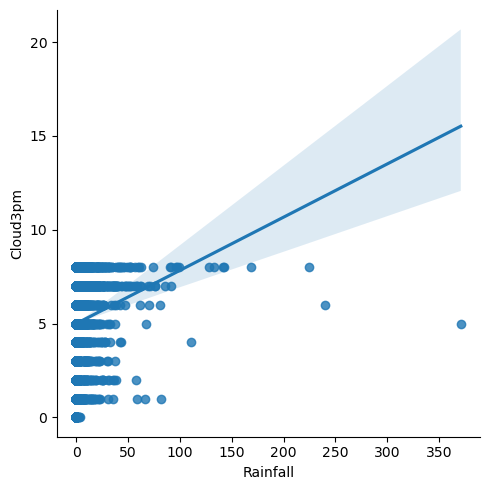

In [241]:
sns.lmplot(x='Rainfall',y='Cloud3pm',data=df)
plt.show()

A positive relationship can be observed between Cloud3pm and Rainfall, suggesting that as the cloud fraction at 3 pm increases, the amount of rainfall also increases.

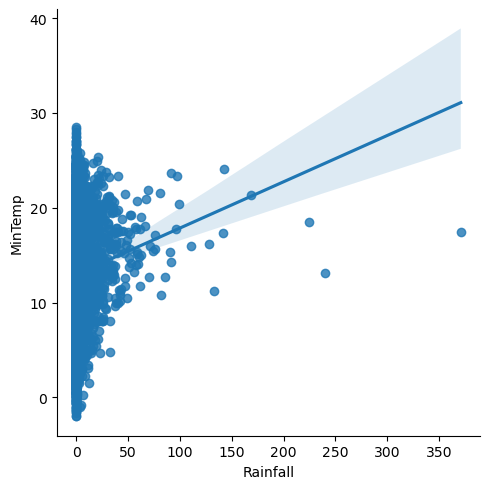

In [242]:
sns.lmplot(x='Rainfall',y='MinTemp',data=df)
plt.show()

A positive relationship can be observed between MinTemp and Rainfall, implying that as the minimum temperature increases, the amount of rainfall also increases.

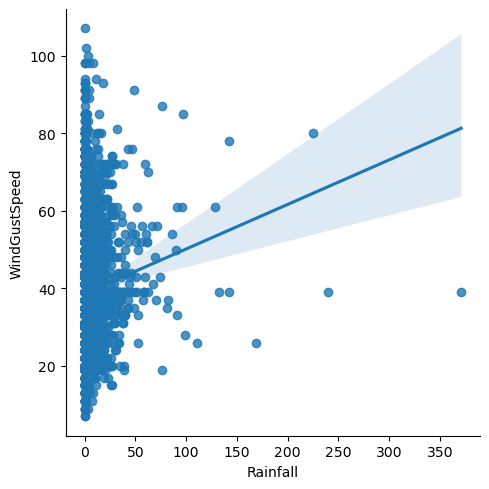

In [243]:
sns.lmplot(x='Rainfall',y='WindGustSpeed',data=df)
plt.show()

A positive relationship can be observed between WindGustSpeed and Rainfall, indicating that as the speed of the strongest wind increases, the amount of rainfall also increases.

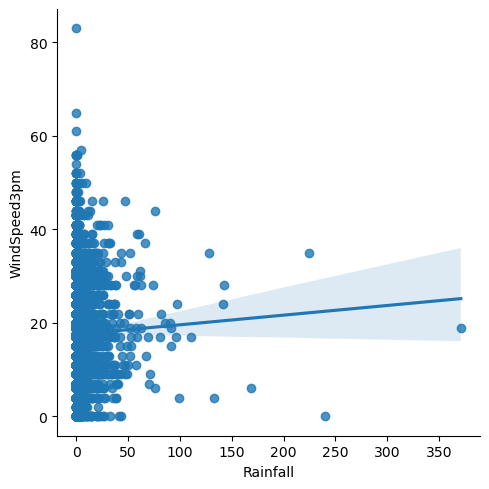

In [244]:
sns.lmplot(x='Rainfall',y='WindSpeed3pm',data=df)
plt.show()

A positive relationship can be observed between WindSpeed3pm and Rainfall, suggesting that as the wind speed at 3 pm increases, the amount of rainfall also increases.

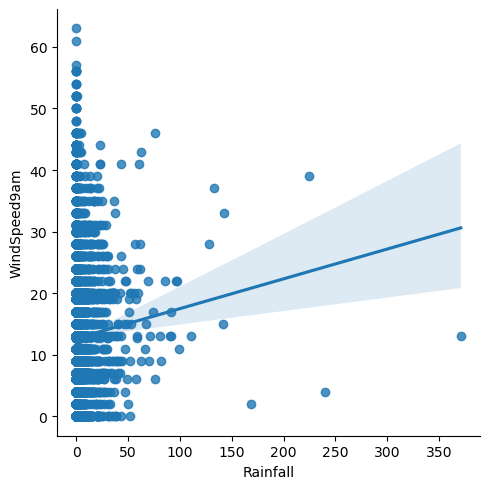

In [245]:
sns.lmplot(x='Rainfall',y='WindSpeed9am',data=df)
plt.show()

A positive relationship can be observed between WindSpeed9am and Rainfall, indicating that as the wind speed at 9 am increases, the amount of rainfall also increases.

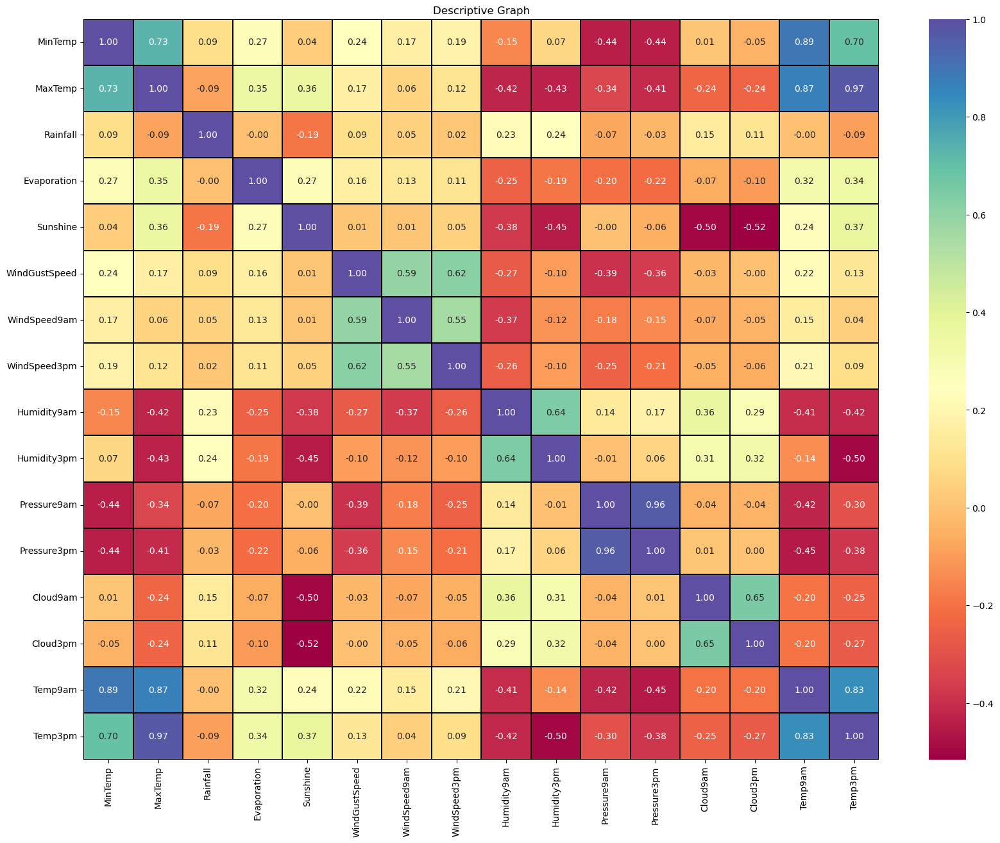

In [248]:
numeric_df = df.select_dtypes(include=['float64', 'int64'])
plt.figure(figsize=(20, 15))
sns.heatmap(numeric_df.corr(), annot=True, fmt='0.2f', linewidth=0.2, linecolor='Black', cmap='Spectral')
plt.title('Descriptive Graph')
plt.show()

# Observations:
- There is a 73% positive correlation between MinTemp and MaxTemp.
- There is an 89% positive correlation between MinTemp and Temp9am.
- There is an 87% positive correlation between MaxTemp and Temp9am.
- There is a 97% positive correlation between MaxTemp and Temp3pm.
- There is a negative correlation between Sunshine and Cloud9am, as well as Cloud3pm.
- There is a negative correlation between MinTemp and Pressure9am, as well as Pressure3pm.
- There is an 83% positive correlation between Temp3pm and Temp9am.
- There is a 96% positive correlation between Pressure3pm and Pressure9am.

# 3.Multivariate analysis-

In [249]:
num_col= df.select_dtypes(include=['float64'])
num_col.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

In [250]:
cat_col= df.select_dtypes(include=['object'])
cat_col.columns

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')

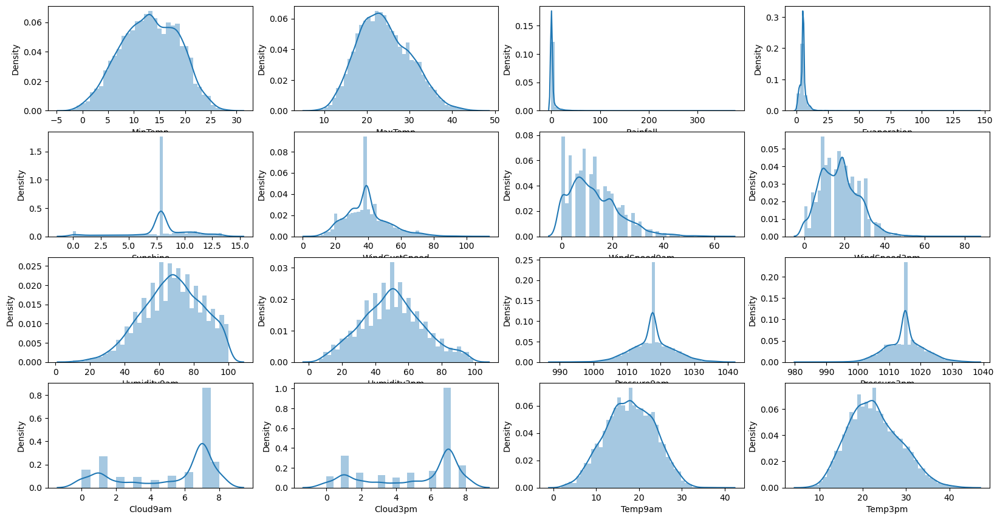

In [251]:
plt.figure(figsize=(20,13))
plotnumber=1

for col in num_col:
    if plotnumber<=20:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col)
        plt.yticks(rotation=0)
    plotnumber+=1
plt.show() 

In [252]:
num_col.skew()

MinTemp          -0.083706
MaxTemp           0.327598
Rainfall         13.650294
Evaporation      13.553368
Sunshine         -0.882147
WindGustSpeed     0.780437
WindSpeed9am      0.957036
WindSpeed3pm      0.549797
Humidity9am      -0.256177
Humidity3pm       0.150860
Pressure9am       0.022085
Pressure3pm       0.042990
Cloud9am         -0.727856
Cloud3pm         -0.699539
Temp9am          -0.047213
Temp3pm           0.348100
dtype: float64

Here, we observe that the skewness in columns like Rainfall, Evaporation, Sunshine, WindGustSpeed, and WindSpeed9am exceeds the acceptable range, which is between -0.5 to 0.5. As Cloud9am and Cloud3pm are categorical columns, skewness in these columns is not a concern.

# Using the Power Transformer method, we aim to eliminate skewness from the dataset.

In [253]:
from sklearn.preprocessing import PowerTransformer

In [254]:
features=['Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am']

In [255]:
x=PowerTransformer(method='yeo-johnson') 
df[features]=x.fit_transform(df[features].values)

In [256]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.592756,0.17104,-0.099351,W,0.470420,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,-0.681888,0.17104,-0.099351,WNW,0.470420,NNW,WSW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,-0.681888,0.17104,-0.099351,WSW,0.607493,W,WSW,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,-0.681888,0.17104,-0.099351,NE,-1.189815,SE,E,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,0.950465,0.17104,-0.099351,W,0.257219,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,-0.681888,0.17104,-0.099351,E,-0.534275,SE,ENE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,-0.681888,0.17104,-0.099351,NNW,-1.398629,SE,N,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,-0.681888,0.17104,-0.099351,N,-0.042965,SE,WNW,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No


In [257]:
num_col.skew()

MinTemp          -0.083706
MaxTemp           0.327598
Rainfall         13.650294
Evaporation      13.553368
Sunshine         -0.882147
WindGustSpeed     0.780437
WindSpeed9am      0.957036
WindSpeed3pm      0.549797
Humidity9am      -0.256177
Humidity3pm       0.150860
Pressure9am       0.022085
Pressure3pm       0.042990
Cloud9am         -0.727856
Cloud3pm         -0.699539
Temp9am          -0.047213
Temp3pm           0.348100
dtype: float64

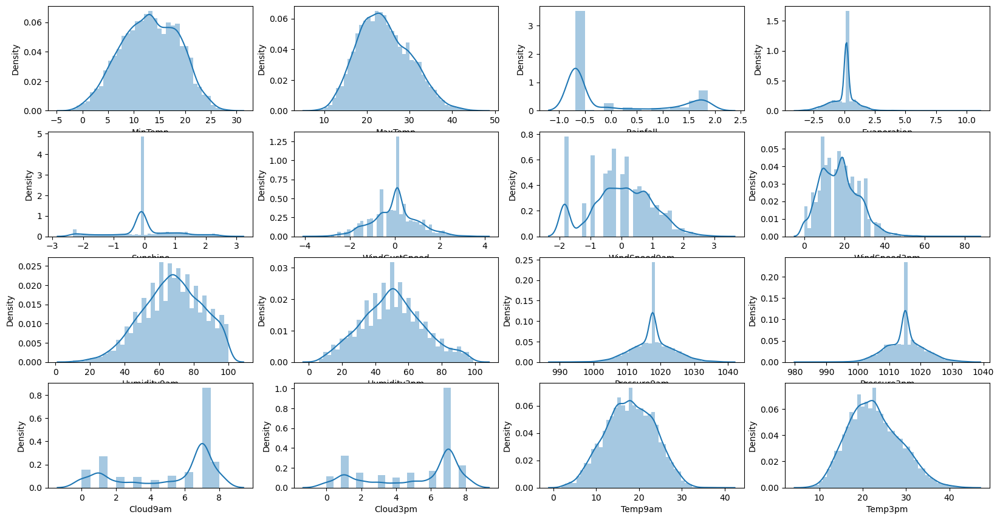

In [258]:
plt.figure(figsize=(20,13))
plotnumber=1

for col in num_col:
    if plotnumber<=20:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col)
        plt.yticks(rotation=0)
    plotnumber+=1
plt.show() 

We can conclude that the skewness is now within the acceptable range.

# Outliers

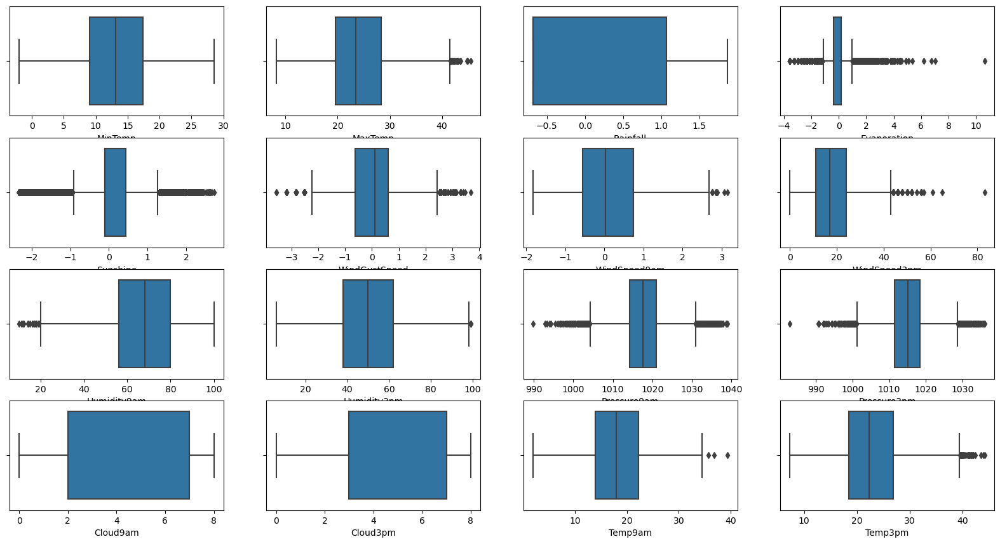

In [259]:
plt.figure(figsize=(20,13))
plotnumber=1

for col in num_col:
    if plotnumber<=20:
        ax=plt.subplot(5,4,plotnumber)
        sns.boxplot(x=df[col])
        plt.xlabel(col)
        plt.yticks(rotation=0)
    plotnumber+=1
plt.show() 

We can observe the presence of outliers in columns such as MaxTemp, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Temp9am, and Temp3pm.

# Removing outliers using the Zscore method:

In [265]:
num_col= df.select_dtypes(include=['float64'])
num_col.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

In [266]:
from scipy.stats import zscore
import numpy as np

In [267]:
x=num_col

In [268]:
z=np.abs(zscore(x))
z.shape

(6762, 16)

In [269]:
threshold=3
print(np.where(z>3))

(array([  12,   12,   44,   44,   52,   52,   60,   60,   61,   61,   62,
         62,   67,   68,   68,  123,  271,  296,  381,  381,  405,  406,
        407,  466,  466,  563,  567,  568,  568,  569,  602,  602,  603,
        683,  683,  748,  748, 1008, 1189, 1387, 1413, 1467, 1480, 1587,
       1644, 1665, 1898, 2028, 2043, 2219, 2230, 2346, 2373, 2389, 2505,
       2527, 2527, 2710, 2738, 2743, 2744, 2768, 2827, 2835, 2849, 2855,
       2859, 2863, 2869, 2877, 2883, 2891, 2897, 2905, 2911, 2919, 2925,
       2933, 2939, 2947, 2953, 2961, 2967, 2975, 2989, 3051, 3058, 3059,
       3059, 3060, 3066, 3067, 3067, 3082, 3082, 3098, 3099, 3099, 3101,
       3139, 3141, 3150, 3153, 3157, 3164, 3167, 3172, 3172, 3178, 3185,
       3206, 3212, 3212, 3212, 3213, 3221, 3227, 3248, 3260, 3278, 3278,
       3280, 3291, 3302, 3302, 3303, 3449, 3449, 3449, 3450, 3450, 3458,
       3471, 3603, 3617, 3675, 3676, 3676, 3714, 3716, 3766, 3766, 3767,
       3786, 3820, 3825, 3826, 3826, 3911, 3919, 3

In [270]:
df1=df[(z<3).all(axis=1)]
df1

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.592756,0.17104,-0.099351,W,0.470420,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,-0.681888,0.17104,-0.099351,WNW,0.470420,NNW,WSW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,-0.681888,0.17104,-0.099351,WSW,0.607493,W,WSW,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,-0.681888,0.17104,-0.099351,NE,-1.189815,SE,E,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,0.950465,0.17104,-0.099351,W,0.257219,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,-0.681888,0.17104,-0.099351,E,-0.534275,SE,ENE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,-0.681888,0.17104,-0.099351,NNW,-1.398629,SE,N,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,-0.681888,0.17104,-0.099351,N,-0.042965,SE,WNW,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No


# Data Loss

In [271]:
(6762-6556)/6762*100

3.046435965690624

Thus, we can see that the data loss is only 3%, which is within the acceptable range.

In [272]:
df=df1
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.592756,0.17104,-0.099351,W,0.470420,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,-0.681888,0.17104,-0.099351,WNW,0.470420,NNW,WSW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,-0.681888,0.17104,-0.099351,WSW,0.607493,W,WSW,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,-0.681888,0.17104,-0.099351,NE,-1.189815,SE,E,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,0.950465,0.17104,-0.099351,W,0.257219,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,-0.681888,0.17104,-0.099351,E,-0.534275,SE,ENE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,-0.681888,0.17104,-0.099351,NNW,-1.398629,SE,N,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,-0.681888,0.17104,-0.099351,N,-0.042965,SE,WNW,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No


In [273]:
cat_col

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
Date,,,,,,
2008-12-01,Albury,W,W,WNW,No,No
2008-12-02,Albury,WNW,NNW,WSW,No,No
2008-12-03,Albury,WSW,W,WSW,No,No
2008-12-04,Albury,NE,SE,E,No,No
2008-12-05,Albury,W,ENE,NW,No,No
...,...,...,...,...,...,...
2017-06-21,Uluru,E,SE,ENE,No,No
2017-06-22,Uluru,NNW,SE,N,No,No
2017-06-23,Uluru,N,SE,WNW,No,No


# Encoding of the object data-

In [274]:
cat_col.columns

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')

In [275]:
cat_col.nunique()

Location        12
WindGustDir     16
WindDir9am      16
WindDir3pm      16
RainToday        2
RainTomorrow     2
dtype: int64

# Applying binary encoding to columns with more than 8 categories.

In [276]:
from category_encoders import BinaryEncoder
be=BinaryEncoder()

In [277]:
df[['Location_0','Location_1','Location_2','Location_3','WindGustDir_0','WindGustDir_1','WindGustDir_2','WindGustDir_3','WindGustDir_4','WindDir9am_0','WindDir9am_1','WindDir9am_2','WindDir9am_3','WindDir9am_4','WindDir3pm_0','WindDir3pm_1','WindDir3pm_2','WindDir3pm_3','WindDir3pm_4']]=be.fit_transform(df[['Location','WindGustDir','WindDir9am','WindDir3pm']],inplace=True)

In [278]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.592756,0.17104,-0.099351,W,0.470420,W,WNW,...,0,0,0,0,1,0,0,0,0,1
2008-12-02,Albury,7.4,25.100000,-0.681888,0.17104,-0.099351,WNW,0.470420,NNW,WSW,...,0,0,0,1,0,0,0,0,1,0
2008-12-03,Albury,12.9,25.700000,-0.681888,0.17104,-0.099351,WSW,0.607493,W,WSW,...,0,0,0,0,1,0,0,0,1,0
2008-12-04,Albury,9.2,28.000000,-0.681888,0.17104,-0.099351,NE,-1.189815,SE,E,...,0,0,0,1,1,0,0,0,1,1
2008-12-05,Albury,17.5,32.300000,0.950465,0.17104,-0.099351,W,0.257219,ENE,NW,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,-0.681888,0.17104,-0.099351,E,-0.534275,SE,ENE,...,0,0,0,1,1,0,1,0,0,0
2017-06-22,Uluru,3.6,25.300000,-0.681888,0.17104,-0.099351,NNW,-1.398629,SE,N,...,0,0,0,1,1,0,1,1,0,1
2017-06-23,Uluru,5.4,26.900000,-0.681888,0.17104,-0.099351,N,-0.042965,SE,WNW,...,0,0,0,1,1,0,0,0,0,1


In [279]:
df=df.drop(columns=['Location','WindGustDir','WindDir9am','WindDir3pm'],axis=1)
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,13.4,22.900000,0.592756,0.17104,-0.099351,0.470420,0.826343,24.0,71.0,22.0,...,0,0,0,0,1,0,0,0,0,1
2008-12-02,7.4,25.100000,-0.681888,0.17104,-0.099351,0.470420,-0.868318,22.0,44.0,25.0,...,0,0,0,1,0,0,0,0,1,0
2008-12-03,12.9,25.700000,-0.681888,0.17104,-0.099351,0.607493,0.748912,26.0,38.0,30.0,...,0,0,0,0,1,0,0,0,1,0
2008-12-04,9.2,28.000000,-0.681888,0.17104,-0.099351,-1.189815,0.032879,9.0,45.0,16.0,...,0,0,0,1,1,0,0,0,1,1
2008-12-05,17.5,32.300000,0.950465,0.17104,-0.099351,0.257219,-0.428868,20.0,82.0,33.0,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,2.8,23.400000,-0.681888,0.17104,-0.099351,-0.534275,0.231834,11.0,51.0,24.0,...,0,0,0,1,1,0,1,0,0,0
2017-06-22,3.6,25.300000,-0.681888,0.17104,-0.099351,-1.398629,0.231834,9.0,56.0,21.0,...,0,0,0,1,1,0,1,1,0,1
2017-06-23,5.4,26.900000,-0.681888,0.17104,-0.099351,-0.042965,-0.185237,9.0,53.0,24.0,...,0,0,0,1,1,0,0,0,0,1


In [280]:
df.dtypes

MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
Location_0         int64
Location_1         int64
Location_2         int64
Location_3         int64
WindGustDir_0      int64
WindGustDir_1      int64
WindGustDir_2      int64
WindGustDir_3      int64
WindGustDir_4      int64
WindDir9am_0       int64
WindDir9am_1       int64
WindDir9am_2       int64
WindDir9am_3       int64
WindDir9am_4       int64
WindDir3pm_0       int64
WindDir3pm_1       int64
WindDir3pm_2       int64
WindDir3pm_3       int64
WindDir3pm_4       int64
dtype: object

# Applying label encoding to columns with only 2 categories.

In [281]:
from sklearn.preprocessing import LabelEncoder
x= LabelEncoder()

In [282]:
df1=x.fit_transform(df['RainToday'])
pd.Series(df1)

0       0
1       0
2       0
3       0
4       0
       ..
6551    0
6552    0
6553    0
6554    0
6555    0
Length: 6556, dtype: int32

In [283]:
df2=x.fit_transform(df['RainTomorrow'])
pd.Series(df2)

0       0
1       0
2       0
3       0
4       0
       ..
6551    0
6552    0
6553    0
6554    0
6555    0
Length: 6556, dtype: int32

In [284]:
df['RainToday']=df1

In [285]:
df['RainTomorrow']=df2

In [286]:
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,13.4,22.900000,0.592756,0.17104,-0.099351,0.470420,0.826343,24.0,71.0,22.0,...,0,0,0,0,1,0,0,0,0,1
2008-12-02,7.4,25.100000,-0.681888,0.17104,-0.099351,0.470420,-0.868318,22.0,44.0,25.0,...,0,0,0,1,0,0,0,0,1,0
2008-12-03,12.9,25.700000,-0.681888,0.17104,-0.099351,0.607493,0.748912,26.0,38.0,30.0,...,0,0,0,0,1,0,0,0,1,0
2008-12-04,9.2,28.000000,-0.681888,0.17104,-0.099351,-1.189815,0.032879,9.0,45.0,16.0,...,0,0,0,1,1,0,0,0,1,1
2008-12-05,17.5,32.300000,0.950465,0.17104,-0.099351,0.257219,-0.428868,20.0,82.0,33.0,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,2.8,23.400000,-0.681888,0.17104,-0.099351,-0.534275,0.231834,11.0,51.0,24.0,...,0,0,0,1,1,0,1,0,0,0
2017-06-22,3.6,25.300000,-0.681888,0.17104,-0.099351,-1.398629,0.231834,9.0,56.0,21.0,...,0,0,0,1,1,0,1,1,0,1
2017-06-23,5.4,26.900000,-0.681888,0.17104,-0.099351,-0.042965,-0.185237,9.0,53.0,24.0,...,0,0,0,1,1,0,0,0,0,1


In [287]:
df.dtypes

MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday          int32
RainTomorrow       int32
Location_0         int64
Location_1         int64
Location_2         int64
Location_3         int64
WindGustDir_0      int64
WindGustDir_1      int64
WindGustDir_2      int64
WindGustDir_3      int64
WindGustDir_4      int64
WindDir9am_0       int64
WindDir9am_1       int64
WindDir9am_2       int64
WindDir9am_3       int64
WindDir9am_4       int64
WindDir3pm_0       int64
WindDir3pm_1       int64
WindDir3pm_2       int64
WindDir3pm_3       int64
WindDir3pm_4       int64
dtype: object

Now we can see that all our categorical data is encoded.

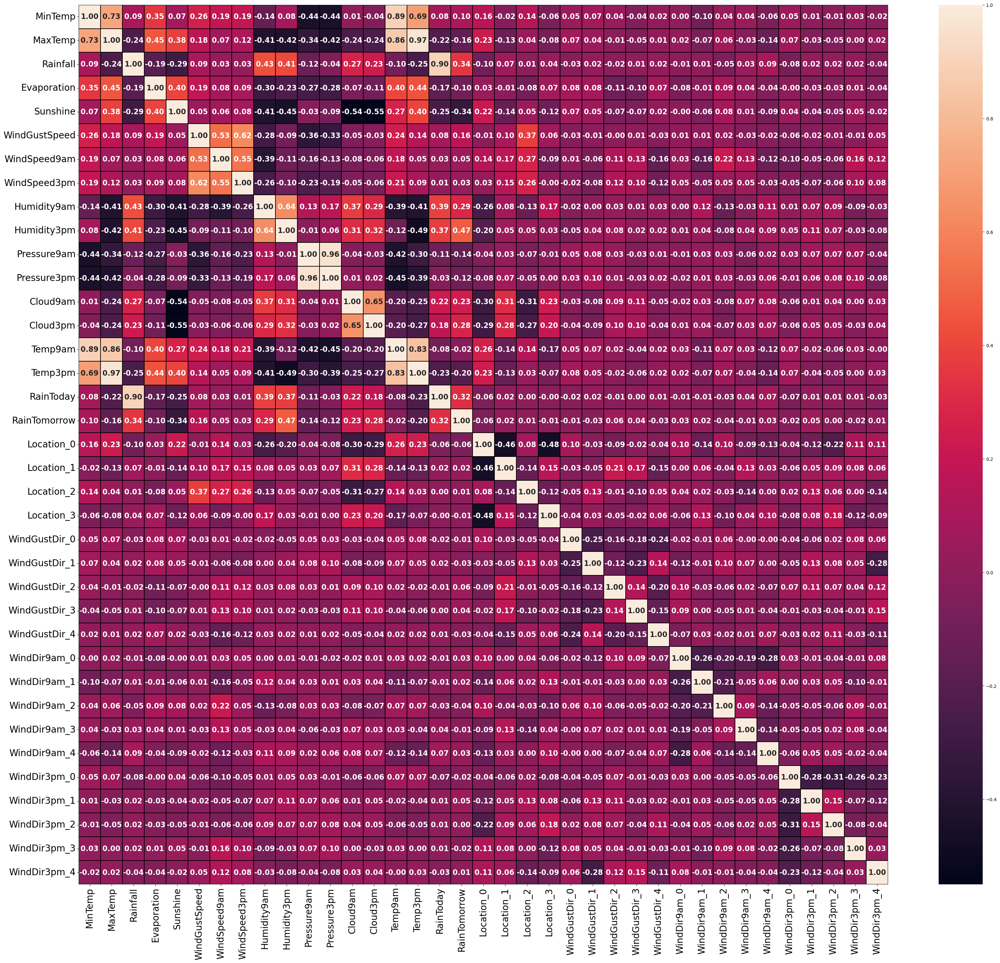

In [288]:
plt.figure(figsize=(40,35))
sns.heatmap(df.corr(),annot=True,fmt='.2f',linecolor='black',linewidth=0.2,annot_kws={'fontsize': 16,'fontweight': 'bold'})
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

# Observations:

- Minimum temperature (Mintemp) and temperature at 9 am (Temp9am) have an 89% positive correlation.
- Maximum temperature (Maxtemp) and temperature at 3 pm (Temp3pm) have a 97% positive correlation.
- Rainfall and rain today (Raintoday) have a 90% positive correlation.
- Temperature at 9 am (Temp9am) and temperature at 3 pm (Temp3pm) have an 83% positive correlation.
- Sunshine, Temp3pm, Maxtemp, Pressure9am, Pressure3pm, Evaporation, Location_0, Winddir9am_2, WindGustdir_4, WindGustdir_1, Temp9am, WindDir3pm_0, WindDir3pm_3, WindGustdir_0, WindDir9am_3, and Location_3 have a negative correlation with the target variable.

# Correlation between features and the target variable:

In [289]:
df.corr()['Rainfall'].sort_values(ascending=False).to_frame()

,Rainfall
Rainfall,1.000000
RainToday,0.899025
Humidity9am,0.430460
Humidity3pm,0.412119
RainTomorrow,0.344339
Cloud9am,0.271084
Cloud3pm,0.225798
WindGustSpeed,0.094637
MinTemp,0.094343
WindDir9am_4,0.090237


# Graphical depiction of the relationship between features and the target variable:¶

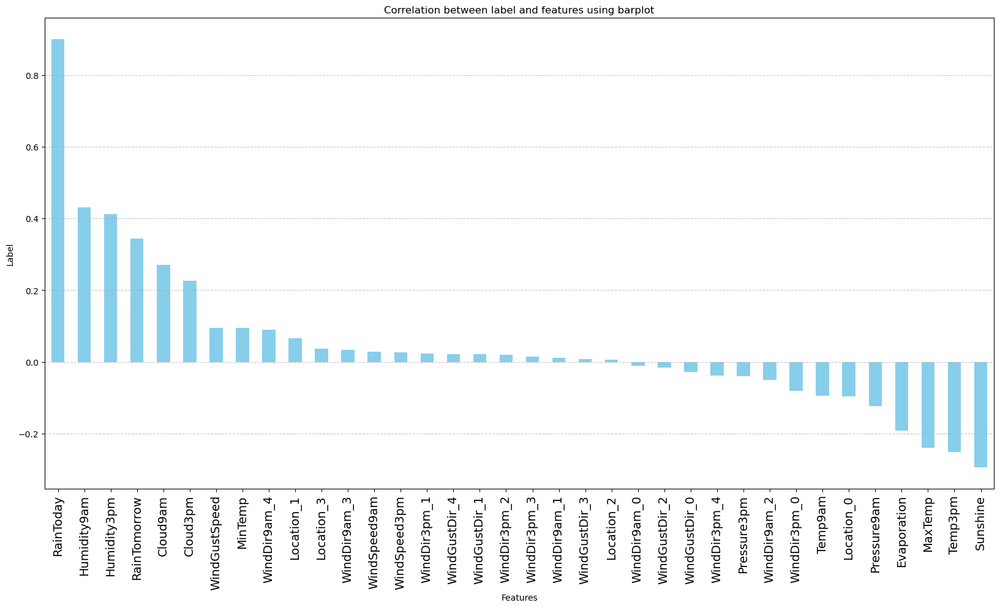

In [291]:
plt.figure(figsize=(20,10))
df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar', color='skyblue')
plt.xlabel('Features')
plt.ylabel('Label')
plt.xticks(fontsize=14)
plt.title('Correlation between label and features using barplot')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Observations:

- Humidity at 3 pm (Humidity3pm), Sunshine, and Rainfall have the strongest relationship with the target variable.
- Sunshine has a negative correlation with the target variable.
- Columns such as Location_1, WindDir9am_1, WindDir3pm_4, Location_2, WindDir3pm_2, Location_3, WindDir9am_3, WindGustDir_0, and WindDir3pm_3 have the least correlation with the target variable.

In [292]:
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,13.4,22.900000,0.592756,0.17104,-0.099351,0.470420,0.826343,24.0,71.0,22.0,...,0,0,0,0,1,0,0,0,0,1
2008-12-02,7.4,25.100000,-0.681888,0.17104,-0.099351,0.470420,-0.868318,22.0,44.0,25.0,...,0,0,0,1,0,0,0,0,1,0
2008-12-03,12.9,25.700000,-0.681888,0.17104,-0.099351,0.607493,0.748912,26.0,38.0,30.0,...,0,0,0,0,1,0,0,0,1,0
2008-12-04,9.2,28.000000,-0.681888,0.17104,-0.099351,-1.189815,0.032879,9.0,45.0,16.0,...,0,0,0,1,1,0,0,0,1,1
2008-12-05,17.5,32.300000,0.950465,0.17104,-0.099351,0.257219,-0.428868,20.0,82.0,33.0,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,2.8,23.400000,-0.681888,0.17104,-0.099351,-0.534275,0.231834,11.0,51.0,24.0,...,0,0,0,1,1,0,1,0,0,0
2017-06-22,3.6,25.300000,-0.681888,0.17104,-0.099351,-1.398629,0.231834,9.0,56.0,21.0,...,0,0,0,1,1,0,1,1,0,1
2017-06-23,5.4,26.900000,-0.681888,0.17104,-0.099351,-0.042965,-0.185237,9.0,53.0,24.0,...,0,0,0,1,1,0,0,0,0,1


# Preparing Data for Machine Learning

# Splitting

Choose the dependent(label)and independent variables

In [293]:
X = df.drop('Rainfall', axis=1)
Y = df['Rainfall']

In [294]:
X

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,13.4,22.900000,0.17104,-0.099351,0.470420,0.826343,24.0,71.0,22.0,1007.7,...,0,0,0,0,1,0,0,0,0,1
2008-12-02,7.4,25.100000,0.17104,-0.099351,0.470420,-0.868318,22.0,44.0,25.0,1010.6,...,0,0,0,1,0,0,0,0,1,0
2008-12-03,12.9,25.700000,0.17104,-0.099351,0.607493,0.748912,26.0,38.0,30.0,1007.6,...,0,0,0,0,1,0,0,0,1,0
2008-12-04,9.2,28.000000,0.17104,-0.099351,-1.189815,0.032879,9.0,45.0,16.0,1017.6,...,0,0,0,1,1,0,0,0,1,1
2008-12-05,17.5,32.300000,0.17104,-0.099351,0.257219,-0.428868,20.0,82.0,33.0,1010.8,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,2.8,23.400000,0.17104,-0.099351,-0.534275,0.231834,11.0,51.0,24.0,1024.6,...,0,0,0,1,1,0,1,0,0,0
2017-06-22,3.6,25.300000,0.17104,-0.099351,-1.398629,0.231834,9.0,56.0,21.0,1023.5,...,0,0,0,1,1,0,1,1,0,1
2017-06-23,5.4,26.900000,0.17104,-0.099351,-0.042965,-0.185237,9.0,53.0,24.0,1021.0,...,0,0,0,1,1,0,0,0,0,1


In [295]:
Y

Date
2008-12-01    0.592756
2008-12-02   -0.681888
2008-12-03   -0.681888
2008-12-04   -0.681888
2008-12-05    0.950465
                ...   
2017-06-21   -0.681888
2017-06-22   -0.681888
2017-06-23   -0.681888
2017-06-24   -0.681888
2017-06-25   -0.681888
Name: Rainfall, Length: 6556, dtype: float64

In [296]:
X.shape

(6556, 36)

In [298]:
Y.shape

(6556,)

# Feature Scaling

In [299]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X 

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
0,0.054934,-0.194662,0.20409,-0.105671,0.503083,0.847046,0.722205,0.201187,-1.553135,-1.734465,...,-0.227642,-1.147792,-0.881849,-0.843388,0.811472,-0.279486,-1.017853,-1.101530,-0.932418,1.229976
1,-1.031220,0.171175,0.20409,-0.105671,0.503083,-0.859278,0.505111,-1.386412,-1.389957,-1.230643,...,-0.227642,-1.147792,-0.881849,1.185695,-1.232328,-0.279486,-1.017853,-1.101530,1.072480,-0.813024
2,-0.035579,0.270948,0.20409,-0.105671,0.644228,0.769082,0.939300,-1.739211,-1.117994,-1.751838,...,-0.227642,-1.147792,-0.881849,-0.843388,0.811472,-0.279486,-1.017853,-1.101530,1.072480,-0.813024
3,-0.705374,0.653415,0.20409,-0.105671,-1.206480,0.048121,-0.906006,-1.327612,-1.879492,-0.014520,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,-1.017853,-1.101530,1.072480,1.229976
4,0.797139,1.368460,0.20409,-0.105671,0.283547,-0.416804,0.288016,0.847986,-0.954816,-1.195896,...,-0.227642,-1.147792,1.133981,-0.843388,-1.232328,-0.279486,-1.017853,0.907828,-0.932418,-0.813024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6551,-1.863939,-0.111518,0.20409,-0.105671,-0.531463,0.248445,-0.688911,-0.974812,-1.444350,1.201602,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,0.982460,-1.101530,-0.932418,-0.813024
6552,-1.719118,0.204433,0.20409,-0.105671,-1.421498,0.248445,-0.906006,-0.680812,-1.607528,1.010497,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,0.982460,0.907828,-0.932418,1.229976
6553,-1.393272,0.470496,0.20409,-0.105671,-0.025556,-0.171495,-0.906006,-0.857212,-1.444350,0.576168,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,-1.017853,-1.101530,-0.932418,1.229976
6554,-0.958810,0.487125,0.20409,-0.105671,-0.807717,0.248445,-1.123100,-0.974812,-1.444350,0.298197,...,-0.227642,-1.147792,1.133981,1.185695,-1.232328,-0.279486,0.982460,0.907828,-0.932418,1.229976


To address potential bias stemming from variations in decimal places across feature columns, I've opted to standardize all the features using the Standard Scaler method. This technique ensures that all feature columns have comparable scales, which can enhance the performance and stability of my model.

# Assessing multicollinearity among features.

In [300]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [301]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values,i) for i in range(len(X.columns))]
vif['Features']=X.columns
vif

,VIF Values,Features
0,9.335153,MinTemp
1,26.223146,MaxTemp
2,1.655995,Evaporation
3,2.197593,Sunshine
4,2.455385,WindGustSpeed
5,2.303550,WindSpeed9am
6,2.027392,WindSpeed3pm
7,4.082257,Humidity9am
8,5.927179,Humidity3pm
9,19.124108,Pressure9am


Here, we can see that a few columns, such as MaxTemp, Pressure9am, Pressure3pm, Temp9am, and Temp3pm, exhibit multicollinearity issues.

# Dropping multicollinear columns-

In [302]:
X=X.drop(columns=['MaxTemp','Pressure9am','Temp3pm','Temp9am'])

In [303]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values,i) for i in range(len(X.columns))]
vif['Features']=X.columns
vif

,VIF Values,Features
0,1.609301,MinTemp
1,1.633726,Evaporation
2,2.132861,Sunshine
3,2.419568,WindGustSpeed
4,2.206125,WindSpeed9am
5,1.943850,WindSpeed3pm
6,2.584418,Humidity9am
7,2.381969,Humidity3pm
8,1.491208,Pressure3pm
9,2.229440,Cloud9am


Now we observe that multicollinearity is within an acceptable range, indicating that the issue has been resolved.

In [304]:
Y.value_counts()

Rainfall
-0.681888    4214
-0.081003     305
 0.315209     140
 1.509862     134
 0.592756      86
             ... 
 1.868022       1
 1.857299       1
 1.865475       1
 1.847357       1
 1.859155       1
Name: count, Length: 242, dtype: int64

In [305]:
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.30,random_state=i) 
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)   
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('Best accuracy is', maxacc,'at random state',maxrs) 

Best accuracy is 0.8593795895427776 at random state 168


In [306]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=maxrs)

20% of the dataset will be used for testing, and the remaining 80% for training our machine learning models.

In [308]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
print()
def evaluate_regression(model, X, Y):
    print('Model Name:',model)
    # Splitting data into train and test sets
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=maxrs)
    
    # Training the model
    model.fit(X_train, Y_train)
    
    # Predicting y_test
    pred = model.predict(X_test)
    
    # Predicting y_train
    train = model.predict(X_train)
    
    
    # R-squared Score
    r2 = r2_score(Y_test, pred)
    print("R-squared Score:", r2)
    
    #R-squared Score on training data
    r3 = r2_score(Y_train, train)
    print("R-squared Score on training data:", r3*100)
    
    # Mean Absolute Error
    mae = mean_absolute_error(Y_test, pred)
    print("Mean Absolute Error:", mae)
    
    # Mean Squared Error
    mse = mean_squared_error(Y_test, pred)
    print("Mean Squared Error:", mse)
    
    # Root Mean Squared Error
    rmse =np.sqrt(mean_squared_error(Y_test, pred))
    print("Root Mean Squared Error:", rmse)
    
    
    
    # Cross Validation Score
    cv_score = cross_val_score(model, X, Y, cv=5, scoring='r2') 
    print("\nCross Validation Score:", cv_score)
    print("Cross Validation Score Mean:", cv_score.mean())
    
    # Result of accuracy minus cv scores
    result = r2 - cv_score.mean()
    print("R-squared Score - Cross Validation Score is", result*100)


In [309]:
# Linear Regression
LR = LinearRegression()
evaluate_regression(LR,X, Y)

Model Name: LinearRegression()
R-squared Score: 0.8592270179595289
R-squared Score on training data: 81.95635661468982
Mean Absolute Error: 0.24797068945220038
Mean Squared Error: 0.14328925702546955
Root Mean Squared Error: 0.37853567470645294

Cross Validation Score: [0.86622872 0.81612392 0.76687978 0.73942231 0.88792381]
Cross Validation Score Mean: 0.8153157083746653
R-squared Score - Cross Validation Score is 4.391130958486366


In [310]:
# Ridge Regressor
RDG = Ridge()
evaluate_regression(RDG,X, Y)

Model Name: Ridge()
R-squared Score: 0.8592206332051254
R-squared Score on training data: 81.95635354445207
Mean Absolute Error: 0.24801990424731374
Mean Squared Error: 0.14329575590544996
Root Mean Squared Error: 0.37854425884624104

Cross Validation Score: [0.86623181 0.81612958 0.76689898 0.73944253 0.88791527]
Cross Validation Score Mean: 0.81532363452398
R-squared Score - Cross Validation Score is 4.389699868114539


In [311]:
# Lasso Regressor
LS = Lasso()
evaluate_regression(LS,X, Y)

Model Name: Lasso()
R-squared Score: -2.5188339585202613e-06
R-squared Score on training data: 0.0
Mean Absolute Error: 0.8896217024759476
Mean Squared Error: 1.017877265014685
Root Mean Squared Error: 1.008899036085715

Cross Validation Score: [-0.00040329 -0.00798711 -0.00982258 -0.00048769 -0.04327991]
Cross Validation Score Mean: -0.012396117291583807
R-squared Score - Cross Validation Score is 1.2393598457625288


In [312]:
# Decision Tree Regression
DT = DecisionTreeRegressor()
evaluate_regression(DT,X, Y)

Model Name: DecisionTreeRegressor()
R-squared Score: 0.7320699359554088
R-squared Score on training data: 99.62056528394064
Mean Absolute Error: 0.2512336156873457
Mean Squared Error: 0.2727192338704504
Root Mean Squared Error: 0.5222252711909395

Cross Validation Score: [0.68464672 0.6961764  0.30252769 0.54943702 0.56993754]
Cross Validation Score Mean: 0.5605450742859324
R-squared Score - Cross Validation Score is 17.152486166947646


In [313]:
# Random Forest Regression
RFR = RandomForestRegressor()
evaluate_regression(RFR,X, Y)

Model Name: RandomForestRegressor()
R-squared Score: 0.864805524038221
R-squared Score on training data: 97.09878051241999
Mean Absolute Error: 0.23625177766125535
Mean Squared Error: 0.13761103681771664
Root Mean Squared Error: 0.3709596161548001

Cross Validation Score: [0.85299514 0.82182047 0.72435151 0.73183139 0.87091622]
Cross Validation Score Mean: 0.800382945353037
R-squared Score - Cross Validation Score is 6.442257868518397


In [314]:
# Extra Tree Regression
ETR = ExtraTreesRegressor()
evaluate_regression(ETR,X, Y)

Model Name: ExtraTreesRegressor()
R-squared Score: 0.8621727877361064
R-squared Score on training data: 99.62056528394064
Mean Absolute Error: 0.2397049121410808
Mean Squared Error: 0.14029083249445753
Root Mean Squared Error: 0.37455417831664556

Cross Validation Score: [0.82856815 0.81798242 0.67643944 0.74055018 0.87675889]
Cross Validation Score Mean: 0.7880598145664989
R-squared Score - Cross Validation Score is 7.411297316960752


In [315]:
# ADA Boost Regressor
ABR = AdaBoostRegressor()
evaluate_regression(ABR,X, Y)

Model Name: AdaBoostRegressor()
R-squared Score: 0.8271464819169849
R-squared Score on training data: 79.54257074024348
Mean Absolute Error: 0.32085450123954684
Mean Squared Error: 0.17594322306274074
Root Mean Squared Error: 0.4194558654527801

Cross Validation Score: [0.72447339 0.80827557 0.63665543 0.7270427  0.82818363]
Cross Validation Score Mean: 0.7449261442338263
R-squared Score - Cross Validation Score is 8.222033768315862


In [316]:
# GradientBoostingRegressor
GBR = GradientBoostingRegressor()
evaluate_regression(GBR,X, Y)

Model Name: GradientBoostingRegressor()
R-squared Score: 0.8637004213741833
R-squared Score on training data: 84.76855993975487
Mean Absolute Error: 0.23558391907713774
Mean Squared Error: 0.13873589286162202
Root Mean Squared Error: 0.3724726739797458

Cross Validation Score: [0.86450833 0.83809354 0.7623971  0.73096436 0.89583706]
Cross Validation Score Mean: 0.8183600799960689
R-squared Score - Cross Validation Score is 4.5340341378114495


In [317]:
# XGBRegressor
XGBR = XGBRegressor()
evaluate_regression(XGBR,X, Y)

Model Name: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)
R-squared Score: 0.84540582784568
R-squared Score on training data: 97.01197994579921
Mean Absolute Error: 0.2586920961099138
Mean Squared Error: 0.15735749678224215
Root Mean Squared Error: 0.3966831188521162

Cross Validation Score: [0.838

# Among these models, the ExtraTreesRegressor stands out with the highest R-squared score and the least difference between R-squared score and cross-validation score, indicating strong performance and generalization capability.

In [318]:
# Choosing the  ExtraTreesRegressor  as best model
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

In [319]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(estimator=ETR, param_grid=param_grid, cv=5)

In [320]:
grid_search.fit(X_train, Y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'bootstrap': [True, False],
                         'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]})

In [321]:
best_params = grid_search.best_params_
best_params

{'bootstrap': True,
 'max_depth': 10,
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'n_estimators': 100}

In [323]:
final_model_1 = ExtraTreesRegressor(bootstrap=True,
                                    max_depth=10,
                                    min_samples_leaf=2,
                                    min_samples_split=5,
                                    n_estimators=100, random_state=maxrs)

In [324]:
final_model_1.fit(x_train,y_train)

ExtraTreesRegressor(bootstrap=True, max_depth=10, min_samples_leaf=2,
                    min_samples_split=5, random_state=168)

In [325]:
pred=final_model_1.predict(X_test)

In [326]:
mse = mean_squared_error(Y_test, pred)

In [327]:
print("Mean Squared Error:", mse)

Mean Squared Error: 0.09485707030573133


In [328]:
r2_score(Y_test,pred)

0.90680869639664

# Saving the model

In [329]:
import joblib
filename = "FinalModel_2_5.pkl"
joblib.dump(final_model_1, filename)

['FinalModel_2_5.pkl']

In [330]:
model=joblib.load("FinalModel_2_5.pkl")

prediction=model.predict(X_test)
prediction

array([-0.27187237,  1.74401618, -0.647025  , ..., -0.60294704,
       -0.552241  , -0.33754506])

In [331]:
a=np.array(Y_test)
df=pd.DataFrame()
df['Predicted']=prediction
df['Original']=a
df

,Predicted,Original
0,-0.271872,-0.081003
1,1.744016,1.804214
2,-0.647025,-0.681888
3,-0.641189,-0.681888
4,-0.144939,-0.081003
...,...,...
1307,-0.561676,-0.681888
1308,-0.147595,0.950465
1309,-0.602947,-0.681888
1310,-0.552241,-0.681888


In [332]:
df.tail()

,Predicted,Original
1307,-0.561676,-0.681888
1308,-0.147595,0.950465
1309,-0.602947,-0.681888
1310,-0.552241,-0.681888
1311,-0.337545,-0.681888


# Model-II:-Principle Component Analysis-

In [334]:
X

,MinTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,...,WindDir9am_0,WindDir9am_1,WindDir9am_2,WindDir9am_3,WindDir9am_4,WindDir3pm_0,WindDir3pm_1,WindDir3pm_2,WindDir3pm_3,WindDir3pm_4
0,0.054934,0.20409,-0.105671,0.503083,0.847046,0.722205,0.201187,-1.553135,-1.418297,1.068075,...,-0.227642,-1.147792,-0.881849,-0.843388,0.811472,-0.279486,-1.017853,-1.101530,-0.932418,1.229976
1,-1.031220,0.20409,-0.105671,0.503083,-0.859278,0.505111,-1.386412,-1.389957,-1.295397,0.704451,...,-0.227642,-1.147792,-0.881849,1.185695,-1.232328,-0.279486,-1.017853,-1.101530,1.072480,-0.813024
2,-0.035579,0.20409,-0.105671,0.644228,0.769082,0.939300,-1.739211,-1.117994,-1.137382,0.704451,...,-0.227642,-1.147792,-0.881849,-0.843388,0.811472,-0.279486,-1.017853,-1.101530,1.072480,-0.813024
3,-0.705374,0.20409,-0.105671,-1.206480,0.048121,-0.906006,-1.327612,-1.879492,-0.417537,0.704451,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,-1.017853,-1.101530,1.072480,1.229976
4,0.797139,0.20409,-0.105671,0.283547,-0.416804,0.288016,0.847986,-0.954816,-1.611426,0.704451,...,-0.227642,-1.147792,1.133981,-0.843388,-1.232328,-0.279486,-1.017853,0.907828,-0.932418,-0.813024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6551,-1.863939,0.20409,-0.105671,-0.531463,0.248445,-0.688911,-0.974812,-1.444350,0.899253,0.704451,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,0.982460,-1.101530,-0.932418,-0.813024
6552,-1.719118,0.20409,-0.105671,-1.421498,0.248445,-0.906006,-0.680812,-1.607528,0.688567,0.704451,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,0.982460,0.907828,-0.932418,1.229976
6553,-1.393272,0.20409,-0.105671,-0.025556,-0.171495,-0.906006,-0.857212,-1.444350,0.284751,0.704451,...,-0.227642,-1.147792,-0.881849,1.185695,0.811472,-0.279486,-1.017853,-1.101530,-0.932418,1.229976
6554,-0.958810,0.20409,-0.105671,-0.807717,0.248445,-1.123100,-0.974812,-1.444350,0.232080,-0.750043,...,-0.227642,-1.147792,1.133981,1.185695,-1.232328,-0.279486,0.982460,0.907828,-0.932418,1.229976


In [335]:
Y

Date
2008-12-01    0.592756
2008-12-02   -0.681888
2008-12-03   -0.681888
2008-12-04   -0.681888
2008-12-05    0.950465
                ...   
2017-06-21   -0.681888
2017-06-22   -0.681888
2017-06-23   -0.681888
2017-06-24   -0.681888
2017-06-25   -0.681888
Name: Rainfall, Length: 6556, dtype: float64

In [336]:
from sklearn.decomposition import PCA 

In [337]:
pca=PCA()
pca.fit_transform(X)

array([[ 0.26813539,  0.7544832 ,  0.43314111, ..., -0.76155348,
        -0.13399814, -1.26399666],
       [ 0.61412367,  0.49398824,  1.56394771, ...,  0.05212119,
        -0.29800412,  0.40109395],
       [ 1.58917799,  0.75436634,  0.36253536, ..., -0.86634952,
        -0.5564054 ,  0.33338182],
       ...,
       [ 0.1633076 ,  0.13756068,  3.47378735, ...,  0.86320709,
        -0.31015323,  0.4163916 ],
       [ 1.51201217, -1.29286367,  0.93005131, ...,  1.12203063,
         0.60493633,  0.4282411 ],
       [ 0.44189824,  0.22304506,  0.69417713, ...,  0.33942176,
         0.1771412 ,  0.02781286]])

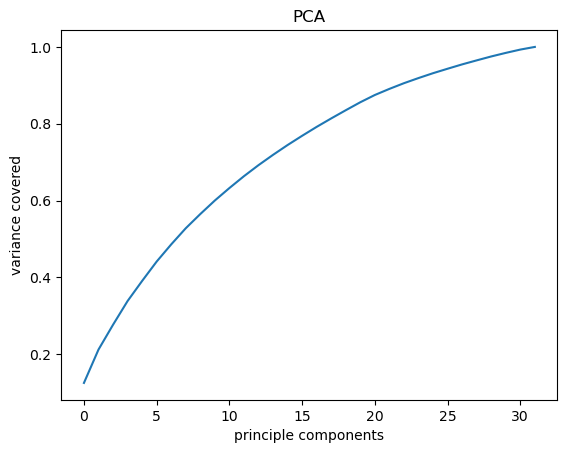

In [338]:
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))   
plt.xlabel('principle components') 
plt.ylabel('variance covered')   
plt.title('PCA')
plt.show()

from the above plot we can clearly see that 30 features will be enough to cover the maximum variance so we will extract 30 principle components for model building.

In [339]:
pca=PCA(n_components=30)
new_components=pca.fit_transform(X)

In [340]:
princi_comp=pd.DataFrame(new_components,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20','PC21','PC22','PC23','PC24','PC25','PC26','PC27','PC28','PC29','PC30'])
princi_comp

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30
0,0.268135,0.754483,0.433141,-1.132941,2.009980,0.954371,1.207930,-0.193363,-1.095817,2.416828,...,-0.112932,0.245913,0.150222,0.406654,-0.671134,-0.175253,-0.690944,0.358723,0.156261,-0.761553
1,0.614124,0.493988,1.563948,-1.913597,1.566286,-0.003954,-0.612021,-0.012668,-0.313001,1.300981,...,-1.269808,0.476217,-0.883824,1.361258,-0.475283,0.042691,0.336699,-0.085365,0.599926,0.052121
2,1.589178,0.754366,0.362535,-1.259679,1.056959,0.646685,0.285677,-0.508608,-1.314295,2.034842,...,-0.720554,-0.214943,0.626407,0.551867,-0.578564,-0.143411,-0.084357,1.536764,0.550479,-0.866350
3,0.174370,-0.444187,2.235182,-2.277412,1.120780,-0.526467,0.163459,0.057286,-0.421515,0.366499,...,-0.661179,-1.118874,-1.206455,-0.177861,-0.220839,0.116511,0.306924,0.111819,0.213534,-0.488099
4,-0.208225,0.094901,-0.489384,-0.722723,2.228622,0.001560,0.154997,1.094363,0.332427,1.913954,...,-1.043245,1.270435,0.434811,0.491875,-0.984419,-0.170820,-0.304323,-0.494540,0.319774,-0.180254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6551,0.159369,-1.526100,0.395137,-1.216999,-0.103841,-1.024066,-0.991372,-0.025797,-0.715745,1.162911,...,-0.046745,0.115466,0.204303,-0.285546,0.047030,-1.017515,-0.972023,0.041086,-0.197766,0.470637
6552,-0.322301,-1.137379,1.867262,-1.969706,-0.631761,-0.566367,0.384003,1.054351,-0.850949,-0.191647,...,-0.020487,-0.146956,-0.291006,-0.457174,-0.301195,-0.774987,-0.799875,0.086207,-0.694808,0.643482
6553,0.163308,0.137561,3.473787,-1.762800,0.483185,0.145828,-0.193730,-0.205283,-1.264040,-0.399259,...,-0.054243,-0.149882,-0.833929,-0.164243,0.182448,-1.530520,-0.422620,-0.453672,0.106491,0.863207
6554,1.512012,-1.292864,0.930051,-1.217951,-0.877415,-1.566576,-1.011323,1.774431,-0.341292,-0.877830,...,-0.535894,-0.539279,0.746187,-0.075575,0.135676,-0.904615,-0.669561,0.820708,-0.254982,1.122031


In [341]:
X=princi_comp

In [342]:
X

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30
0,0.268135,0.754483,0.433141,-1.132941,2.009980,0.954371,1.207930,-0.193363,-1.095817,2.416828,...,-0.112932,0.245913,0.150222,0.406654,-0.671134,-0.175253,-0.690944,0.358723,0.156261,-0.761553
1,0.614124,0.493988,1.563948,-1.913597,1.566286,-0.003954,-0.612021,-0.012668,-0.313001,1.300981,...,-1.269808,0.476217,-0.883824,1.361258,-0.475283,0.042691,0.336699,-0.085365,0.599926,0.052121
2,1.589178,0.754366,0.362535,-1.259679,1.056959,0.646685,0.285677,-0.508608,-1.314295,2.034842,...,-0.720554,-0.214943,0.626407,0.551867,-0.578564,-0.143411,-0.084357,1.536764,0.550479,-0.866350
3,0.174370,-0.444187,2.235182,-2.277412,1.120780,-0.526467,0.163459,0.057286,-0.421515,0.366499,...,-0.661179,-1.118874,-1.206455,-0.177861,-0.220839,0.116511,0.306924,0.111819,0.213534,-0.488099
4,-0.208225,0.094901,-0.489384,-0.722723,2.228622,0.001560,0.154997,1.094363,0.332427,1.913954,...,-1.043245,1.270435,0.434811,0.491875,-0.984419,-0.170820,-0.304323,-0.494540,0.319774,-0.180254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6551,0.159369,-1.526100,0.395137,-1.216999,-0.103841,-1.024066,-0.991372,-0.025797,-0.715745,1.162911,...,-0.046745,0.115466,0.204303,-0.285546,0.047030,-1.017515,-0.972023,0.041086,-0.197766,0.470637
6552,-0.322301,-1.137379,1.867262,-1.969706,-0.631761,-0.566367,0.384003,1.054351,-0.850949,-0.191647,...,-0.020487,-0.146956,-0.291006,-0.457174,-0.301195,-0.774987,-0.799875,0.086207,-0.694808,0.643482
6553,0.163308,0.137561,3.473787,-1.762800,0.483185,0.145828,-0.193730,-0.205283,-1.264040,-0.399259,...,-0.054243,-0.149882,-0.833929,-0.164243,0.182448,-1.530520,-0.422620,-0.453672,0.106491,0.863207
6554,1.512012,-1.292864,0.930051,-1.217951,-0.877415,-1.566576,-1.011323,1.774431,-0.341292,-0.877830,...,-0.535894,-0.539279,0.746187,-0.075575,0.135676,-0.904615,-0.669561,0.820708,-0.254982,1.122031


In [343]:
Y

Date
2008-12-01    0.592756
2008-12-02   -0.681888
2008-12-03   -0.681888
2008-12-04   -0.681888
2008-12-05    0.950465
                ...   
2017-06-21   -0.681888
2017-06-22   -0.681888
2017-06-23   -0.681888
2017-06-24   -0.681888
2017-06-25   -0.681888
Name: Rainfall, Length: 6556, dtype: float64

# Model Building-2

In [345]:
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.30,random_state=i) 
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)   
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('Best accuracy is', maxacc,'at random state',maxrs) 

Best accuracy is 0.8565954321348498 at random state 168


In [346]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=maxrs)

20% of the dataset will be used for testing, and the remaining 80% for training our machine learning models.

In [348]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
print()
def evaluate_regression(model, X, Y):
    print('Model Name:',model)
    # Splitting data into train and test sets
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=maxrs)
    
    # Training the model
    model.fit(X_train, Y_train)
    
    # Predicting y_test
    pred = model.predict(X_test)
    
    # Predicting y_train
    train = model.predict(X_train)
    
    
    # R-squared Score
    r2 = r2_score(Y_test, pred)
    print("R-squared Score:", r2)
    
    #R-squared Score on training data
    r3 = r2_score(Y_train, train)
    print("R-squared Score on training data:", r3*100)
    
    # Mean Absolute Error
    mae = mean_absolute_error(Y_test, pred)
    print("Mean Absolute Error:", mae)
    
    # Mean Squared Error
    mse = mean_squared_error(Y_test, pred)
    print("Mean Squared Error:", mse)
    
    # Root Mean Squared Error
    rmse =np.sqrt(mean_squared_error(Y_test, pred))
    print("Root Mean Squared Error:", rmse)
    
    
    
    # Cross Validation Score
    cv_score = cross_val_score(model, X, Y, cv=5, scoring='r2') 
    print("\nCross Validation Score:", cv_score)
    print("Cross Validation Score Mean:", cv_score.mean())
    
    # Result of accuracy minus cv scores
    result = r2 - cv_score.mean()
    print("R-squared Score - Cross Validation Score is", result*100)


In [349]:
# Linear Regression
LR = LinearRegression()
evaluate_regression(LR,X, Y)

Model Name: LinearRegression()
R-squared Score: 0.8564957691367531
R-squared Score on training data: 81.74602252304578
Mean Absolute Error: 0.25324704079334137
Mean Squared Error: 0.1460693261047388
Root Mean Squared Error: 0.38219017007863876

Cross Validation Score: [0.8511535  0.81235172 0.77334746 0.7337815  0.89108882]
Cross Validation Score Mean: 0.8123445996493007
R-squared Score - Cross Validation Score is 4.415116948745235


In [350]:
# Ridge Regressor
RDG = Ridge()
evaluate_regression(RDG,X, Y)

Model Name: Ridge()
R-squared Score: 0.8564894678003822
R-squared Score on training data: 81.74601957407847
Mean Absolute Error: 0.2532928107191714
Mean Squared Error: 0.14607574007561427
Root Mean Squared Error: 0.3821985610590577

Cross Validation Score: [0.85118211 0.81235887 0.77335504 0.73380428 0.89107631]
Cross Validation Score Mean: 0.812355322047632
R-squared Score - Cross Validation Score is 4.413414575275021


In [351]:
# Lasso Regressor
LS = Lasso()
evaluate_regression(LS,X, Y)

Model Name: Lasso()
R-squared Score: -2.5188339585202613e-06
R-squared Score on training data: 0.0
Mean Absolute Error: 0.8896217024759476
Mean Squared Error: 1.017877265014685
Root Mean Squared Error: 1.008899036085715

Cross Validation Score: [-0.00040329 -0.00798711 -0.00982258 -0.00048769 -0.04327991]
Cross Validation Score Mean: -0.012396117291583807
R-squared Score - Cross Validation Score is 1.2393598457625288


In [352]:
# Decision Tree Regression
DT = DecisionTreeRegressor()
evaluate_regression(DT,X, Y)

Model Name: DecisionTreeRegressor()
R-squared Score: 0.3647225939169303
R-squared Score on training data: 99.62056528394064
Mean Absolute Error: 0.4063663571482755
Mean Squared Error: 0.6466327998688034
Root Mean Squared Error: 0.8041348144862299

Cross Validation Score: [0.03123461 0.31420031 0.07990165 0.15604946 0.17926216]
Cross Validation Score Mean: 0.15212963678225375
R-squared Score - Cross Validation Score is 21.259295713467655


In [353]:
# Random Forest Regression
RFR = RandomForestRegressor()
evaluate_regression(RFR,X, Y)

Model Name: RandomForestRegressor()
R-squared Score: 0.7394586626829007
R-squared Score on training data: 95.54762561177706
Mean Absolute Error: 0.3612407151206248
Mean Squared Error: 0.2651984358607715
Root Mean Squared Error: 0.5149742089277594

Cross Validation Score: [0.64667989 0.70233796 0.58018346 0.58232212 0.68191273]
Cross Validation Score Mean: 0.638687233681684
R-squared Score - Cross Validation Score is 10.077142900121672


In [354]:
# Extra Tree Regression
ETR = ExtraTreesRegressor()
evaluate_regression(ETR,X, Y)

Model Name: ExtraTreesRegressor()
R-squared Score: 0.7842412542345588
R-squared Score on training data: 99.62056528394064
Mean Absolute Error: 0.34401135406992417
Mean Squared Error: 0.21961536886807712
Root Mean Squared Error: 0.4686313784501387

Cross Validation Score: [0.68577953 0.74536114 0.61837871 0.61920716 0.74622134]
Cross Validation Score Mean: 0.6829895740898605
R-squared Score - Cross Validation Score is 10.125168014469832


In [355]:
# ADA Boost Regressor
ABR = AdaBoostRegressor()
evaluate_regression(ABR,X, Y)

Model Name: AdaBoostRegressor()
R-squared Score: 0.40670449653919816
R-squared Score on training data: 42.31460992726157
Mean Absolute Error: 0.7399479320658158
Mean Squared Error: 0.6039004832831467
Root Mean Squared Error: 0.7771103417682373

Cross Validation Score: [0.35067135 0.47794508 0.26476856 0.43896083 0.28870435]
Cross Validation Score Mean: 0.3642100320281503
R-squared Score - Cross Validation Score is 4.249446451104788


In [356]:
# GradientBoostingRegressor
GBR = GradientBoostingRegressor()
evaluate_regression(GBR,X, Y)

Model Name: GradientBoostingRegressor()
R-squared Score: 0.7670380677539346
R-squared Score on training data: 81.66832191310979
Mean Absolute Error: 0.3495815011727602
Mean Squared Error: 0.23712605716599616
Root Mean Squared Error: 0.48695590885212203

Cross Validation Score: [0.72409259 0.70392936 0.64707399 0.62778326 0.76079564]
Cross Validation Score Mean: 0.6927349660569881
R-squared Score - Cross Validation Score is 7.430310169694643


In [357]:
# XGBRegressor
XGBR = XGBRegressor()
evaluate_regression(XGBR,X, Y)

Model Name: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)
R-squared Score: 0.7423797334841524
R-squared Score on training data: 98.50412766188408
Mean Absolute Error: 0.346174073718605
Mean Squared Error: 0.262225151791888
Root Mean Squared Error: 0.5120792436643844

Cross Validation Score: [0.7062

Among these models, the Linear Regression stands out with the highest R-squared score and the least difference between R-squared score and cross-validation score, indicating strong performance and generalization capability.

# Hyper parameter tuning on the best ML Model

In [370]:
# Choosing the  Linear Regression  as best model
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False],
    'n_jobs': [None, 1, 2, 4]
}



In [371]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(estimator=LR, param_grid=param_grid, cv=5)

In [372]:
grid_search.fit(X_train, Y_train)

GridSearchCV(cv=5, estimator=LinearRegression(),
             param_grid={'copy_X': [True, False],
                         'fit_intercept': [True, False],
                         'n_jobs': [None, 1, 2, 4], 'positive': [True, False]})

In [373]:
best_params = grid_search.best_params_
best_params

{'copy_X': True, 'fit_intercept': False, 'n_jobs': None, 'positive': False}

In [375]:
final_model_1 = LinearRegression(copy_X=True, fit_intercept=False, n_jobs=None, positive=False)


In [376]:
final_model_1.fit(x_train,y_train)

LinearRegression(fit_intercept=False)

In [377]:
pred=final_model_1.predict(X_test)

In [378]:
mse = mean_squared_error(Y_test, pred)

In [379]:
print("Mean Squared Error:", mse)

Mean Squared Error: 0.14423054642931485


In [380]:
r2_score(Y_test,pred)

0.8583022583572173

# Saving the model

In [381]:
import joblib
filename = "FinalModel_2_6.pkl"
joblib.dump(final_model_1, filename)

['FinalModel_2_6.pkl']

In [382]:
model=joblib.load("FinalModel_2_6.pkl")

prediction=model.predict(X_test)
prediction

array([-0.27303931,  1.81343265, -0.63808536, ..., -0.36757304,
       -0.49846563, -0.31207673])

In [383]:
a=np.array(Y_test)
df=pd.DataFrame()
df['Predicted']=prediction
df['Original']=a
df

,Predicted,Original
0,-0.273039,-0.081003
1,1.813433,1.804214
2,-0.638085,-0.681888
3,-0.495292,-0.681888
4,-0.239694,-0.081003
...,...,...
1307,-0.534195,-0.681888
1308,-0.270392,0.950465
1309,-0.367573,-0.681888
1310,-0.498466,-0.681888


In [384]:
df.tail()

,Predicted,Original
1307,-0.534195,-0.681888
1308,-0.270392,0.950465
1309,-0.367573,-0.681888
1310,-0.498466,-0.681888
1311,-0.312077,-0.681888


# Conclusion:

# 1. **Binary Classification:** Develop a predictive model to forecast whether or not it will rain tomorrow.

In [1]:
# Model-I achieves an accuracy of 92% with  ExtraTrees Classifier.
# Model-II achieves an accuracy of ~93% with ExtraTreesRegressor .

# 2. **Regression:** Develop a predictive model to predict the amount of rainfall for the next day.

In [ ]:
# Model-I achieves an accuracy of 90% with  ExtraTreesRegressor.
# Model-II achieves an accuracy of 85% with Linear Regression.